In [1]:
import numpy as np 
import pandas as pd 
from sklearn.decomposition import PCA
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d import proj3d
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from itertools import groupby
import random

In [2]:
orders = pd.read_csv("/home/maanvi/01_Maanvi/da/orders.csv")
orders.head()
#listofusers = orders["user_id"].unique().tolist()
#print(len(listofusers))
usersample = orders.loc[orders['eval_set']=='prior']
#usersample.head()
listofusers1 = usersample["user_id"].unique().tolist()
#print(len(listofusers1))

#indices = random.sample(range(len(listofusers1)), 50000)
#[listofusers1[i] for i in sorted(indices)]

#print(len(indices))
#print(indices)

randIndex = random.sample(range(len(listofusers1)), 50000)
randIndex.sort()
listofusers = [listofusers1[i] for i in randIndex]
#print(len(listofusers))
#print(listofusers)

sampledorders = orders[orders['user_id'].isin(listofusers)]
#sampledorders.head()

#now create a list of order_ids from sampled orders
listoforders1 = sampledorders["order_id"].unique().tolist()
print(len(listoforders1))

823322


In [3]:
prior = pd.read_csv('/home/maanvi/01_Maanvi/da/order_products__prior.csv')
sampledprior = prior[prior["order_id"].isin(listoforders1)]
print(len(sampledprior))
#prior.head()

7809719


In [5]:
train = pd.read_csv('/home/maanvi/01_Maanvi/da/order_products__train.csv')
train.head()

,order_id,product_id,add_to_cart_order,reordered
0,1,49302,1,1
1,1,11109,2,1
2,1,10246,3,0
3,1,49683,4,0
4,1,43633,5,1


In [6]:
products = pd.read_csv('/home/maanvi/01_Maanvi/da/products.csv')
products.head()

,product_id,product_name,aisle_id,department_id
0,1,Chocolate Sandwich Cookies,61,19
1,2,All-Seasons Salt,104,13
2,3,Robust Golden Unsweetened Oolong Tea,94,7
3,4,Smart Ones Classic Favorites Mini Rigatoni Wit...,38,1
4,5,Green Chile Anytime Sauce,5,13


In [7]:
aisles = pd.read_csv('/home/maanvi/01_Maanvi/da/aisles.csv')
aisles.head()

,aisle_id,aisle
0,1,prepared soups salads
1,2,specialty cheeses
2,3,energy granola bars
3,4,instant foods
4,5,marinades meat preparation


In [8]:
departments = pd.read_csv('/home/maanvi/01_Maanvi/da/departments.csv')
departments.head()

,department_id,department
0,1,frozen
1,2,other
2,3,bakery
3,4,produce
4,5,alcohol


Since the dataset is huge(32.4M rows), currently working on small portion of dataset by sampling 50000 users from the base of 200,000 users to achieve computations.

In [9]:
final_df = pd.merge(sampledprior,products, on = ['product_id','product_id'])
final_df = pd.merge(final_df,orders,on=['order_id','order_id'])
final_df = pd.merge(final_df,aisles,on=['aisle_id','aisle_id'])
final_df = pd.merge(final_df,departments, on=['department_id', 'department_id'])
print(final_df.shape)
final_df.head(10)

(7809719, 15)


,order_id,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order,aisle,department
0,2,33120,1,1,Organic Egg Whites,86,16,202279,prior,3,5,9,8.0,eggs,dairy eggs
1,26,33120,5,0,Organic Egg Whites,86,16,153404,prior,2,0,16,7.0,eggs,dairy eggs
2,120,33120,13,0,Organic Egg Whites,86,16,23750,prior,11,6,8,10.0,eggs,dairy eggs
3,327,33120,5,1,Organic Egg Whites,86,16,58707,prior,21,6,9,8.0,eggs,dairy eggs
4,537,33120,2,1,Organic Egg Whites,86,16,180135,prior,15,2,8,3.0,eggs,dairy eggs
5,582,33120,7,1,Organic Egg Whites,86,16,193223,prior,6,2,19,10.0,eggs,dairy eggs
6,623,33120,1,1,Organic Egg Whites,86,16,37804,prior,63,3,12,3.0,eggs,dairy eggs
7,800,33120,3,1,Organic Egg Whites,86,16,132856,prior,3,5,7,3.0,eggs,dairy eggs
8,901,33120,3,1,Organic Egg Whites,86,16,160657,prior,31,1,23,8.0,eggs,dairy eggs
9,1097,33120,14,1,Organic Egg Whites,86,16,30502,prior,5,4,0,8.0,eggs,dairy eggs


## Quick Overview on products sold and uniqueness.

In [10]:
#The most sold product is banana followed by bag of organic bananas and so on
final_df['product_name'].value_counts()[0:5]

Banana                    112712
Bag of Organic Bananas     91354
Organic Strawberries       63085
Organic Baby Spinach       58537
Organic Hass Avocado       51405
Name: product_name, dtype: int64

In [11]:
#Top 5 aisles categories
final_df['aisle'].value_counts()[0:5]

fresh fruits                  876467
fresh vegetables              823038
packaged vegetables fruits    425376
yogurt                        348832
packaged cheese               234532
Name: aisle, dtype: int64

In [12]:
#Top 5 departments categories
final_df['department'].value_counts()[0:5]

produce       2282282
dairy eggs    1302861
snacks         702577
beverages      643497
frozen         537574
Name: department, dtype: int64

## Clustering 
Want to find a possible clusters among the different customers and substitute single user_id with the cluster to which they are assumed to belong. Hence creating a dataframe with all the purchases made by each user

In [13]:
customer_prod = pd.crosstab(final_df['user_id'], final_df['department'])
print(customer_prod.shape)
customer_prod.head(10)

(50000, 21)


department,alcohol,babies,bakery,beverages,breakfast,bulk,canned goods,dairy eggs,deli,dry goods pasta,...,household,international,meat seafood,missing,other,pantry,personal care,pets,produce,snacks
user_id,,,,,,,,,,,,,,,,,,,,,
8,0,0,0,0,0,0,5,12,0,1,...,0,1,0,0,0,3,0,0,27,0
16,0,0,0,0,1,0,0,6,0,2,...,0,0,1,0,0,1,0,0,44,7
18,0,0,0,6,0,0,0,5,2,1,...,0,0,1,0,0,4,3,0,16,1
24,0,0,4,9,0,0,1,0,1,0,...,1,0,3,0,0,3,1,0,7,8
30,0,0,0,6,0,0,0,0,0,0,...,2,0,0,0,0,0,0,0,1,2
33,0,0,3,7,0,0,0,13,0,0,...,9,0,0,0,0,1,5,0,8,6
35,0,0,13,5,5,0,1,38,5,6,...,0,1,0,0,0,12,0,0,78,10
37,0,5,8,8,1,0,4,28,1,9,...,0,0,2,1,0,22,2,0,86,4
38,0,0,8,30,0,0,6,47,11,7,...,5,3,9,0,0,10,2,0,24,13


Here we can see that there are approximately 67k unique users and 21 departments

# Model 1 --> Clustering by reducing the no of dimensions, i.e, PCA

In [14]:
#Model 1
#Fitting it into 2 components
pca = PCA(n_components=2)
pca.fit(customer_prod)
sample_pca = pca.transform(customer_prod)
reduced_df = pd.DataFrame(sample_pca)
reduced_df.head()

,0,1
0,-30.010872,-13.592772
1,-16.323806,-21.062495
2,-41.060643,-8.356635
3,-48.587686,-1.583100
4,-56.255104,-3.221352


In [15]:
tocluster = pd.DataFrame(reduced_df[[1,0]])
#print(tocluster.shape)
tocluster.head()

,1,0
0,-13.592772,-30.010872
1,-21.062495,-16.323806
2,-8.356635,-41.060643
3,-1.583100,-48.587686
4,-3.221352,-56.255104


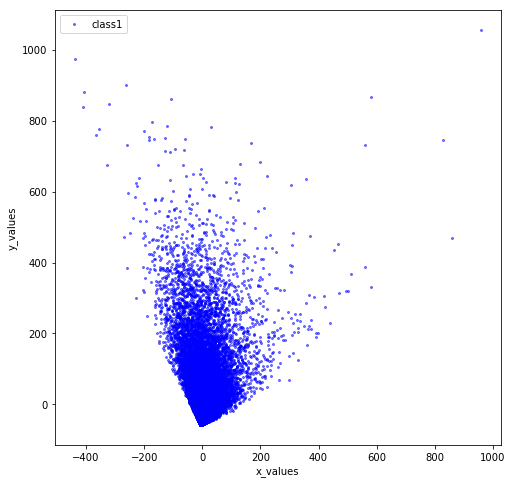

In [16]:
plt.figure(figsize=(8,8))
plt.plot(tocluster[1], tocluster[0], 'o', markersize=2, color='blue', alpha=0.5, label='class1')

plt.xlabel('x_values')
plt.ylabel('y_values')
plt.legend()
plt.show()

In [17]:
clusterer = KMeans(n_clusters=21,random_state=1).fit(tocluster)
centers = clusterer.cluster_centers_
c_preds = clusterer.predict(tocluster)


In [18]:
#CLuster centers
centers

array([[  -3.40145167,  -48.35727054],
       [ 152.05963132,  144.08547163],
       [ -40.99029176,  117.98387114],
       [  15.94645961,  267.62073715],
       [  32.30891992,   -3.75710742],
       [ -27.19681026,   54.36938226],
       [ -85.18325959,  464.69478217],
       [ -12.78529976,    7.28523367],
       [  27.78993909,  100.09303723],
       [ -64.58646876,  202.39602852],
       [ 348.44257742,  271.7562295 ],
       [  27.68772836,  173.97239922],
       [ 104.07143622,  351.56876936],
       [  74.28104502,  570.60659141],
       [ 757.11396185,  773.99403085],
       [-212.22923793,  741.46459198],
       [ -83.99642712,  327.21234876],
       [  12.46729752,  -32.41744986],
       [  84.2455832 ,   41.92897222],
       [  16.32668723,   39.29286248],
       [  -8.87917997,  -24.49590494]])

In [19]:
c_preds[0:200]

array([20, 20,  0,  0,  0,  0,  7,  5,  4,  0,  0,  0, 20,  7,  0,  0,  4,
        0,  0,  0, 20, 17, 20,  4,  0,  4,  2, 19,  0,  4,  0, 17, 17,  0,
       17,  0,  7,  0,  0, 18,  5, 11,  4,  8, 17,  0,  0,  0, 20,  0,  0,
       17,  2,  0,  0,  0, 10,  0, 20,  0,  0, 20,  7, 20, 11,  0, 19, 11,
        0,  0,  0,  0,  5,  0,  0, 17, 16,  0,  4,  0,  0,  0,  8,  5,  7,
        0, 20,  0,  5, 20,  0,  0, 20,  0,  8,  0,  0,  0,  7, 17, 20,  4,
       12, 20, 11,  0, 17, 17, 17,  4,  2, 20, 20,  5, 20, 20,  0, 20, 17,
        0,  0,  0,  0, 19,  0, 20,  0, 20,  7,  0,  0, 20, 20, 20, 20,  0,
       19,  4, 19,  0, 20,  0,  0,  3, 17,  0,  0, 17,  8,  0,  8, 18,  4,
        0, 18,  0,  7, 17,  2, 20,  7, 18,  0,  0,  0,  0, 20,  0, 11,  9,
       20, 17,  0,  7,  0, 20, 17, 17,  0,  7, 20,  0, 20,  0, 20,  0, 20,
        0, 17,  0, 19, 20,  0,  0, 17, 20,  0,  0,  0, 17], dtype=int32)

Here is how our clusters appear

In [20]:
cluster_segregation = customer_prod.copy()
cluster_segregation['cluster'] = c_preds
cluster_segregation.head(10)

department,alcohol,babies,bakery,beverages,breakfast,bulk,canned goods,dairy eggs,deli,dry goods pasta,...,international,meat seafood,missing,other,pantry,personal care,pets,produce,snacks,cluster
user_id,,,,,,,,,,,,,,,,,,,,,
8,0,0,0,0,0,0,5,12,0,1,...,1,0,0,0,3,0,0,27,0,20
16,0,0,0,0,1,0,0,6,0,2,...,0,1,0,0,1,0,0,44,7,20
18,0,0,0,6,0,0,0,5,2,1,...,0,1,0,0,4,3,0,16,1,0
24,0,0,4,9,0,0,1,0,1,0,...,0,3,0,0,3,1,0,7,8,0
30,0,0,0,6,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,2,0
33,0,0,3,7,0,0,0,13,0,0,...,0,0,0,0,1,5,0,8,6,0
35,0,0,13,5,5,0,1,38,5,6,...,1,0,0,0,12,0,0,78,10,7
37,0,5,8,8,1,0,4,28,1,9,...,0,2,1,0,22,2,0,86,4,5
38,0,0,8,30,0,0,6,47,11,7,...,3,9,0,0,10,2,0,24,13,4


We have formed the clusters based on departments, i.e, 21 departments. Now we can look into the clust_segregation crosstab for interesting pattern.

In [21]:
#No of customers in each cluster
cluster_count = []
cluster_names = []
for number in range(len(departments)):
    cluster_count.append(len(cluster_segregation[cluster_segregation['cluster']==number]))
    cluster_names.append('C'+str(number))

cluster_info = pd.DataFrame(cluster_count, cluster_names)
cluster_info.columns = ['Count']
cluster_info.transpose()

,C0,C1,C2,C3,C4,C5,C6,C7,C8,C9,...,C11,C12,C13,C14,C15,C16,C17,C18,C19,C20
Count,18635,315,1258,439,2481,2195,174,4672,1132,652,...,729,203,55,5,30,371,5325,848,1889,8535


### Top 5 departments for each cluster 

In [22]:
top_5 = []
colnames = []
for number in range(len(departments)):
    cluster = cluster_segregation[cluster_segregation['cluster']==number].drop('cluster',axis=1).mean()
    temp = cluster.sort_values(ascending=False)[0:5]
    top_5.append([temp.index[i] for i in range(5)])
    colnames.append('C'+str(number))
table = pd.DataFrame(top_5).transpose()
table.columns = colnames
table

,C0,C1,C2,C3,C4,C5,C6,C7,C8,C9,...,C11,C12,C13,C14,C15,C16,C17,C18,C19,C20
0,produce,dairy eggs,produce,produce,dairy eggs,produce,produce,produce,produce,produce,...,produce,produce,produce,dairy eggs,produce,produce,dairy eggs,dairy eggs,produce,produce
1,dairy eggs,snacks,dairy eggs,dairy eggs,beverages,dairy eggs,dairy eggs,dairy eggs,dairy eggs,dairy eggs,...,dairy eggs,dairy eggs,dairy eggs,snacks,dairy eggs,dairy eggs,beverages,snacks,dairy eggs,dairy eggs
2,beverages,beverages,pantry,snacks,snacks,pantry,snacks,snacks,snacks,pantry,...,snacks,snacks,snacks,beverages,pantry,snacks,snacks,beverages,snacks,frozen
3,snacks,produce,snacks,beverages,produce,snacks,pantry,frozen,beverages,snacks,...,beverages,beverages,beverages,produce,snacks,pantry,produce,produce,frozen,snacks
4,frozen,frozen,frozen,frozen,frozen,frozen,frozen,pantry,frozen,frozen,...,frozen,frozen,frozen,deli,frozen,frozen,frozen,frozen,beverages,pantry


Analysis of the clusters confirm the initial hypothesis that the products from the departments mentioned below are most generically bought by majority of customers:

1. Produce
2. Dairy Eggs
3. Snacks
4. Beverages
5. Frozen and pantry


In [23]:
sample = cluster_segregation.loc[cluster_segregation['cluster'] == 0]
#sample['user_id'].head(5)
#list(sample.rows.values)
userlist = sample.index.tolist()
#row = sample[0:1]
#sample.get_value(1,'user_id')
#cluster_segregation.loc[cluster_segregation['cluster'] == 2].shape
sample1 = sample.reset_index()
sample1.index.name = None
sample1.head()

department,user_id,alcohol,babies,bakery,beverages,breakfast,bulk,canned goods,dairy eggs,deli,...,international,meat seafood,missing,other,pantry,personal care,pets,produce,snacks,cluster
0,18,0,0,0,6,0,0,0,5,2,...,0,1,0,0,4,3,0,16,1,0
1,24,0,0,4,9,0,0,1,0,1,...,0,3,0,0,3,1,0,7,8,0
2,30,0,0,0,6,0,0,0,0,0,...,0,0,0,0,0,0,0,1,2,0
3,33,0,0,3,7,0,0,0,13,0,...,0,0,0,0,1,5,0,8,6,0
4,66,0,0,2,0,0,0,0,3,0,...,0,0,0,0,8,0,0,3,6,0


In [24]:
df1 = orders[orders['user_id'].isin(userlist)]
print(df1.shape)
df2 = df1.loc[df1['eval_set'] == "prior"]
print(df2.shape)
df2.head()

(127430, 7)
(108795, 7)


,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
201,2780889,18,prior,1,6,18,NaN
202,3106101,18,prior,2,0,17,1.0
203,1860960,18,prior,3,1,19,8.0
204,3133044,18,prior,4,0,16,6.0
205,1020460,18,prior,5,2,16,9.0


In [25]:
ap = pd.merge(sampledprior,df2, on = ['order_id','order_id'])
print(ap.shape[0])
ap.head()


620539


,order_id,product_id,add_to_cart_order,reordered,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,7,34050,1,0,142903,prior,11,2,14,30.0
1,7,46802,2,0,142903,prior,11,2,14,30.0
2,70,11067,1,0,128213,prior,2,6,15,4.0
3,70,11481,2,0,128213,prior,2,6,15,4.0
4,70,44008,3,0,128213,prior,2,6,15,4.0


In [26]:
ordprod = ap[['order_id','product_id']]
print(ordprod[:20])
#print(ordprod.get_value(0,'product_id'))

    order_id  product_id
0          7       34050
1          7       46802
2         70       11067
3         70       11481
4         70       44008
5         70       35824
6         78       32403
7         78       12899
8         78       21573
9         78       32455
10        78       16797
11       171       14645
12       171       48226
13       179       40604
14       179       31040
15       179       31242
16       179       30382
17       179       31343
18       179       21616
19       278       15269


In [27]:
x = ordprod["order_id"].unique()
#type(temp)
temp = x.tolist()
#print(temp)
big = []
big1 = []
j=0
for i in temp:
    l = []
    k = []
    #print(j)
    while(ordprod.get_value(j,'order_id')==i and j<ap.shape[0]-1):
        l.append(str(ordprod.get_value(j,'product_id')))
        #k.append(ordprod.get_value(j,'product_id'))
        j+=1
    #i+=1
    if(l):
        #big.append(tuple(l))
        big.append(l)
        #big1.append(k)
big.pop(len(big)-1)
#print(big)

f = open("myfile.txt", "w")
#f.write("hello")
#for a,b,c in l:
#    print(str(int(a))+","+str(int(b))+","+str(int(c))+",")
for i in big:
    #for j in i:
    #list1 = [1, 2, 3]
    str1 = ','.join(str(e) for e in i)
    str1 = str1+","
    #print(str1)
    f.write(str1+"\n")

In [28]:
from efficient_apriori import apriori

In [29]:
itemsets, rules = apriori(big, min_support=0.7,  min_confidence=1)
print(rules)

[]


In [32]:
itemsets, rules = apriori(big, min_support=0.007,  min_confidence=0.1)
print(rules)

[]


In [34]:
transactions1 = [['25931', '35163', '29662', '26283', '47766', '12036', '13497', '44953', '7969', '8518', '18689', '44299', '8381', '32205'], ['35951', '24852', '46206', '25890', '33120', '21903', '40545', '47766'], ['8571', '21292', '32303', '16283']]
transactions2 = [['25913','3563','29662'],['25913','3563','54661'],['29662','3563','54661']]
itemsets, rules = apriori(transactions1, min_support=0.05,  min_confidence=1)
#print(itemsets)
print(rules)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [36]:
# Import the libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from apyori import apriori
rules = apriori(transactions1, min_support = 0.7, min_confidence = 0.2, min_lift = 3, min_length = 2)
print(list(rules))

[]


The above functions using built-in efficient apriori function and the classical apriori function don't print any rules because apriori takes exponential time to finish computation 

In [37]:
#FP tree algorithm
class treeNode:
    def __init__(self, nameValue, numOccur, parentNode):
        self.name = nameValue
        self.count = numOccur
        self.nodeLink = None
        self.parent = parentNode      #needs to be updated
        self.children = {} 
#increments the count variable with a given amount    
    def inc(self, numOccur):
        self.count += numOccur
#display tree in text. Useful for debugging        
    def disp(self, ind=1):
        print ('  '*ind, self.name, ' ', self.count)
        for child in self.children.values():
            child.disp(ind+1)  

In [38]:
rootNode = treeNode('pyramid',9,None)

In [39]:
rootNode.children['eye'] = treeNode('eye',13,None)

In [40]:
rootNode.disp()

   pyramid   9
     eye   13


In [41]:
def createTree(dataSet, minSup=1): #create FP-tree from dataset but don't mine
    headerTable = {}
    #go over dataSet twice
    for trans in dataSet:#first pass counts frequency of occurance
        for item in trans:
            headerTable[item] = headerTable.get(item, 0) + dataSet[trans]
    for k in list(headerTable):  #remove items not meeting minSup
        if headerTable[k] < minSup: 
            del(headerTable[k])
    freqItemSet = set(headerTable.keys())
    #print 'freqItemSet: ',freqItemSet
    if len(freqItemSet) == 0: return None, None  #if no items meet min support -->get out
    for k in headerTable:
        headerTable[k] = [headerTable[k], None] #reformat headerTable to use Node link 
    #print 'headerTable: ',headerTable
    retTree = treeNode('Null Set', 1, None) #create tree
    for tranSet, count in dataSet.items():  #go through dataset 2nd time
        localD = {}
        for item in tranSet:  #put transaction items in order
            if item in freqItemSet:
                localD[item] = headerTable[item][0]
        if len(localD) > 0:
            orderedItems = [v[0] for v in sorted(localD.items(), key=lambda p: p[1], reverse=True)]
            updateTree(orderedItems, retTree, headerTable, count)#populate tree with ordered freq itemset
    return retTree, headerTable #return tree and header table

In [42]:
def updateTree(items, inTree, headerTable, count):
    if items[0] in inTree.children:#check if orderedItems[0] in retTree.children
        inTree.children[items[0]].inc(count) #incrament count
    else:   #add items[0] to inTree.children
        inTree.children[items[0]] = treeNode(items[0], count, inTree)
        if headerTable[items[0]][1] == None: #update header table 
            headerTable[items[0]][1] = inTree.children[items[0]]
        else:
            updateHeader(headerTable[items[0]][1], inTree.children[items[0]])
    if len(items) > 1:#call updateTree() with remaining ordered items
        updateTree(items[1::], inTree.children[items[0]], headerTable, count)

In [43]:
def updateHeader(nodeToTest, targetNode):   #this version does not use recursion
    while (nodeToTest.nodeLink != None):    #Do not use recursion to traverse a linked list!
        nodeToTest = nodeToTest.nodeLink
    nodeToTest.nodeLink = targetNode

In [44]:
def createInitSet(dataSet):
    retDict = {}
    for trans in dataSet:
        retDict[frozenset(trans)] = 1
    return retDict


In [45]:
initSet = createInitSet(big)


In [46]:
initSet

{frozenset({'34050', '46802'}): 1,
 frozenset({'11067', '11481', '35824', '44008'}): 1,
 frozenset({'12899', '16797', '21573', '32403', '32455'}): 1,
 frozenset({'14645', '48226'}): 1,
 frozenset({'21616', '30382', '31040', '31242', '31343', '40604'}): 1,
 frozenset({'15269', '3880', '41264', '42495', '47626', '9387'}): 1,
 frozenset({'10246', '15541', '18067', '196', '19660', '26152'}): 1,
 frozenset({'16464',
            '17322',
            '20031',
            '21938',
            '23909',
            '32433',
            '35825',
            '39735',
            '42215',
            '44042',
            '44799',
            '48702',
            '48927',
            '7326'}): 1,
 frozenset({'16797', '19660', '32538'}): 1,
 frozenset({'23405', '27178', '8559', '8671', '8781'}): 1,
 frozenset({'19508',
            '21137',
            '21903',
            '24852',
            '25890',
            '27730',
            '3376',
            '34358',
            '35784',
            '3999

In [47]:
#The FP-tree
myFPtree, myHeaderTab = createTree(initSet, 1)

In [48]:
myFPtree.disp()

   Null Set   1
     46802   92
       34050   1
       39108   5
         22046   4
           44172   1
           13914   1
           10623   1
       1511   1
         31883   1
           24631   1
             46844   1
               6606   1
                 33237   1
                   36   1
                     42827   1
                       19493   1
                         36024   1
                           22099   1
                             21719   1
                               37585   1
                                 15838   1
                                   11229   1
       44156   2
         49615   2
           33772   1
             9360   1
               47324   1
           3042   1
             33772   1
       42768   2
         40545   1
         42342   1
           17948   1
             1158   1
               8230   1
                 20549   1
                   44636   1
                     7006   1
       4461   1
         26047   1
  

                             25309   1
                               26477   1
                                 26878   1
                                   41815   1
         41787   1
           26348   1
         37687   1
           8048   1
             10441   1
               26152   1
                 13525   1
         33768   1
           46041   1
             15541   1
               26900   1
                 6087   1
                   14477   1
                     40712   1
         13575   1
           26900   1
             6901   1
               33059   1
         11759   1
           8048   1
             19691   1
               32403   1
                 17207   1
                   6615   1
         35269   1
           38775   1
             30558   1
         44683   1
           19691   1
             17207   1
               9020   1
                 15200   1
                   15541   1
         19691   1
           22703   1
         15541   1
          

           3298   1
         26604   6
           19348   1
             3298   1
               25653   1
           33452   1
             13733   1
               1090   1
                 10305   1
                   49381   1
                     25272   1
                       11323   1
                         14594   1
                           17335   1
                             35534   1
                               27924   1
           13575   1
             46931   1
           32478   1
             46802   1
               17122   1
           37687   1
             8048   1
               21292   1
                 19691   1
                   31474   1
         29418   1
           6799   1
             9075   1
               36759   1
                 16112   1
         33351   1
           33950   1
             12538   1
               37294   1
                 38893   1
         31506   3
           27086   1
             41844   1
               40199   1


                                   38729   1
                                     34946   1
                                       30718   1
                                         32677   1
                                           6493   1
                                             25212   1
                                               45087   1
         44142   1
           21938   1
             11182   1
               13870   1
                 26369   1
                   44449   1
                     40516   1
                       19677   1
                         46692   1
                           7419   1
                             23594   1
                               3682   1
                                 7412   1
                                   14874   1
                                     23400   1
                                       48123   1
                                         39450   1
                                           11030   1

         29487   1
           19348   1
             23341   1
               30169   1
                 9932   1
                   13679   1
         21616   1
           43295   1
         45066   3
           31683   2
             38689   1
               33279   1
                 17224   1
                   23765   1
                     47912   1
                       8929   1
                         26131   1
             11777   1
               2295   1
                 43713   1
                   24799   1
                     17224   1
                       14870   1
                         8929   1
           30489   1
             41787   1
               19508   1
                 2452   1
                   9047   1
                     32717   1
                       20113   1
                         32486   1
                           19448   1
                             645   1
         45007   1
           43295   1
             11520   1
               

               35263   1
         21573   2
           21288   1
             47402   1
               15772   1
                 6066   1
           40199   1
             26317   1
               23915   1
                 33956   1
                   41973   1
                     17957   1
                       7146   1
         37710   1
           17122   1
             3298   1
         20940   1
           16283   1
             26759   1
         3798   1
           17957   1
             47992   1
         35561   2
           43154   1
           40199   1
             13535   1
         3298   1
           22362   1
             16732   1
               14086   1
         41400   3
           13535   2
             32156   1
               21769   1
                 10310   1
                   38775   1
                     14032   1
             19691   1
               32156   1
                 21769   1
                   10310   1
                     38775   1
     

                   1215   1
                     2611   1
                       47521   1
                         44753   1
                           27639   1
                             38127   1
                               48878   1
         6184   1
           34050   1
             3298   1
               19691   1
                 23423   1
                   20738   1
                     32156   1
                       38883   1
         49235   2
           28199   1
             38293   1
               14467   1
                 26047   1
                   1695   1
                     35417   1
                       14704   1
                         44103   1
           16283   1
             11365   1
               42803   1
                 11266   1
         24964   1
           17794   1
             39928   1
               48364   1
                 40545   1
                   38383   1
                     1511   1
                       45646   1
      

           15872   1
             28413   1
               21385   1
                 42392   1
         19691   1
           16283   1
             39922   1
               34466   1
                 6615   1
                   47788   1
                     22507   1
                       14159   1
                         19828   1
                           5985   1
         40939   1
           10509   1
         46041   1
           3798   1
             40120   1
               20776   1
                 10310   1
         4938   1
         21292   1
           907   1
             3798   1
               30558   1
         21572   1
           26088   1
         14715   1
         40199   1
           33768   1
             35652   1
               42392   1
         18292   1
       37238   1
         2772   1
           18730   1
       40348   2
         32747   1
           31808   1
             24273   1
               24956   1
                 37132   1
               

                 41844   1
                   20842   1
                     45535   1
                       39180   1
         27966   4
           25890   1
             24184   1
               41844   1
                 28849   1
                   5818   1
                     29987   1
                       3952   1
                         39180   1
                           38650   1
           5876   1
             24838   1
               27521   1
                 43086   1
                   18583   1
           45007   1
             41844   1
               28849   1
                 34243   1
                   29987   1
                     22395   1
                       19173   1
                         25340   1
                           39180   1
           34969   1
             4799   1
               15613   1
                 24390   1
                   32537   1
                     2081   1
                       30599   1
                         2322 

                           9122   1
         22935   1
           45007   1
             28842   1
               43154   1
                 11777   1
                   45123   1
                     6873   1
                       35383   1
                         35948   1
                           44292   1
                             47630   1
                               1752   1
                                 25630   1
                                   7715   1
                                     12935   1
                                       29865   1
                                         30119   1
         27966   1
           4605   1
             23516   1
               28123   1
                 1025   1
                   11046   1
                     39162   1
                       14540   1
                         5172   1
         23909   1
           47185   1
             40214   1
               2708   1
                 24551   1
                  

             33768   1
               17872   1
                 17600   1
                   38996   1
                     4942   1
                       31640   1
                         45763   1
                           13113   1
         40706   1
           38777   1
             43768   1
               1244   1
                 20691   1
                   15503   1
         45007   1
           47734   1
             41588   1
               19376   1
                 48123   1
         21709   1
           46667   1
             46175   1
               37158   1
                 20754   1
                   36735   1
                     38003   1
                       29594   1
                         22025   1
                           28432   1
                             40789   1
         27966   1
           8193   1
             32734   1
               33572   1
                 41165   1
                   38985   1
                     32611   1
          

                             29262   1
         21288   1
           21333   1
             45200   1
               47479   1
                 41065   1
                   30252   1
                     35568   1
                       34185   1
                         18483   1
                           41360   1
                             45370   1
       17795   1
         15143   1
           32387   1
       14151   1
       48205   4
         19604   1
           13237   1
             12392   1
               12720   1
                 1599   1
                   37227   1
         36691   1
           13212   1
             45692   1
               21170   1
                 1094   1
                   17626   1
                     5513   1
         32465   1
           41178   1
             29925   1
               4422   1
                 17877   1
                   8187   1
                     30738   1
                       28126   1
         12392   1
          

                 17872   1
                   21405   1
                     47792   1
                       31766   1
                         18234   1
                           14870   1
                             49383   1
                               26104   1
         21386   1
           33731   1
             31343   1
               5769   1
                 18531   1
                   19508   1
                     18288   1
                       18370   1
                         17461   1
                           18880   1
                             44310   1
                               40556   1
                                 4304   1
                                   23584   1
         9076   1
           8012   1
             5922   1
               9245   1
         22935   1
           21616   1
             21288   1
               13829   1
                 27744   1
                   41658   1
                     19154   1
         21267   1
    

               21925   1
                 9409   1
                   10180   1
                     10734   1
                       49319   1
                         2656   1
                           39330   1
         31683   1
           13966   1
             24235   1
               36393   1
                 30597   1
                   28599   1
                     45588   1
                       19933   1
                         39185   1
                           926   1
                             42998   1
                               24410   1
                                 45836   1
                                   7812   1
                                     22188   1
                                       4387   1
                                         15231   1
                                           6812   1
         30169   1
           21410   1
             9580   1
               26444   1
                 49319   1
                   30618   1

                       25107   1
                         23478   1
       5782   2
         40709   1
           30731   1
             17419   1
               13110   1
                 28357   1
                   7151   1
                     19296   1
                       24527   1
         8803   1
           22128   1
       40604   1
         27307   1
           35855   1
             3243   1
               47145   1
                 22713   1
                   9243   1
                     46926   1
       38928   8
         48193   1
         22028   1
           48193   1
             37104   1
         37710   1
           39408   1
             45128   1
         26900   1
         13575   1
           31422   1
         33720   1
         41400   1
       38164   2
         8479   1
           37276   1
             11046   1
               49174   1
                 41004   1
                   31183   1
         37276   1
           31126   1
       13733   1
    

         6473   1
           7898   1
             41674   1
               31196   1
                 13514   1
                   12939   1
                     1233   1
       42936   1
         29315   1
           43488   1
             44100   1
               27770   1
                 32972   1
                   29502   1
                     31170   1
       28745   2
         8385   1
           18894   1
             41265   1
         39747   1
       39984   1
         44201   1
           44611   1
       1194   1
         45613   1
           31997   1
       48679   1
         17619   1
           14437   1
       35267   1
         18585   1
       30450   2
         48812   1
           19887   1
             23915   1
         39408   1
           32665   1
       37317   1
         45664   1
       18027   1
       30233   2
         29447   1
           12845   1
             29662   1
               24221   1
         38159   1
           20947   1
             1

               15806   1
                 43450   1
       32265   1
         12086   1
           24304   1
       6366   1
         17781   1
           8648   1
             24329   1
       33589   1
         859   1
           36372   1
             6119   1
       41242   1
         44500   1
           12870   1
       28031   1
         16959   1
           3578   1
             33474   1
               41096   1
                 23461   1
                   17242   1
                     30554   1
                       28837   1
                         40630   1
       32888   1
       27442   1
       9648   1
         38819   1
           5727   1
             34103   1
       28100   1
         49072   1
           8648   1
       39982   1
         4771   1
           7396   1
       21125   1
         4771   1
       31608   1
         47951   1
           7666   1
       13708   1
         8567   1
     21616   233
       31343   1
         40604   1
           31040  

         18523   1
           40571   1
             33787   1
               18234   1
                 24631   1
                   41690   1
                     11574   1
                       16611   1
                         10273   1
       25705   1
         17160   1
           32029   1
             35051   1
               21931   1
                 43432   1
       32864   4
         25630   2
           30385   1
         6137   1
           26566   1
         30021   1
           1525   1
       25146   1
         15290   1
           21927   1
             48988   1
               41352   1
                 41771   1
                   17699   1
                     32686   1
       17008   2
         48527   1
           19003   1
             12508   1
               47145   1
                 13639   1
                   9243   1
                     28900   1
                       10460   1
         48118   1
           30850   1
             15130   1
           

             15269   1
               41264   1
         39459   1
           7663   1
             46410   1
               27829   1
                 35823   1
                   23302   1
                     16465   1
                       30924   1
                         48148   1
         11408   1
           40338   1
             22699   1
               29153   1
                 15846   1
         21376   1
           790   1
             32955   1
               36552   1
                 27045   1
                   43876   1
                     22438   1
                       9574   1
                         40674   1
                           34841   1
                             1614   1
                               36101   1
                                 9459   1
         45064   1
           24427   1
             1559   1
               43638   1
                 41023   1
                   12544   1
                     22367   1
                       

                         42495   1
                           23579   1
                             35167   1
                               6655   1
         43154   1
           21709   1
             35948   1
               19125   1
                 28155   1
                   29529   1
                     41539   1
                       4493   1
                         13643   1
                           6244   1
                             14078   1
                               31541   1
                                 6960   1
         4799   1
           33768   1
             40604   1
               44449   1
                 29370   1
                   26856   1
                     23805   1
                       2432   1
                         3976   1
         9387   1
           44987   1
             44683   1
               38200   1
                 34234   1
                   25640   1
                     45698   1
                       3868   1
   

                         25610   1
                           29852   1
                             20469   1
         43772   1
           9623   1
             40063   1
               9421   1
                 47119   1
                   14096   1
                     17668   1
                       15841   1
         42265   1
           46979   1
             20842   1
               39190   1
                 30720   1
                   35234   1
                     11262   1
                       20469   1
         28842   1
           47630   1
             48109   1
               38508   1
       19660   19
         28204   2
           17794   1
           33198   1
             19678   1
               15613   1
                 5240   1
                   18382   1
                     18880   1
                       45013   1
                         35749   1
                           47388   1
         45007   2
           34969   1
             44987   1
      

                         19906   1
                           8257   1
                             1358   1
                               37939   1
         42736   1
           33731   1
             13870   1
               15937   1
                 42625   1
                   18618   1
                     29158   1
         432   1
           31553   1
             32211   1
               13217   1
         28199   1
           24799   1
             13198   1
               8309   1
                 27451   1
                   10243   1
                     48310   1
       49235   7
         16185   1
           9825   1
             2326   1
         22935   1
           34126   1
             12099   1
         29987   1
         14992   1
           12258   1
             15906   1
               27433   1
                 44706   1
         45066   1
         21616   1
           41220   1
             45603   1
               35336   1
                 41273   1
      

                               10580   1
                                 10096   1
         34969   2
           19348   1
             8859   1
               23734   1
                 42828   1
                   41593   1
           36086   1
             32433   1
               19068   1
                 8204   1
                   27196   1
                     11265   1
                       20463   1
                         19938   1
                           5259   1
                             23085   1
                               31173   1
                                 4480   1
         41950   1
           16759   1
             28289   1
               40897   1
         8193   1
           15937   1
             21497   1
               1529   1
                 45063   1
                   25256   1
                     29439   1
                       46511   1
         35221   1
           46979   1
             27156   1
               40310   1
          

                             14764   1
                               43221   1
                                 33468   1
                                   23821   1
                                     35865   1
                                       48736   1
         30233   1
           39812   1
             3761   1
         28993   1
           4461   1
             321   1
         31506   1
           11520   1
             18531   1
               15937   1
                 26497   1
                   38028   1
                     47601   1
                       9210   1
                         11933   1
                           41055   1
         45066   1
           33731   1
             34126   1
               41290   1
                 40604   1
                   2086   1
                     12206   1
                       15200   1
                         12290   1
                           26606   1
                             20542   1
                 

             46666   1
               47551   1
                 24876   1
                   24490   1
                     40989   1
       44234   1
         25588   1
           1194   1
             46842   1
               10032   1
                 7969   1
                   36086   1
                     18987   1
                       4421   1
                         5047   1
                           27418   1
                             44870   1
                               39092   1
                                 7469   1
                                   42810   1
       28985   6
         27360   1
           37215   1
             9837   1
               16234   1
                 29640   1
                   32645   1
                     36103   1
                       12455   1
                         3485   1
         27104   1
           38400   1
             7628   1
               32446   1
                 13712   1
                   26668   1
    

               28450   1
                 7606   1
                   40542   1
                     39680   1
                       6410   1
                         38909   1
                           27937   1
                             22231   1
                               20695   1
         28204   1
           9076   1
             22935   1
               25890   1
                 30489   1
                   21616   1
                     28849   1
                       38400   1
                         45535   1
                           19508   1
                             6104   1
                               45965   1
                                 19511   1
                                   29675   1
                                     5959   1
                                       10855   1
         9387   1
           15290   1
             40332   1
               14992   1
                 20754   1
                   20919   1
                     

                 4461   1
                   31338   1
                     37141   1
                       26309   1
                         45737   1
                           7130   1
         5077   1
           21709   1
             7969   1
               31154   1
                 1006   1
                   23763   1
                     2238   1
                       36106   1
                         19839   1
         24427   1
           49355   1
             44536   1
               42556   1
                 14850   1
         25890   1
           34126   1
             38028   1
               31927   1
                 10280   1
                   18546   1
                     30314   1
         40332   1
           32734   1
             28993   1
               287   1
                 34824   1
                   27757   1
         35221   1
           34126   1
             43789   1
               47630   1
                 30480   1
                   38596

         15937   1
           44570   1
             22849   1
               4796   1
                 31662   1
         26620   1
           5463   1
             38991   1
               14805   1
       40332   3
         13733   1
           9339   1
             46059   1
         4006   1
           40136   1
             15895   1
               46513   1
                 43888   1
                   3252   1
         49605   1
           46049   1
             19051   1
               41486   1
                 44213   1
                   18325   1
                     44957   1
       39877   2
         42828   1
           40174   1
             21376   1
               43713   1
                 39812   1
                   39947   1
                     34448   1
                       25513   1
                         25199   1
                           48099   1
                             37733   1
                               14486   1
                          

         39162   1
           20693   1
             775   1
               21323   1
       21497   1
         28986   1
           22640   1
       47977   1
         36316   1
           27985   1
             12817   1
               24186   1
                 24361   1
                   760   1
                     5314   1
                       35495   1
                         1139   1
                           15441   1
       28465   1
         34234   1
           13263   1
             42360   1
               28990   1
                 17703   1
                   3093   1
                     38482   1
       48205   3
         18439   1
           18805   1
         44987   1
           8193   1
             7628   1
               17631   1
                 23180   1
         39097   1
           21410   1
             39160   1
               25330   1
                 36360   1
                   16277   1
                     32167   1
                       38349

             47866   1
               31338   1
                 5385   1
                   3999   1
                     7533   1
                       42936   1
                         5445   1
                           23334   1
                             18212   1
                               13976   1
                                 25234   1
       14897   1
         7925   1
           48634   1
             6852   1
               22717   1
                 2902   1
       45104   1
         26800   1
           13292   1
             17149   1
               39040   1
       35246   1
         31836   1
       38444   3
         12013   3
           8671   1
             32360   1
               3801   1
                 32842   1
                   29284   1
                     26231   1
           33754   1
             33548   1
               31020   1
           23094   1
             20241   1
               26763   1
                 27364   1
                

       38200   1
         33351   1
           23094   1
             36315   1
               15860   1
                 14111   1
                   9864   1
                     31134   1
                       26666   1
       25985   1
         5618   1
           4966   1
             33090   1
               18135   1
                 49032   1
                   1458   1
       20378   1
         4347   1
           2962   1
             45063   1
               38419   1
                 15544   1
                   35970   1
                     37376   1
                       6527   1
       19006   1
       42959   1
         40254   1
           2750   1
             28016   1
               8366   1
                 28038   1
                   36321   1
                     14130   1
                       12147   1
                         25244   1
                           16585   1
                             40918   1
       17872   1
         3856   1
          

         41400   2
           46149   2
             26348   2
               46061   1
                 17957   1
                   49414   1
               13259   1
                 22362   1
         16696   1
           39921   1
             19734   1
               41406   1
                 22767   1
                   38818   1
                     2144   1
         26317   1
         35948   2
           29529   1
           19863   1
             29529   1
               33671   1
                 546   1
                   24703   1
                     26318   1
                       14780   1
                         43459   1
                           46686   1
                             33863   1
         26304   1
         47141   1
           41290   1
             46654   1
               35948   1
                 41351   1
                   29529   1
                     49517   1
                       14252   1
                         34423   1
           

             18023   1
               27038   1
         41400   3
           46149   1
           40939   1
             26348   1
               34005   1
                 42447   1
                   46309   1
         47402   1
         5312   1
         43154   3
           38928   2
             11266   1
             10326   1
               43739   1
           46149   1
             18023   1
         5258   2
           11759   1
             38928   1
               13575   1
                 36472   1
                   30591   1
         46061   1
           39657   1
             36472   1
               27839   1
         31651   2
           46061   2
             22802   1
               13424   1
                 36472   1
                   10441   1
                     27839   1
             35470   1
               27839   1
         31564   1
           35378   1
             15134   1
               17896   1
                 254   1
         4724   1
          

             38176   1
           4938   1
             14384   1
         46149   1
         31651   1
           3298   1
         36472   1
         17862   1
         42450   1
           13042   1
             12271   1
         47141   1
           40338   1
         21386   1
           26900   1
             23915   1
               18838   1
         21292   1
           11365   1
             13032   1
               28371   1
                 25286   1
                   41293   1
                     2382   1
         41400   1
           13575   1
         37710   1
           39657   1
             46562   1
               10509   1
                 10258   1
         46041   1
           13042   1
         8571   1
           42450   1
             27323   1
               39922   1
                 26900   1
                   34148   1
                     10628   1
         43154   1
           12916   1
             19887   1
         35652   1
         41406   1
   

         37104   1
         21573   1
           26317   1
             23888   1
               3265   1
                 22218   1
                   15680   1
         15200   1
           38300   1
             31805   1
         46149   2
           33081   1
             27790   1
               32538   1
                 40742   1
                   45488   1
                     32971   1
                       9535   1
                         41293   1
           15872   1
             907   1
               44042   1
                 31985   1
         4724   1
       8859   10
         13032   1
         13914   1
         38300   1
           13948   1
             4731   1
               18443   1
         39954   1
         23375   1
         21386   1
         4731   1
           18443   1
         46402   1
           10752   1
             25860   1
         30633   1
       19734   1
         29503   1
       25265   1
       43720   1
       37215   5
         31422

                 1398   1
                   30036   1
                     14252   1
                       46056   1
                         17271   1
             43892   1
               29529   1
                 14252   1
                   837   1
                     39350   1
                       17415   1
         12916   1
           6878   1
             35948   1
               31154   1
                 14252   1
                   8390   1
                     2022   1
                       40672   1
                         38347   1
                           17330   1
       22362   4
         21754   1
         44172   1
         14084   1
       9901   1
         33819   1
           27395   1
             28059   1
               40993   1
                 40132   1
       46473   1
       9076   5
         35221   1
           26604   1
             36316   1
               10032   1
                 42972   1
                   1831   1
                     3

         46149   1
           26348   1
             42500   1
               12427   1
                 13424   1
                   38300   1
       38050   1
         49299   1
           5787   1
             40307   1
               44215   1
                 5043   1
       37460   1
         38275   1
           45793   1
       33863   1
       40709   1
         46041   1
           49054   1
             30661   1
               15412   1
                 10321   1
                   32724   1
                     47368   1
                       22452   1
       43721   1
       23288   3
         33378   1
           42049   1
         14715   1
           13259   1
             23915   1
               14159   1
         46149   1
           40969   1
       45054   2
         45009   1
           30362   1
         32851   1
           45009   1
       27344   3
         44042   1
           14372   1
             39953   1
               41591   1
                 1200  

                           12848   1
                             30854   1
       22935   1
         31717   1
           20114   1
             34126   1
               38739   1
                 36086   1
                   11014   1
                     6166   1
                       41254   1
                         24604   1
                           25751   1
                             28070   1
       2855   1
         13424   1
       47031   1
         13500   1
           7836   1
             7326   1
               19658   1
                 44122   1
                   44470   1
       42731   1
         18564   1
           18988   1
             29509   1
               46029   1
       48183   1
       33081   1
       43409   1
         16920   1
           1006   1
             5422   1
               36310   1
                 33793   1
       23549   1
         46674   1
           39397   1
             18871   1
               26428   1
                 2011

                             12381   1
                               8668   1
                                 29251   1
                                   33295   1
                                     23673   1
                                       8042   1
                                         36427   1
                                           4893   1
                                             9174   1
         18987   1
           14875   1
             44843   1
               44704   1
                 9371   1
                   46338   1
         18610   1
           11281   1
             18292   1
               6340   1
                 29429   1
                   47941   1
                     36005   1
                       7349   1
                         13637   1
                           15003   1
         46842   1
           17341   1
             20561   1
               43195   1
                 33331   1
                   38716   1
                

           23262   1
             41584   1
               30465   1
         49054   1
           46656   1
             2327   1
               41584   1
         29553   1
           27429   1
             34407   1
               429   1
                 274   1
                   1503   1
                     27596   1
                       26412   1
                         35622   1
                           14005   1
                             23753   1
                               23646   1
                                 42491   1
                                   36570   1
                                     2813   1
                                       2918   1
                                         21490   1
       44570   1
         15359   1
           516   1
             22024   1
               11874   1
                 29176   1
       2581   1
         33394   1
           23817   1
             28345   1
               15304   1
                 41512

                         13679   1
                           14861   1
       38456   1
         34466   1
           14536   1
             33716   1
               43389   1
                 7358   1
                   19846   1
       23375   4
         24097   1
           40364   1
             3229   1
               49505   1
                 43857   1
                   7556   1
                     28983   1
         37766   2
           24097   2
             25985   2
               27903   1
                 5210   1
                   49505   1
                     3229   1
                       43857   1
                         25637   1
                           7443   1
               5210   1
                 49505   1
                   34459   1
                     25637   1
                       31283   1
                         13067   1
         7644   1
           24097   1
             28931   1
               11909   1
                 49505   1
        

               45290   1
                 1313   1
                   12323   1
                     8848   1
                       47706   1
         8424   1
           35752   1
             36144   1
               21925   1
                 20250   1
                   1148   1
                     39127   1
                       24673   1
                         17081   1
                           12406   1
                             33634   1
                               10358   1
                                 36513   1
                                   38409   1
       39581   2
         47966   1
           877   1
             40772   1
               27770   1
                 12726   1
         25706   1
           21293   1
             877   1
               27770   1
                 6089   1
                   48916   1
                     12726   1
       40348   1
         40723   1
           22952   1
             26709   1
               6340   1
     

                   32968   1
       17807   1
         6550   1
           2581   1
             18337   1
               12381   1
                 27705   1
                   49447   1
                     18498   1
                       29156   1
                         47946   1
                           38417   1
                             14965   1
                               37824   1
       15460   1
         42948   1
           24043   1
       32645   1
         1525   1
           9783   1
             38878   1
       12564   1
         19389   1
           25919   1
             12620   1
               26312   1
       24382   1
         18019   1
           37229   1
             48144   1
               30342   1
                 36346   1
       19902   1
         33966   1
       19051   1
         44533   1
           39351   1
             18325   1
       1631   1
         5711   1
           37965   1
             38307   1
               18329   1
     

                                   31945   1
                                     45113   1
                                       15767   1
                                         9788   1
                                           22286   1
                                             2635   1
           43961   1
             5450   1
               27104   1
                 24184   1
                   27156   1
                     4799   1
                       48099   1
                         16145   1
                           48974   1
                             16019   1
                               16122   1
                                 39704   1
           20995   1
             2966   1
               25659   1
                 18441   1
                   38456   1
                     260   1
                       13733   1
                         7175   1
                           46820   1
                             25340   1
                        

                         35425   1
             44359   1
               39877   1
                 38689   1
                   28986   1
                     11250   1
           46676   1
             17530   1
               15008   1
                 4609   1
           21938   1
             40396   1
               39619   1
                 25824   1
                   1511   1
                     40063   1
                       2825   1
           40706   1
             31717   1
               48679   1
                 38383   1
                   14462   1
                     12492   1
                       18152   1
                         46949   1
           42265   1
             21616   1
               28199   1
                 41950   1
                   9020   1
                     11712   1
                       25138   1
                         32717   1
                           39040   1
                             17915   1
         44632   5
      

           31015   1
           34969   2
             19057   1
               27344   1
                 21709   1
                   25659   1
                     46616   1
                       9825   1
                         38656   1
                           14332   1
                             31487   1
                               37496   1
                                 21567   1
                                   17622   1
                                     27061   1
                                       8574   1
                                         41852   1
             38456   1
               20754   1
                 45948   1
                   7079   1
           46802   1
             46820   1
               9124   1
                 47792   1
                   32177   1
                     2228   1
                       9390   1
                         24372   1
                           12162   1
         9020   1
           5337   1
      

                             29163   1
           17948   1
             23291   1
               48600   1
                 2822   1
           31717   1
             30391   1
               47977   1
                 35547   1
                   13984   1
                     48171   1
                       32740   1
                         45570   1
                           6347   1
                             48109   1
                               32139   1
                                 32537   1
                                   2809   1
                                     24499   1
                                       35958   1
                                         38182   1
           37646   1
             27156   1
               18362   1
                 5646   1
                   35223   1
                     2121   1
           26209   2
             31717   1
               11520   1
                 27521   1
                   42701   1
             

               6948   1
                 10343   1
                   20943   1
                     43821   1
         38511   1
           13702   1
             37164   1
               17460   1
                 28815   1
         24390   1
         30489   3
           21616   1
             35951   1
               6046   1
                 24489   1
                   17948   1
                     25659   1
                       18352   1
                         19706   1
                           30463   1
                             4781   1
                               36792   1
                                 22915   1
           6046   1
             24489   1
               45104   1
                 16616   1
                   18352   1
                     4781   1
                       22915   1
           43961   1
             34358   1
               2452   1
                 18583   1
                   47610   1
                     48110   1
            

                     48183   1
                       2091   1
                         3020   1
                           27681   1
                             38949   1
                               29142   1
                                 7413   1
                                   44199   1
                                     35823   1
                                       32315   1
                                         39760   1
           38996   1
             43889   1
               22866   1
                 31958   1
                   48093   1
                     544   1
                       28959   1
           40706   1
             34126   1
               6046   1
                 39475   1
                   18523   1
                     22620   1
                       9065   1
                         27012   1
         17794   2
           13870   1
             23543   1
               10814   1
                 37276   1
                   26738   1

                                           10226   1
             14927   1
           42736   1
             3464   1
           4920   1
             16953   1
               9387   1
                 41844   1
                   26384   1
                     19048   1
                       32553   1
                         44085   1
                           24253   1
                             9558   1
                               46059   1
                                 17304   1
                                   35234   1
                                     11983   1
                                       44614   1
                                         7158   1
                                           14927   1
                                             23760   1
                                               43629   1
                                                 34617   1
           49683   3
             31717   1
               5025   1
                 

                       28378   1
                         20259   1
                           25246   1
                             36375   1
                               48421   1
                                 48864   1
                                   43962   1
                                     39000   1
                                       4950   1
           18564   2
             45364   1
               25272   1
                 44830   1
                   25762   1
                     43087   1
             11865   1
               44830   1
                 25762   1
                   43087   1
           44987   1
             2350   1
               26648   1
                 39428   1
         27730   1
           20919   1
             24235   1
               3919   1
                 25691   1
         25588   2
           11782   1
             18610   1
               8710   1
                 25371   1
                   34745   1
                    

                   7644   1
                     37131   1
                       11384   1
                         41889   1
                           25537   1
                             17522   1
           46906   1
             7781   1
               24024   1
                 14901   1
                   28123   1
                     29675   1
                       4812   1
                         1443   1
                           15707   1
         9387   3
           47977   1
             21019   1
               26369   1
                 45622   1
                   23594   1
                     4462   1
                       14874   1
                         10108   1
                           16213   1
                             40795   1
                               39450   1
                                 11030   1
                                   2050   1
                                     2552   1
                                       28398   1

                                 43957   1
                                   3543   1
                                     33975   1
         22992   1
           21503   1
         29487   2
           20114   1
             5025   1
               2295   1
                 39475   1
                   44449   1
                     30382   1
                       33782   1
           41290   1
             43789   1
               42342   1
                 30776   1
                   42356   1
                     36956   1
                       34898   1
                         2063   1
                           32727   1
                             42948   1
                               1228   1
                                 35772   1
                                   48026   1
                                     26287   1
                                       39669   1
         30340   1
           3765   1
             1069   1
               21351   1
           

                             3618   1
                               6527   1
                                 46734   1
                                   31099   1
                                     3049   1
                                       27912   1
         19660   1
           28199   1
             8193   1
               3631   1
                 29388   1
                   1376   1
                     12383   1
         23734   1
           36086   1
             44245   1
               28634   1
                 3274   1
                   2225   1
                     48823   1
                       40877   1
                         7999   1
         47759   2
           26172   1
             13083   1
               25495   1
                 24273   1
                   3434   1
                     27696   1
                       36533   1
                         16057   1
                           2109   1
           11827   1
             3880   1
      

                 30591   1
                   30305   1
                     18460   1
                       19097   1
                         14111   1
                           40254   1
                             21447   1
                               4390   1
                                 48154   1
                                   41594   1
                                     6438   1
                                       19309   1
                                         36407   1
                                           23196   1
         43961   2
           39475   1
             19019   1
               2210   1
                 38720   1
                   29180   1
           48144   1
             45054   1
               23360   1
                 25124   1
                   47427   1
                     12565   1
         28842   1
           33065   1
             24186   1
               16768   1
                 34135   1
                   31029   1

                 26172   1
                   24235   1
                     18339   1
                       24890   1
                         12620   1
                           48154   1
                             22524   1
                               31150   1
                                 11215   1
                                   4514   1
                                     470   1
                                       20839   1
                                         30467   1
                                           18312   1
                                             46479   1
                                               18886   1
                                                 48868   1
                                                   42485   1
                                                     5833   1
                                                       38723   1
         23734   2
           22959   1
             33671   1
               8596  

                                               24373   1
                                                 10089   1
                                                   8324   1
                                                     8385   1
                                                       18353   1
                                                         44948   1
                                                           14661   1
           38689   1
             37158   1
               4421   1
                 9825   1
                   37119   1
                     44765   1
                       15950   1
                         49621   1
                           25197   1
                             31612   1
           31506   1
             35221   1
               31717   1
                 42450   1
                   26620   1
                     13535   1
                       20119   1
                         49131   1
                           35547   1
  

                 4879   1
         6184   1
           19348   1
             43295   1
               41787   1
                 10305   1
                   33664   1
         20842   1
           37229   1
             5194   1
               40136   1
                 34067   1
                   20191   1
                     28754   1
                       15887   1
                         28100   1
                           33079   1
                             20097   1
         17794   1
           5258   1
             42625   1
               46820   1
                 32433   1
                   25718   1
                     11481   1
                       10106   1
                         23029   1
                           6341   1
                             34622   1
                               31528   1
                                 7484   1
                                   34956   1
                                     18660   1
                     

                     10351   1
                       11437   1
                         23161   1
                           24139   1
                             44328   1
                               37900   1
           40706   1
             27104   1
               48205   1
                 5782   1
                   44570   1
                     30406   1
                       2846   1
                         3265   1
                           28601   1
                             28599   1
                               38985   1
                                 29479   1
                                   33222   1
                                     42533   1
                                       49201   1
           43961   1
             32691   1
               15902   1
                 27398   1
                   16882   1
                     13479   1
         39993   1
         3298   1
         30489   4
           17794   2
             42244   1
      

           48205   1
             22849   1
               39945   1
                 28450   1
                   34789   1
                     25464   1
                       8237   1
                         41743   1
                           27182   1
                             41873   1
         5818   1
           26172   1
             7925   1
               23204   1
                 21447   1
                   18327   1
                     37645   1
                       28763   1
         44487   1
           18988   1
             41385   1
               1017   1
                 6422   1
                   36270   1
                     27988   1
         33198   1
           27086   1
             25513   1
               18926   1
                 44765   1
                   27663   1
                     34335   1
         47977   1
           17872   1
             25513   1
               7419   1
                 15923   1
                   30975   1
    

           37504   1
         26604   1
           19348   1
             47141   1
               10673   1
                 41351   1
                   43986   1
                     21330   1
                       10580   1
                         1219   1
                           24347   1
                             35560   1
                               14078   1
                                 24727   1
         30233   1
           34   1
             25443   1
         44142   2
           33065   1
             43183   1
               26040   1
                 15097   1
                   22078   1
                     35357   1
           20114   1
             40174   1
               29553   1
                 43279   1
                   11679   1
                     1514   1
                       46107   1
                         23630   1
                           35601   1
                             9614   1
                               34467   1
   

             16965   1
               22825   1
                 33754   1
                   33787   1
                     21463   1
                       42244   1
                         15649   1
                           20323   1
                             28946   1
                               34664   1
                                 35926   1
             21938   1
               24184   1
                 1700   1
                   25931   1
                     19068   1
                       46650   1
                         40376   1
                           39400   1
                             7433   1
                               14132   1
                                 33207   1
             26209   1
               25890   1
                 34969   1
                   7021   1
                     38650   1
             27104   1
               20842   1
                 16185   1
                   25466   1
                     31040   1
       

                       30776   1
                         12206   1
                           35921   1
                             45603   1
                               18479   1
                                 47601   1
                                   28123   1
                                     2228   1
                                       9955   1
                                         44372   1
                                           12118   1
                                             13730   1
           21616   1
             10749   1
               14992   1
                 7628   1
                   45200   1
                     18339   1
                       31268   1
                         34862   1
                           22218   1
                             14651   1
                               41808   1
                                 27418   1
                                   40997   1
                                     9454   1


                                 6808   1
                                   31459   1
           39928   1
             19706   1
               7676   1
           20995   1
             5479   1
               7781   1
                 30776   1
                   39947   1
                     25138   1
                       31338   1
                         18502   1
                           5463   1
                             16773   1
         49235   3
           5785   1
             48988   1
           42265   1
             25890   1
               30489   1
                 24838   1
                   5785   1
                     6187   1
                       1194   1
                         46900   1
                           21417   1
                             11629   1
                               19478   1
                                 39448   1
                                   36322   1
                                     28079   1
             

                   47683   1
                     3776   1
                       27760   1
                         23465   1
         43961   2
           25146   1
             46906   1
               13870   1
                 33754   1
                   17429   1
                     11143   1
           31040   1
             44234   1
               28993   1
                 1117   1
                   2846   1
                     9339   1
                       46049   1
                         6489   1
                           27196   1
                             38747   1
                               4091   1
                                 46026   1
                                   39427   1
                                     4335   1
                                       26587   1
                                         29392   1
                                           26133   1
                                             2713   1
                     

                               23023   1
           35921   1
             13885   1
               32573   1
                 32605   1
                   27569   1
                     25350   1
           30776   1
             40396   1
               18027   1
                 15386   1
                   14858   1
                     43889   1
                       36469   1
                         42918   1
           436   1
             5699   1
               12545   1
                 26298   1
                   13147   1
                     27737   1
                       21057   1
                         13027   1
                           38750   1
                             38960   1
           39877   1
             1634   1
               29629   1
         47144   5
           15290   1
             2295   1
               4472   1
                 14218   1
                   1408   1
                     18471   1
           2086   1
             31433   1

               12324   1
                 1464   1
                   37262   1
                     32029   1
                       228   1
                         33626   1
                           2205   1
                             28879   1
                               36182   1
                                 21049   1
         11463   1
           14087   1
         38739   1
           42719   1
             18339   1
               10690   1
                 35871   1
                   5710   1
                     48485   1
                       21075   1
         15200   1
           32465   1
             44487   1
               16647   1
                 30727   1
                   6375   1
         17652   1
           9405   1
             4945   1
         33065   1
           4006   1
             4137   1
               397   1
                 36186   1
                   45511   1
                     34503   1
                       21793   1
         

                     35752   1
                       30850   1
                         287   1
                           39464   1
                             30532   1
                               41719   1
                                 31838   1
                                   48078   1
                                     13060   1
           9387   1
             17316   1
               44548   1
                 15923   1
                   15269   1
                     15008   1
                       36214   1
                         40277   1
                           21586   1
                             176   1
           28842   1
             41149   1
               23650   1
                 10248   1
           20842   1
             48679   1
               28849   1
                 7500   1
                   49111   1
                     13988   1
                       30463   1
                         5912   1
                           46087   1

         5077   5
           32689   1
             8424   1
               34358   1
                 6187   1
                   14168   1
                     19863   1
                       22952   1
                         14901   1
                           13536   1
                             8671   1
                               21410   1
                                 13225   1
                                   40214   1
                                     30994   1
                                       28911   1
                                         8362   1
                                           38970   1
                                             28448   1
                                               28241   1
                                                 44187   1
                                                   48044   1
           9387   1
             40332   1
               15902   1
                 7419   1
                   49544   1
  

                       43086   1
                         8671   1
                           17878   1
                             41065   1
                               45249   1
                                 4544   1
                                   5805   1
                                     744   1
             42701   1
               36011   1
                 1999   1
                   31766   1
                     3880   1
                       10912   1
                         22888   1
                           15386   1
                             48595   1
                               20520   1
                                 7461   1
                                   21614   1
                                     21010   1
                                       8320   1
             10246   1
               1999   1
                 8955   1
                   34134   1
                     3020   1
                       49215   1
                    

                         47357   1
                           6128   1
                             43263   1
                               32638   1
                                 42987   1
                                   79   1
                                     32570   1
                                       4933   1
                                         32773   1
                                           12100   1
                                             6558   1
           35221   1
             35951   1
               28849   1
                 49520   1
                   18027   1
                     12576   1
                       25138   1
                         2309   1
                           37147   1
                             10482   1
           45066   1
             24838   1
               15290   1
                 2295   1
                   4472   1
                     5322   1
                       14218   1
                         1

             25890   1
               44142   1
                 34969   1
                   21938   1
                     24184   1
                       20114   1
                         48205   1
                           47141   1
                             41588   1
                               32211   1
                                 31528   1
                                   36099   1
                                     43509   1
                                       1437   1
                                         6007   1
                                           18380   1
         45066   11
           10957   1
             16185   1
               23341   1
                 42356   1
                   7628   1
                     29615   1
                       1073   1
                         48548   1
                           2539   1
                             27658   1
           12745   1
             12614   1
               27999   1
        

                 10193   1
                   32396   1
                     38892   1
         13829   1
           49236   1
             42469   1
               17536   1
         45007   2
           26604   1
             8424   1
               16349   1
                 19068   1
                   44487   1
                     43875   1
                       8590   1
                         34134   1
                           3020   1
                             14211   1
                               31299   1
                                 33056   1
                                   28378   1
                                     44925   1
                                       28609   1
                                         22122   1
                                           36932   1
           17794   1
             48679   1
               38293   1
                 20734   1
                   12392   1
                     46755   1
                       3

                                   6962   1
                                     15719   1
           34126   1
             23734   1
               31683   1
                 8193   1
                   40709   1
                     1511   1
                       18811   1
                         21925   1
                           41593   1
                             5883   1
                               2838   1
                                 17747   1
                                   33897   1
                                     31853   1
           43789   1
             7559   1
               26047   1
                 22559   1
                   25647   1
                     37935   1
                       11574   1
                         12381   1
                           27596   1
                             37792   1
         16965   1
           42719   1
             40002   1
               14159   1
         4920   4
           38739   1
           

             1234   1
               27413   1
                 1891   1
                   33101   1
         44359   1
           4799   1
             32691   1
               35108   1
                 17334   1
                   48094   1
                     18891   1
                       15995   1
                         14464   1
                           42421   1
                             30662   1
         39928   1
           17795   1
             2825   1
               19706   1
                 7676   1
       19760   1
       42265   35
         30489   5
           3957   1
             22963   1
               34050   1
                 45104   1
                   25718   1
                     34   1
                       33736   1
                         21846   1
                           23017   1
           24024   1
             8988   1
           39877   1
             32655   1
               5456   1
                 46584   1
                  

                     31869   1
                       24253   1
                         48109   1
                           20549   1
                             30756   1
                               4193   1
                                 47044   1
                                   27741   1
                                     40634   1
           30489   1
             4421   1
               47890   1
                 3464   1
                   546   1
                     4163   1
                       44275   1
         24964   3
           17794   1
             31717   1
               39877   1
                 19678   1
                   26384   1
                     14678   1
                       7500   1
                         1025   1
                           39040   1
                             38863   1
           30233   1
             45535   1
               10492   1
                 44014   1
                   5383   1
           25890   1
    

           17872   1
             21174   1
               10621   1
                 14702   1
         1158   1
           36695   1
             24062   1
               8074   1
         35951   2
           2086   1
             25931   1
               44422   1
                 47492   1
           20842   1
             40545   1
               45613   1
                 38944   1
                   5699   1
                     48099   1
                       14650   1
                         12324   1
         13733   1
           35163   1
             37011   1
               24531   1
                 12463   1
         26620   1
           27247   1
             22908   1
               14358   1
         39993   1
           47357   1
             27356   1
               3999   1
                 42987   1
                   13997   1
                     3390   1
                       25191   1
                         30926   1
         8518   1
           44359   

             42450   1
               28849   1
                 46175   1
                   5373   1
                     38656   1
                       46505   1
                         12381   1
                           19584   1
           45066   1
             47144   1
               5025   1
                 35921   1
                   28745   1
                     47526   1
           19348   1
             27156   1
               38383   1
                 10017   1
                   45382   1
           42450   1
             28849   1
               31066   1
                 42585   1
                   12206   1
                     21295   1
                       5322   1
                         45613   1
                           21417   1
                             38656   1
                               48104   1
                                 33636   1
                                   41198   1
                                     2979   1
       

                 8566   1
       21386   8
         36534   1
           11492   1
             18226   1
         32134   1
         49416   1
           22501   1
         8021   1
           41390   1
             20693   1
               13143   1
                 6228   1
                   21323   1
         605   1
           20693   1
             775   1
         7963   1
           49416   1
             19904   1
               20957   1
                 22501   1
         8174   1
           7781   1
             38400   1
               7963   1
                 14999   1
                   44545   1
         22825   1
           23291   1
             42944   1
               3767   1
       18618   2
         2716   1
           45210   1
             43726   1
               43050   1
         45210   1
           12023   1
             19240   1
               36192   1
                 43050   1
                   35420   1
       49520   11
         32211   2
       

                     13997   1
                       47516   1
                         35234   1
                           16818   1
           8859   1
             5782   1
               19691   1
                 33614   1
                   9837   1
                     24142   1
                       31573   1
                         27240   1
                           3740   1
                             34483   1
                               46131   1
                                 27189   1
                                   26633   1
                                     41651   1
                                       12519   1
                                         39225   1
                                           17430   1
                                             5757   1
                                               1542   1
                                                 23292   1
                                                   35275   1
         

                                               40050   1
                                                 24450   1
                                                   31349   1
             44843   1
               46941   1
                 46673   1
                   33184   1
                     29345   1
                       35458   1
                         21351   1
                           20021   1
                             43483   1
                               26698   1
                                 6131   1
                                   38448   1
                                     44384   1
                                       29136   1
                                         48602   1
         39993   1
           5782   1
             20561   1
               20682   1
                 15950   1
                   27706   1
                     47059   1
                       27313   1
                         46823   1
                           

                             31766   1
                               44371   1
                                 34134   1
                                   22451   1
                                     21150   1
                                       12121   1
         42110   1
           25299   1
         5876   1
           1463   1
             2024   1
               13774   1
         45066   2
           30391   1
             46842   1
               21333   1
                 1511   1
                   47759   1
                     15386   1
                       4792   1
                         46107   1
                           14780   1
                             29088   1
                               121   1
                                 23424   1
           40310   1
             20082   1
               18534   1
                 35458   1
                   13237   1
                     46059   1
                       32085   1
                       

           39041   1
             11678   1
               33041   1
                 11323   1
                   47903   1
                     47726   1
       8707   1
       33731   10
         29987   1
           21497   1
             29898   1
               45763   1
                 36746   1
                   28527   1
         24489   1
           4942   1
             31663   1
               35986   1
                 7018   1
         26620   2
           34448   1
             27548   1
               45013   1
                 5020   1
                   46992   1
           31343   1
             5818   1
               32734   1
                 35108   1
                   45535   1
                     27548   1
                       32446   1
                         33622   1
         31635   1
           38312   1
             15984   1
         8193   1
           31343   1
             36550   1
               9124   1
                 15613   1
           

                         11576   1
                           8006   1
                             40878   1
                               23541   1
                                 13203   1
                                   5653   1
                                     36227   1
                                       13252   1
                                         25861   1
                                           22831   1
                                             9159   1
                                               29910   1
                                                 17699   1
                                                   48732   1
                                                     27330   1
                                                       46945   1
                                                         36493   1
                                                           17654   1
         34050   1
           7175   1
             48183   1
     

           49520   1
             27663   1
               37033   1
                 1649   1
                   6213   1
         32650   1
           33452   1
             36107   1
               29941   1
                 37606   1
                   27629   1
                     48186   1
                       24004   1
                         29116   1
                           18792   1
                             38139   1
                               45905   1
         17316   1
           22360   1
         30142   1
         32211   1
         38777   1
         6046   1
           5782   1
             20378   1
               45646   1
                 3919   1
                   38511   1
                     23687   1
                       28449   1
                         3179   1
                           12939   1
                             31173   1
                               17824   1
                                 45160   1
                     

                 7598   1
                   11072   1
                     6703   1
         31683   1
           15424   1
             5782   1
               13966   1
                 15359   1
                   3318   1
                     12218   1
                       6473   1
                         36393   1
                           37606   1
                             18201   1
                               21243   1
                                 11909   1
                                   47516   1
                                     29078   1
                                       12313   1
                                         26428   1
                                           24410   1
                                             17250   1
         48742   1
           25554   1
             2170   1
               7878   1
         40706   2
           22825   1
             13966   1
               19048   1
                 32211   1
              

                       10743   1
         20842   1
           32923   1
             36005   1
         31066   1
           33791   1
             44500   1
               44911   1
                 38113   1
                   12853   1
                     41640   1
                       23229   1
                         34776   1
         25544   1
           33548   1
             7533   1
               27413   1
                 3661   1
                   23219   1
                     23334   1
                       25147   1
                         11670   1
         8021   1
           5612   1
             11005   1
               44643   1
                 45009   1
                   24521   1
         2361   1
           40268   1
             11494   1
               30518   1
                 39377   1
         14901   1
           11121   1
             32684   1
               13866   1
                 43951   1
                   44801   1
                    

         31506   1
           12980   1
             18761   1
               4193   1
         23909   2
           28985   1
             44359   1
               46673   1
                 1541   1
                   28379   1
                     18849   1
                       21311   1
           21938   1
             41844   1
               45064   1
                 10151   1
                   31564   1
                     26324   1
                       13909   1
                         44290   1
                           48004   1
                             42913   1
                               9360   1
                                 25613   1
                                   49296   1
                                     39582   1
                                       14044   1
         30489   3
           23909   1
             41950   1
               44683   1
                 18352   1
                   16617   1
                     12290   1
       

                 36554   1
       29900   1
         6044   1
           38796   1
       20561   1
         4565   1
           13194   1
             1649   1
               42787   1
                 22684   1
       17021   1
         36476   1
       27104   27
         5785   1
           40709   1
         8277   1
           34126   1
             2966   1
               48364   1
                 1999   1
                   48857   1
                     23029   1
                       26723   1
                         8053   1
                           12714   1
                             12488   1
                               28381   1
                                 38902   1
         27360   1
           3243   1
             30668   1
               5819   1
                 43205   1
                   3696   1
                     12894   1
                       33852   1
                         26861   1
                           11983   1
                  

           12980   1
             11461   1
               24097   1
                 21410   1
                   26576   1
                     47944   1
         35042   1
           13249   1
             26172   1
               43693   1
                 49279   1
                   21011   1
                     14563   1
                       37776   1
                         8326   1
                           46945   1
                             41984   1
                               14512   1
         27104   1
           23734   1
             19678   1
               29987   1
                 27243   1
                   4086   1
                     8138   1
                       45063   1
                         10243   1
                           11198   1
                             41376   1
         47977   1
           15872   1
             17795   1
               34487   1
                 25330   1
                   48423   1
                     427

                                       23673   1
                                         6673   1
                                           33948   1
                                             35277   1
         22275   1
           10892   1
             39464   1
               12720   1
                 42606   1
                   20915   1
                     42948   1
         35045   1
           30623   1
             37417   1
               12250   1
                 17951   1
         32403   1
           7644   1
             12427   1
               17341   1
                 13249   1
                   1062   1
                     46756   1
         17316   1
           32429   1
             6052   1
               22178   1
                 38797   1
                   11009   1
                     920   1
                       3126   1
                         11845   1
                           28148   1
                             4354   1
                

               29026   1
         49605   1
           22620   1
             46260   1
               33439   1
                 40403   1
                   34067   1
                     3847   1
                       11984   1
         8204   1
           36956   1
             21868   1
               35206   1
                 28599   1
                   14447   1
                     49354   1
                       9762   1
                         33949   1
                           20269   1
                             33127   1
                               11943   1
                                 19182   1
                                   39564   1
                                     4119   1
         32403   1
           8670   1
             25804   1
               26305   1
         18234   1
         14126   1
           45961   1
         14999   1
           46473   1
             42441   1
               26856   1
                 4947   1
                

                                     37464   1
                                       37825   1
                                         49416   1
                                           49621   1
                                             48720   1
                                               48600   1
                                                 25197   1
                                                   5684   1
                                                     48795   1
                                                       40824   1
                                                         8986   1
                                                           37001   1
                                                             6008   1
                                                               1846   1
         42265   2
           26604   1
             27344   1
               41844   1
                 22825   1
                   36011   1
                    

         6908   1
           1159   1
             10429   1
         11710   1
         13424   1
           16464   1
             20985   1
               15703   1
                 44562   1
         12916   1
           33452   1
             22206   1
               20050   1
                 29060   1
                   32521   1
         27344   1
           7521   1
             38772   1
               4269   1
                 7090   1
         4347   1
           43409   1
             27196   1
               44325   1
                 12232   1
                   27676   1
                     43389   1
                       8224   1
                         7358   1
                           703   1
                             41039   1
         18362   1
           23341   1
             3990   1
               34217   1
                 19076   1
                   42404   1
                     6300   1
                       29309   1
                         8680

                 8558   1
         26620   1
           21019   1
             13870   1
               12872   1
                 24010   1
                   6347   1
                     5684   1
         36011   1
           4472   1
             42110   1
               40593   1
                 9741   1
                   2099   1
                     48595   1
                       20899   1
                         6361   1
                           38622   1
                             34557   1
         25513   2
           48745   2
             25133   1
               31847   1
                 8558   1
             11712   1
               25133   1
                 31847   1
                   8558   1
         35221   4
           40396   1
             12576   1
               19006   1
                 48109   1
                   15655   1
                     30784   1
                       13254   1
           18564   1
             39409   1
               14

                                   29429   1
                                     22667   1
                                       39428   1
                                         28829   1
                                           23504   1
                                             26002   1
                                               35721   1
                                                 44614   1
                                                   16260   1
                                                     13941   1
         46562   1
           13627   1
       4149   3
         27325   1
           17902   1
             49131   1
         42731   1
           311   1
             46059   1
               41771   1
                 45946   1
                   30839   1
                     30122   1
                       42333   1
         41665   1
           21174   1
             29223   1
               22474   1
                 26751   1
                   1

                             47630   1
                               9515   1
                                 3896   1
                                   45013   1
                                     5134   1
                                       27355   1
                                         24263   1
                                           45866   1
                                             40724   1
                                               32   1
                                                 29027   1
         45007   1
           4210   1
             17794   1
               890   1
                 4799   1
                   18362   1
                     23375   1
                       27325   1
                         35383   1
                           10644   1
                             25513   1
                               8138   1
                                 5612   1
                                   22025   1
                         

                                       36026   1
         16696   1
           14875   1
             46138   1
         33452   1
           27730   1
             45123   1
         39408   1
           7131   1
             13083   1
               22882   1
                 21243   1
                   3179   1
                     5917   1
                       43645   1
         42719   1
           46842   1
             21333   1
               49605   1
                 19734   1
                   34487   1
                     45290   1
                       28299   1
                         9558   1
                           877   1
                             2022   1
                               44267   1
                                 23313   1
                                   27410   1
         7781   1
           36316   1
             22959   1
               36070   1
                 9327   1
                   43692   1
                     18534   1
   

             554   1
               2054   1
                 5770   1
                   31610   1
                     1228   1
                       14708   1
         500   1
           13245   1
             15057   1
               34909   1
                 13540   1
                   39204   1
                     3605   1
                       2239   1
         17835   1
           39055   1
             31242   1
               9507   1
         43122   1
         39928   1
           46049   1
             39702   1
         35336   1
           22959   1
             10500   1
               2469   1
                 7930   1
                   32951   1
                     35376   1
                       40549   1
                         3148   1
         13380   1
           13829   1
             5612   1
               46650   1
                 49241   1
       35124   1
         7513   1
       45622   2
         7533   1
           37665   1
             31140 

                             8260   1
                               3381   1
                                 42403   1
                                   29748   1
                                     2799   1
         23375   1
           45603   1
             18963   1
               1700   1
                 40516   1
                   19125   1
                     3740   1
                       8413   1
                         46778   1
         42736   1
           1700   1
             44422   1
               47325   1
                 3382   1
                   38426   1
                     43447   1
         26165   2
           43772   1
             22035   1
               32747   1
                 6347   1
                   38322   1
                     9480   1
                       9964   1
           32578   1
             9047   1
               19204   1
                 22069   1
                   6606   1
                     38226   1
                

           46692   1
             9426   1
         28842   1
           5450   1
             43295   1
               31553   1
                 17341   1
                   23322   1
                     27662   1
                       14971   1
                         23819   1
                           20895   1
                             34704   1
         39475   1
           29926   1
             18382   1
               14650   1
         32689   1
           33731   1
             890   1
         35951   1
           26620   1
             43129   1
               23645   1
                 37276   1
         44359   1
           26384   1
             6348   1
               13166   1
                 1360   1
                   4269   1
                     12756   1
         37646   1
           30233   1
             43789   1
               48532   1
                 28931   1
                   13245   1
                     19156   1
                       49269

             30406   1
               8475   1
                 15925   1
                   1110   1
                     34939   1
                       45810   1
                         47438   1
                           32497   1
                             12695   1
         15424   1
           7736   1
             32573   1
               7243   1
         49098   1
           35264   1
             274   1
               49269   1
                 10329   1
                   8341   1
                     1539   1
         13966   1
           14897   1
             264   1
               44697   1
                 31467   1
                   22598   1
                     34827   1
         48628   1
           20588   1
             21526   1
               46620   1
         42240   1
           34739   1
             24701   1
               4540   1
                 35532   1
                   41611   1
         13870   1
           28553   1
             34217   1

         26795   1
           33460   1
       45679   1
       46041   4
         11512   1
           17758   1
             32331   1
               2481   1
                 34993   1
                   13654   1
                     34968   1
                       17576   1
         46522   1
           19173   1
             48527   1
               45061   1
                 43693   1
                   19604   1
                     5451   1
                       22695   1
                         24890   1
                           22656   1
                             36189   1
                               35257   1
                                 33200   1
                                   7386   1
                                     15256   1
                                       15208   1
         27360   1
           27307   1
             47865   1
               43693   1
                 34   1
                   7631   1
                     5210   1
       

             1543   1
       24838   25
         8859   1
           3919   1
             39411   1
               34739   1
                 36406   1
                   40146   1
                     27696   1
                       36183   1
                         46476   1
                           38016   1
                             35088   1
         5025   1
           28745   1
             32299   1
               25647   1
                 5115   1
                   23354   1
         23341   1
           13966   1
             16254   1
               5248   1
                 33398   1
                   44849   1
         19677   1
           24009   1
             21777   1
               30482   1
                 19036   1
         15424   1
           28156   1
             32740   1
         41220   1
           2664   1
             24475   1
         47900   1
           22677   1
             47011   1
               36207   1
         12606   1
           

             41351   1
               44475   1
                 34789   1
                   10580   1
                     19910   1
                       1219   1
         46676   1
           46654   1
             35108   1
               28553   1
                 7952   1
                   49533   1
                     34565   1
                       42944   1
                         15143   1
         44487   1
           16290   1
             37552   1
               4778   1
                 7533   1
                   14372   1
         5438   1
           48071   1
             6074   1
               1214   1
                 29   1
                   23474   1
         13829   1
           41588   1
             24810   1
         48205   1
           44987   1
             46654   1
               30021   1
                 15613   1
         24097   1
           44475   1
             44267   1
               31958   1
                 37047   1
                  

                       36792   1
                         23977   1
           30233   1
             42445   1
               10621   1
                 43210   1
                   47166   1
         19678   1
         8193   1
           34050   1
             14897   1
               790   1
                 47717   1
                   24518   1
                     2152   1
         17830   1
         20114   1
           37646   1
             16759   1
               31066   1
                 5750   1
                   47865   1
                     45840   1
                       280   1
                         48437   1
                           11837   1
                             33095   1
                               8767   1
                                 44622   1
                                   39092   1
                                     5262   1
                                       37330   1
         28985   1
           35951   1
             17948 

         1529   1
           9007   1
             36393   1
               28450   1
                 19151   1
                   5101   1
                     13828   1
                       8167   1
         47357   1
         20842   1
           27020   1
             14379   1
               21293   1
                 31495   1
       32734   5
         10132   1
           10603   1
             47866   1
               25753   1
                 27509   1
                   6300   1
                     6975   1
                       26706   1
                         19174   1
                           12258   1
                             9648   1
                               36766   1
         12206   1
           36865   1
             48094   1
         39619   1
           13829   1
             36735   1
               22888   1
                 12320   1
                   17200   1
                     12846   1
                       10709   1
         38944   

         14668   1
           49099   1
       3243   1
         8887   1
       41787   7
         7963   1
           32429   1
             8239   1
               7361   1
                 39558   1
                   32981   1
                     49416   1
                       5973   1
                         42508   1
                           26452   1
                             3740   1
                               21344   1
                                 34949   1
                                   1994   1
                                     23898   1
                                       21999   1
                                         38531   1
                                           30461   1
                                             9521   1
                                               7173   1
                                                 40173   1
                                                   24692   1
         14897   1
           12508  

                   40937   1
       23037   1
       49131   4
         12872   1
         1203   1
           22113   1
         19677   1
           44042   1
       14146   1
         16021   1
           19203   1
             27164   1
       33787   1
         24954   1
           22124   1
             19156   1
       13885   1
         33647   1
           35289   1
             4391   1
               37092   1
                 6899   1
                   48903   1
                     6403   1
       32757   1
       49075   1
         41665   1
           35140   1
             9047   1
               25230   1
                 27531   1
                   9036   1
                     29623   1
                       38908   1
       28476   2
         10831   1
           21929   1
         21929   1
       27360   5
         18339   1
           14147   1
             43693   1
               28577   1
                 43209   1
                   28634   1
             

         48697   1
           10017   1
             33716   1
               37107   1
                 24390   1
                   5250   1
                     2380   1
                       43726   1
                         10551   1
         18615   1
         37220   1
           43409   1
             32211   1
               35413   1
                 48634   1
                   12945   1
                     35584   1
                       6350   1
                         20474   1
                           30114   1
                             23572   1
       39180   2
         29871   2
           2996   1
             15312   1
           45850   1
       1824   1
         19208   1
       28862   1
         5566   1
           41831   1
             27769   1
               15268   1
                 21640   1
       18019   1
         8555   1
           41808   1
       35378   1
         39953   1
       46667   6
         44987   1
           26283   1
       

         48118   1
           19731   1
             27284   1
               5723   1
                 18451   1
                   12951   1
                     31933   1
       17008   2
         41351   1
           40261   1
             34027   1
               47366   1
                 5535   1
                   36005   1
         31981   1
           45064   1
             12481   1
               30183   1
                 43693   1
                   42936   1
                     2124   1
                       10902   1
                         13955   1
                           40299   1
                             3293   1
       22509   1
       32338   2
         36691   1
           11563   1
             43719   1
         14063   1
           46779   1
             10275   1
       23801   1
         38563   1
           47521   1
             11078   1
               24157   1
                 43560   1
                   28579   1
                     42103  

           3856   1
             22882   1
               9558   1
                 24985   1
                   48071   1
                     12156   1
       294   1
         22017   1
           27045   1
             28454   1
               43645   1
                 18071   1
                   28582   1
                     46928   1
                       43052   1
                         32440   1
                           34954   1
                             26588   1
                               35368   1
                                 23320   1
                                   29167   1
       8460   1
         19145   1
           36664   1
             45531   1
       46473   1
         11292   1
           28464   1
             39083   1
               16782   1
                 14290   1
                   10107   1
                     31829   1
                       43607   1
       6383   3
         8481   1
           49397   1
             6436   1
  

       11365   2
         9020   1
       4472   1
         48523   1
           22504   1
             47156   1
               11193   1
                 6291   1
                   47114   1
                     3884   1
                       42234   1
                         31139   1
       20583   1
         27811   1
           5475   1
             37890   1
       30720   1
         14678   1
           46266   1
             46306   1
       33120   1
         19677   1
       20345   1
         46562   1
       8025   1
         7806   1
           28226   1
       6137   1
         15678   1
       18615   1
         17976   1
       2120   1
         29548   1
           36984   1
       23423   1
         26405   1
           47348   1
             17419   1
               13948   1
                 17168   1
                   19565   1
       13535   3
         17679   1
         33249   1
           45229   1
         12078   1
       48104   1
         31927   1
   

             23929   1
               45771   1
                 5436   1
                   15078   1
                     3775   1
       45149   1
         49630   1
           40877   1
             43946   1
               476   1
                 19936   1
       29615   1
         25544   1
           5031   1
             12508   1
               34220   1
                 9544   1
                   33044   1
                     48158   1
                       19987   1
                         15595   1
       1514   1
         30661   1
           44585   1
             14519   1
               11063   1
       5535   1
         42832   1
           44277   1
     16185   99
       8193   1
         17835   1
           5337   1
             10814   1
               35838   1
                 19415   1
                   40585   1
       18288   1
         436   1
           42193   1
             33540   1
       48364   1
         276   1
           2770   1
       39928

                                         33125   1
           16387   1
             42397   1
         4920   1
           42265   1
             8277   1
               31343   1
                 29987   1
                   25931   1
                     41198   1
                       38622   1
                         24160   1
                           17630   1
                             47780   1
                               38544   1
                                 29598   1
         28204   2
           49520   1
             29127   1
               45570   1
           42265   1
             24964   1
               46906   1
                 32734   1
                   21376   1
                     24954   1
                       19003   1
                         22124   1
                           34034   1
                             35321   1
         42265   1
           30489   1
             35221   1
               21019   1
                 49520   1
 

                               40604   1
                                 13535   1
                                   46175   1
                                     5449   1
                                       31766   1
                                         23645   1
                                           33647   1
                                             13447   1
                                               18740   1
           47209   3
             24838   1
               44683   1
                 31066   1
                   47672   1
                     30776   1
                       34243   1
                         21174   1
                           14874   1
                             9955   1
                               8882   1
                                 18844   1
             27966   1
               40706   1
                 10749   1
                   38293   1
                     44449   1
                       10132   1
          

                     48679   1
                       27521   1
                         15937   1
                           21295   1
                             4562   1
                               23543   1
                                 14852   1
                                   37029   1
                                     39527   1
                                       21614   1
                                         44670   1
                                           9438   1
                                             5718   1
                                               3235   1
             30489   1
               8424   1
                 33731   1
                   23375   1
                     28156   1
                       9020   1
                         39190   1
                           31893   1
                             34325   1
             19660   1
               45066   1
                 49075   1
                   17871   1
       

                   13575   1
           39275   2
             8571   1
               8048   1
             26604   1
               33768   1
                 25588   1
                   29223   1
                     21385   1
                       26115   1
                         46931   1
                           1993   1
           49683   2
             28985   1
               7156   1
                 20767   1
                   23383   1
                     19845   1
             43713   1
               38890   1
                 13629   1
                   4163   1
                     35176   1
                       17630   1
                         4600   1
                           895   1
                             29138   1
           35951   1
             38768   1
               9839   1
                 651   1
                   5068   1
           6184   1
             5258   1
               21195   1
                 30827   1
                   3

           30450   1
             28849   1
               34050   1
                 35108   1
                   40709   1
                     45061   1
                       48857   1
                         5024   1
                           20323   1
                             18011   1
                               16332   1
                                 10762   1
         32478   3
           43154   1
             21292   1
               29223   1
           21292   1
             30827   1
               33768   1
                 25588   1
                   28413   1
                     4620   1
           33279   1
             20518   1
               12732   1
                 33366   1
         13966   1
           43129   1
             46900   1
               7500   1
                 22281   1
                   6341   1
                     47325   1
                       22372   1
                         41242   1
                           33257   1


                                     10476   1
                                       47379   1
           27156   1
             16616   1
               45578   1
                 26668   1
                   33575   1
                     48385   1
                       16206   1
                         18514   1
         5646   1
         30450   3
           4149   2
             19767   1
               33106   1
           20842   1
             38293   1
               33120   1
                 20776   1
                   16521   1
                     11140   1
                       25230   1
                         46575   1
                           16525   1
                             49267   1
                               18696   1
                                 37586   1
                                   31523   1
         44359   1
           16759   1
             48364   1
               7021   1
                 1194   1
                   6631   1
     

                 42768   1
                   43713   1
                     43768   1
                       26346   1
                         31927   1
                           28824   1
         43961   1
           35140   1
             34134   1
               3020   1
                 18629   1
                   11212   1
                     13107   1
                       28020   1
                         44557   1
                           7705   1
                             41624   1
         42265   2
           6760   1
           21292   1
             16283   1
               15872   1
                 34466   1
                   7147   1
         4605   1
           24964   1
             18362   1
               35939   1
                 35199   1
                   26047   1
                     18583   1
                       46990   1
                         35072   1
                           19519   1
                             29506   1
          

                                 37565   1
                                   34876   1
             41844   1
               42736   1
                 34050   1
                   19678   1
                     26369   1
                       9825   1
                         28745   1
                           40593   1
                             7156   1
                               20583   1
                                 11068   1
                                   16616   1
                                     13877   1
                                       23554   1
                                         23836   1
                                           32585   1
           24964   1
             25890   1
               28842   1
                 8174   1
                   27336   1
                     31869   1
                       1244   1
                         23339   1
                           26842   1
                             10243   1
        

                               24571   1
                                 23493   1
                                   15880   1
                                     7230   1
                                       38947   1
                                         38506   1
         33768   2
           20940   1
             18067   1
           40939   1
             20940   1
               17207   1
                 12899   1
                   21385   1
                     44853   1
         43154   1
           38928   1
             17122   1
               14715   1
                 39657   1
                   14966   1
         21288   2
           34005   1
           17207   1
             43867   1
         32478   1
           35561   1
             21573   1
               11759   1
                 9839   1
                   9358   1
                     17313   1
                       30406   1
                         13032   1
                           12271   1


                   43248   1
                     6793   1
           20955   1
             13042   1
               16974   1
                 25952   1
           13575   1
             9644   1
               39814   1
         2433   1
           26115   1
         37710   3
           41787   1
           46149   1
           42450   1
             41400   1
               46149   1
                 17122   1
                   3298   1
                     16732   1
                       46521   1
                         14966   1
                           30280   1
                             28952   1
         45051   1
           11266   1
         4920   3
           9076   1
             41400   1
               31759   1
                 14715   1
           14715   2
             46061   2
               31422   1
               40214   1
         5258   5
           21386   3
             17122   1
               13914   1
                 10509   1
             2413

           48226   1
             26586   1
               33210   1
         23537   1
           19972   1
         13885   1
           18618   1
             9510   1
               49363   1
                 16213   1
                   7860   1
                     29229   1
                       39394   1
                         26250   1
                           32511   1
                             40549   1
         13259   1
           33956   1
             10173   1
         5785   1
           40199   1
             49621   1
               9245   1
                 19268   1
         432   1
           31486   1
             9550   1
               36164   1
                 42421   1
                   45885   1
                     4365   1
                       8792   1
                         39253   1
         32655   1
           26172   1
             17807   1
               45177   1
                 33337   1
                   44714   1
         32478  

             26317   1
               21572   1
           29794   1
             43720   1
           20955   1
             20448   1
               31134   1
           30450   1
             33081   1
               12427   1
                 17313   1
                   26914   1
                     30162   1
                       29794   1
                         14966   1
                           45806   1
                             1747   1
         21288   1
           19691   1
             19508   1
               10326   1
                 42803   1
                   29223   1
                     32923   1
                       8079   1
         5258   2
           21195   1
             42392   1
           18023   1
             6615   1
               169   1
         30489   2
           3957   1
             48364   1
               17872   1
                 4472   1
                   18811   1
                     23178   1
                       790   1
 

                           9102   1
         46802   1
           19019   1
             37464   1
               9390   1
                 30855   1
                   46194   1
                     25399   1
         39877   1
           6104   1
             14462   1
               44787   1
                 33748   1
                   37173   1
                     8444   1
                       15223   1
         27086   1
           21616   1
             41844   1
               31683   1
                 16185   1
                   10246   1
                     49131   1
                       7559   1
                         6615   1
                           25043   1
                             3661   1
                               21914   1
                                 6111   1
                                   17988   1
                                     25821   1
                                       9739   1
                                         3631

                 4799   1
                   35887   1
                     36085   1
                       31927   1
                         5883   1
                           38601   1
           35561   1
             42768   1
               19508   1
                 15200   1
                   11266   1
                     33147   1
                       44371   1
                         9601   1
                           40068   1
           41844   1
             46906   1
               19508   1
                 48171   1
                   43504   1
                     45364   1
                       49215   1
                         39430   1
                           25407   1
                             44329   1
                               36313   1
                                 3663   1
           16965   1
             17600   1
               7559   1
                 38656   1
                   4792   1
                     16613   1
             

               45066   1
                 44359   1
                   11520   1
                     7781   1
                       23405   1
                         34551   1
                           15613   1
                             8479   1
                               4932   1
                                 37011   1
                                   3479   1
                                     33782   1
                                       33454   1
           20995   1
             42450   1
               13870   1
                 5212   1
                   3599   1
                     27695   1
                       26790   1
                         43875   1
                           11481   1
                             5550   1
                               48595   1
                                 49621   1
                                   8006   1
                                     48720   1
                                       34012   1
  

           43713   1
             5456   1
               2846   1
                 11782   1
                   1440   1
                     9637   1
         8174   1
           260   1
             7916   1
               29594   1
                 49215   1
                   29650   1
                     8809   1
         16953   1
           17313   1
             12542   1
         35951   2
           32538   1
             20670   1
               22218   1
                 15790   1
           1700   1
             43967   1
               36070   1
                 11005   1
                   14778   1
                     29993   1
                       24177   1
                         32550   1
                           33854   1
         35628   1
           4097   1
             4614   1
               19398   1
         2120   1
           33065   1
             14715   1
               45190   1
                 26317   1
                   116   1
             

             45066   1
               43295   1
                 49075   1
                   36714   1
                     24118   1
                       9521   1
                         10082   1
           46979   1
             5785   1
               44987   1
                 30233   1
                   30696   1
                     3919   1
                       41557   1
                         43781   1
           40706   1
             31717   1
               30391   1
                 47144   1
                   7781   1
                     1117   1
                       311   1
                         6218   1
                           10199   1
                             41783   1
                               3982   1
           45066   1
             30391   1
               19678   1
                 42828   1
                   23622   1
                     12254   1
                       47380   1
         11520   1
           21267   1
            

               15655   1
                 28   1
                   31444   1
                     10197   1
                       18156   1
         26209   4
           20842   1
             37215   1
               10872   1
                 49655   1
                   2879   1
                     10908   1
                       1878   1
           24838   1
             30391   1
               32689   1
                 32655   1
                   45123   1
                     42404   1
                       31342   1
                         12157   1
                           2470   1
                             11023   1
                               12941   1
                                 47403   1
           45066   1
             38689   1
               38293   1
                 46616   1
                   36854   1
                     43889   1
                       48109   1
                         15008   1
                           9028   1
         

                                         7999   1
                                           39035   1
                                             44971   1
                                               38936   1
           11777   1
             37250   1
               13702   1
         34969   2
           18465   1
             31683   1
               21417   1
                 3765   1
                   15610   1
                     28769   1
                       10121   1
                         12974   1
                           8907   1
           8518   1
             14992   1
               11068   1
                 141   1
                   10585   1
                     14819   1
         28934   1
           43086   1
             28682   1
         30489   2
           17794   1
             22474   1
               20583   1
                 3464   1
                   44204   1
                     36506   1
                       17861   1
           2660

                                                       5014   1
                                                         33045   1
                                                           1612   1
         49235   2
           34969   1
             34358   1
               10749   1
                 40604   1
                   25931   1
                     4461   1
                       9327   1
                         32299   1
                           28785   1
                             10385   1
                               13924   1
                                 12127   1
                                   6649   1
           31717   1
             27521   1
               45104   1
                 35140   1
                   31720   1
                     24276   1
                       29772   1
         31553   1
           40396   1
             22959   1
               48370   1
                 23339   1
                   45698   1
                     61

                   32018   1
                     6541   1
                       8425   1
         43295   1
           26165   1
             8174   1
               8736   1
                 33352   1
                   1890   1
                     46962   1
                       920   1
                         49318   1
         43713   1
           24799   1
             28571   1
         28985   3
           41950   1
             27104   1
               44359   1
                 46906   1
                   22035   1
                     24561   1
                       13166   1
                         4421   1
                           329   1
                             24810   1
                               30442   1
                                 11030   1
                                   29285   1
                                     43406   1
                                       22365   1
           20114   1
             46667   1
               10749   

                             23693   1
                               34605   1
                                 33045   1
                                   20123   1
                                     12251   1
           28985   1
             31717   1
               24184   1
                 2120   1
                   890   1
                     27360   1
                       7628   1
                         41665   1
                           11461   1
                             14999   1
                               27196   1
                                 26040   1
                                   30162   1
                                     11136   1
                                       48705   1
                                         8006   1
                                           2015   1
                                             41771   1
                                               21246   1
                                                 7

                     13885   1
                       2450   1
                         28918   1
                           46962   1
                             39149   1
                               22432   1
           27796   1
             42701   1
               39928   1
                 4421   1
                   36082   1
                     26586   1
                       30759   1
                         3631   1
                           8246   1
                             26475   1
                               25242   1
         46616   2
           6489   1
             5240   1
               8594   1
           40002   1
             48523   1
               6489   1
                 23622   1
                   22828   1
                     7035   1
                       29103   1
                         11494   1
                           27992   1
         19660   10
           22935   1
             5876   1
               18465   1
               

               24489   1
                 18027   1
                   2855   1
                     12845   1
                       49621   1
                         4487   1
                           33195   1
                             31772   1
                               30836   1
           45007   1
             30391   1
               22963   1
                 32655   1
                   17706   1
                     22025   1
                       22298   1
                         26899   1
         14129   1
           49111   1
             43988   1
         26709   1
           31720   1
             47516   1
               13287   1
         32478   1
           5785   1
             8021   1
               42450   1
                 42828   1
                   13380   1
                     3599   1
                       25513   1
                         40063   1
                           13885   1
                             35986   1
              

                                               39031   1
                                                 41775   1
         29487   1
           32566   1
             2519   1
               32553   1
                 37892   1
         20842   1
           26634   1
             41213   1
         21938   1
           34466   1
             14218   1
               7806   1
                 30463   1
                   43673   1
                     330   1
       8859   16
         47348   1
           11451   1
         3990   1
           44487   1
             45566   1
               21553   1
                 13998   1
                   40459   1
                     13474   1
                       29554   1
         23484   1
           48023   1
             9614   1
               515   1
                 149   1
         21288   2
           33768   1
             3265   1
               47788   1
                 25133   1
                   26759   1
                  

               15923   1
                 34027   1
                   1447   1
                     12258   1
                       31292   1
                         49260   1
                           43428   1
                             42931   1
                               5757   1
                                 14048   1
                                   46378   1
                                     7075   1
         48142   1
           21572   1
             1957   1
       46802   15
         25653   1
           26104   1
             18838   1
         19894   1
           33352   1
             26911   1
               43598   1
         26104   1
         11365   2
           10607   1
           19887   1
             32923   1
         33956   1
           21785   1
         19887   1
           45128   1
             7896   1
               46363   1
         11777   1
           39928   1
             4138   1
               13984   1
                 13712 

         38768   1
           12078   1
             48183   1
               30764   1
                 46516   1
         46802   1
           31759   1
             26317   1
               25653   1
         39619   1
           36735   1
             43371   1
               31927   1
                 48287   1
                   6218   1
                     18434   1
                       35213   1
                         9245   1
                           4372   1
                             34304   1
                               45768   1
       10310   1
       38456   2
         42781   1
           554   1
             5653   1
         34044   1
       43736   1
       36550   1
         43662   1
           18594   1
             23644   1
               25949   1
                 17568   1
                   19154   1
                     27392   1
                       17487   1
                         30967   1
                           48577   1
             

           42791   1
         4920   2
           28199   1
             40332   1
               14992   1
                 39581   1
                   43768   1
                     46584   1
                       31562   1
                         33184   1
                           43205   1
                             47145   1
                               6131   1
                                 22790   1
                                   24955   1
                                     29893   1
                                       10421   1
                                         10568   1
                                           10386   1
                                             44590   1
                                               1614   1
                                                 24386   1
                                                   45576   1
                                                     5834   1
                                        

         35336   1
           15200   1
             33548   1
               21417   1
                 23296   1
                   8195   1
                     46817   1
                       19171   1
                         2745   1
                           32644   1
                             8237   1
         44422   1
           45570   1
             9390   1
               43192   1
                 4451   1
                   35217   1
                     23001   1
         21938   1
           432   1
             38944   1
               34034   1
                 49111   1
                   19272   1
                     23586   1
                       19421   1
                         33571   1
                           106   1
                             39005   1
                               21663   1
                                 34445   1
         11365   1
           26900   1
         24838   1
           47144   1
             19057   1
         

                         43100   1
                           26184   1
                             31647   1
                               5636   1
                                 41780   1
                                   15844   1
         31759   1
           22046   1
         21195   1
           31651   1
             46061   1
               13259   1
                 7249   1
                   10258   1
                     14979   1
         8277   2
           7751   1
             7628   1
               45005   1
                 26184   1
                   10902   1
                     41780   1
                       15844   1
           39877   1
             16759   1
               47734   1
                 45123   1
                   43504   1
                     25072   1
                       1935   1
                         5132   1
         21292   1
           31651   1
             11885   1
               9189   1
         890   1
           17122

         31981   1
           48171   1
             39046   1
               46541   1
                 40254   1
                   21689   1
                     4497   1
                       20332   1
       27086   19
         28842   2
           42736   1
             5769   1
               6187   1
                 33120   1
                   24009   1
                     47900   1
                       10998   1
                         47061   1
                           12477   1
                             9265   1
           44987   1
             30233   1
               26620   1
                 19677   1
                   6348   1
                     46226   1
                       5047   1
                         37552   1
                           41352   1
                             10089   1
                               3398   1
                                 5674   1
                                   21102   1
                                  

           39877   2
             22825   1
               46969   1
                 22504   1
             34050   1
               42356   1
                 39190   1
                   24799   1
                     46616   1
                       28553   1
                         36865   1
                           14870   1
                             46709   1
                               6193   1
                                 40852   1
                                   14874   1
                                     18891   1
                                       22400   1
                                         29996   1
         47144   1
           2966   1
             4957   1
               25138   1
                 19156   1
         34487   1
           43279   1
             1726   1
               23633   1
         19173   1
           45613   1
             38944   1
               9290   1
                 47223   1
                   26318   1
       

             10032   1
               40910   1
                 24830   1
                   34024   1
                     9623   1
                       39921   1
                         17334   1
                           45005   1
                             19953   1
                               29910   1
                                 9458   1
                                   8274   1
                                     39646   1
                                       27330   1
                                         7919   1
         28842   1
           31553   1
             32566   1
               2180   1
                 5315   1
       34050   5
         4086   1
           3676   1
             43251   1
         7485   1
           22504   1
             4773   1
         4006   1
           20561   1
             36772   1
               3308   1
                 1234   1
                   20632   1
                     15655   1
                       34

                                     27851   1
             27325   1
               29370   1
                 12060   1
                   49448   1
         7781   1
           45   1
             45570   1
               46206   1
                 38622   1
                   9689   1
                     38963   1
         21267   1
           46720   1
             1999   1
               24009   1
                 48857   1
                   43504   1
                     8006   1
                       48109   1
                         26329   1
         31717   1
           27521   1
             20082   1
               45646   1
                 3880   1
                   36127   1
                     13304   1
                       18883   1
                         40961   1
         20734   1
           22227   1
             11707   1
               45448   1
                 25948   1
         41787   1
           46654   1
             11777   1
               399

                     44636   1
         30489   1
           21616   1
             5450   1
               30450   1
                 42585   1
                   17948   1
                     25659   1
                       18523   1
                         35108   1
                           32655   1
                             23537   1
                               39812   1
                                 11422   1
                                   4656   1
                                     8087   1
                                       5373   1
                                         23516   1
                                           37107   1
                                             45608   1
                                               33746   1
                                                 48383   1
                                                   35838   1
                                                     17956   1
                              

           41400   1
           8021   1
             25466   1
               21543   1
                 35140   1
         38768   1
         46129   1
         24184   1
           33731   1
             19678   1
               38777   1
                 24830   1
                   24561   1
                     3880   1
                       5240   1
                         30480   1
                           36322   1
                             7325   1
                               48953   1
                                 43904   1
                                   17396   1
                                     24126   1
                                       22639   1
                                         40525   1
         31651   1
           32923   1
         33768   1
           6793   1
         13966   1
         14715   1
           22507   1
         35561   2
           21573   1
             10326   1
           15200   1
         9020   1
           907

           17157   1
         5120   1
         20995   1
           34262   1
             26940   1
               18599   1
                 3843   1
                   45249   1
                     31635   1
                       48220   1
                         15984   1
                           24179   1
                             20280   1
                               32732   1
                                 12118   1
                                   29537   1
                                     7515   1
                                       36490   1
                                         26579   1
                                           34036   1
                                             31514   1
                                               13171   1
         47402   1
         13535   1
           12078   1
       17122   10
         46572   1
           12919   1
             1263   1
               25804   1
                 49478   1
            

                             30806   1
                               35352   1
                                 41837   1
                                   43955   1
                                     31551   1
                                       30950   1
                                         12397   1
                                           26308   1
       23484   1
         9614   1
       10054   2
         39680   1
           45688   1
         45688   1
       33575   1
         18746   1
       3298   3
         33279   1
           27790   1
         33081   1
           130   1
             6359   1
       21616   10
         8277   1
           10957   1
             47877   1
               34487   1
                 36186   1
                   13245   1
                     34619   1
                       38747   1
                         21293   1
                           6166   1
                             3664   1
                               2611

             35503   1
               6286   1
                 8661   1
         39001   1
           26104   1
             14966   1
               33059   1
                 16727   1
         18615   1
           39001   1
         34   1
           20084   1
             27363   1
               24363   1
                 48017   1
                   16726   1
                     45849   1
                       11098   1
                         40536   1
       11782   1
         47329   1
           46113   1
             28472   1
               46776   1
                 15666   1
                   3157   1
       29820   2
         48623   1
       14897   1
         49079   1
           588   1
             41591   1
               33735   1
                 35715   1
                   29443   1
                     4478   1
       11844   1
         19966   1
       1957   1
         6359   1
       20776   2
         43720   1
       5212   9
         26324   3
      

       37262   1
       14947   3
         24186   1
           169   1
             4329   1
               22400   1
         49191   1
           6948   1
             8012   1
         27325   1
           38371   1
             17859   1
       5750   1
         6414   1
           27941   1
             16987   1
       40709   3
         41665   1
           17795   1
             47866   1
               24952   1
         32573   1
           13639   1
             34898   1
               31022   1
                 13110   1
         21376   1
           7175   1
             2825   1
               8057   1
                 48666   1
       1599   1
         8136   1
           6436   1
             15075   1
               39220   1
                 30270   1
                   25365   1
       48812   4
         6087   1
         22362   2
           38200   1
             23423   1
               36472   1
                 8843   1
                   26014   1
           

         33120   1
           31970   1
             6235   1
               24197   1
         42455   1
       16825   1
       35269   1
       36472   1
         19828   1
           8079   1
       24489   4
         5646   1
           28851   1
         44375   1
           11143   1
             31477   1
               21303   1
                 5106   1
         15017   1
         17429   1
           32981   1
             39160   1
               16291   1
                 11390   1
       1700   1
         10305   1
           9411   1
             46817   1
               21544   1
                 15343   1
                   20630   1
       14678   1
       9007   1
         9644   1
           14488   1
       19488   1
         40571   1
           43262   1
             31268   1
               49328   1
                 23738   1
                   15023   1
                     11675   1
       10960   1
         7704   1
           7014   1
             26133   1

         12099   1
           17634   1
             36076   1
               47965   1
                 46513   1
       45260   1
         35894   1
       15211   1
       45681   1
         21417   1
       5646   3
         42615   1
           7647   1
         3599   1
           7559   1
             38028   1
               2326   1
                 35045   1
                   15649   1
                     13819   1
                       14183   1
                         18150   1
                           40469   1
                             34706   1
                               25920   1
                                 33672   1
         26940   1
           42615   1
       35233   1
         49192   1
           20392   1
             40712   1
       12078   4
         10326   1
           32079   1
         49249   1
         19508   1
           10326   1
             21769   1
               31912   1
                 39534   1
       39544   1
       10115 

         42659   1
       29987   1
         13380   1
           46107   1
             42214   1
       20754   1
         41319   1
           26373   1
             10402   1
       48938   1
       18531   1
         12206   1
           26937   1
             42402   1
               19306   1
                 45502   1
                   8969   1
       12312   1
         27548   1
           10912   1
       8710   1
         24082   1
           38490   1
             15842   1
               38277   1
                 29671   1
                   4824   1
                     38652   1
                       39880   1
       9189   1
         4473   1
       7736   1
         31573   1
           40316   1
             1124   1
       24810   1
         48682   1
           13660   1
             6344   1
       13249   1
         47912   1
           34329   1
             39406   1
       35263   1
       43394   1
         48600   1
           34044   1
       760   1
    

                           42638   1
       24954   2
         4778   1
           20463   1
             36962   1
       21948   1
         35419   1
           115   1
             28546   1
               16583   1
       46473   1
         31762   1
       32156   1
         4656   1
           3919   1
             24810   1
               15386   1
                 37606   1
                   1514   1
                     41909   1
                       34739   1
                         24834   1
                           32020   1
                             35461   1
                               29479   1
                                 9056   1
                                   16260   1
                                     45586   1
                                       19867   1
                                         38355   1
                                           23856   1
                                             44107   1
       34024   7
         402

       22504   1
         23383   1
           11930   1
             40182   1
               4927   1
                 23076   1
                   39070   1
       45570   1
         33636   1
           49215   1
             46823   1
               27573   1
                 2050   1
                   38141   1
                     42533   1
                       49201   1
                         46082   1
                           7051   1
                             36375   1
                               45580   1
                                 34570   1
       45633   1
         45948   1
           19894   1
             17149   1
               44303   1
                 2282   1
                   35019   1
                     36249   1
                       5843   1
       9623   1
       37067   1
         22963   1
           37359   1
             34036   1
               47688   1
       16185   1
         2537   1
           18566   1
             27090   1

                           6193   1
                             38288   1
                               18908   1
                                 42992   1
                                   28079   1
                                     25965   1
                                       30599   1
                                         2103   1
                                           29180   1
                                             38249   1
                                               38694   1
                                                 21380   1
                                                   20384   1
                                                     32755   1
           22935   1
             28842   1
               33731   1
                 30776   1
                   49520   1
                     2078   1
                       45603   1
                         16823   1
                           24535   1
                             34530   1
   

           37687   1
             31651   1
               16283   1
                 9358   1
                   28413   1
         42265   1
           13575   1
             24135   1
         4920   1
           2966   1
         27156   1
           33081   1
             39922   1
               31912   1
                 10371   1
                   30188   1
       33198   11
         8859   2
           43298   1
             48278   1
               6224   1
                 1709   1
           3919   1
             9366   1
               3562   1
                 9551   1
                   21330   1
                     41372   1
                       35743   1
                         34122   1
                           41635   1
                             35353   1
                               31642   1
                                 4159   1
         19488   1
           4562   1
             2536   1
               16139   1
                 44419   1
         

                   28252   1
                     39702   1
         27839   1
       39921   2
         6799   1
           29103   1
             19948   1
               28906   1
         11422   1
           38747   1
             14761   1
               9171   1
                 48754   1
                   31836   1
                     15453   1
                       37960   1
       37059   1
         36574   1
       27086   3
         31040   1
           29103   1
             26769   1
               26367   1
                 42309   1
                   16289   1
         30233   1
           27423   1
             34940   1
               25246   1
                 38454   1
         30489   1
           8012   1
             7185   1
       20842   4
         18362   1
           34469   1
         44075   1
         33129   1
           24954   1
             40198   1
               27903   1
                 31215   1
                   8590   1
                  

                 30776   1
                   39475   1
                     29307   1
                       17858   1
                         30638   1
                           11193   1
                             33568   1
                               31764   1
                                 19578   1
                                   24707   1
                                     29195   1
                                       46024   1
                                         21759   1
                                           24977   1
         47144   1
           18963   1
             38777   1
               46175   1
         6631   1
           4138   1
             20039   1
               47610   1
                 32570   1
         17794   1
           31683   1
             890   1
               48364   1
                 22959   1
                   48697   1
                     29662   1
                       2099   1
                         44912   1

           42216   1
             11744   1
               9466   1
       9270   1
         15084   1
           1084   1
       13575   2
         13042   1
         16281   1
           14159   1
       18811   1
         49478   1
           42887   1
             5770   1
               40877   1
                 18321   1
                   38365   1
                     15661   1
                       26508   1
       48812   1
       30142   1
       25146   2
         21573   1
           48183   1
             3919   1
               22025   1
                 39459   1
                   19228   1
                     23710   1
                       31839   1
         40199   1
           13944   1
             47877   1
               48118   1
                 11075   1
                   27964   1
       23288   1
         16283   1
           13424   1
             17313   1
               40120   1
       1398   1
         40650   1
       15541   2
         9482   1


         34551   1
         48193   1
         44449   1
           9067   1
         45590   1
       16185   1
         43789   1
           2180   1
             40136   1
               25919   1
                 21929   1
                   47854   1
                     27994   1
                       35967   1
                         14152   1
       17207   1
         15541   1
           19767   1
       43371   1
         37107   1
           48193   1
       31759   2
         13032   1
       10441   1
         45638   1
       12916   1
       43867   1
       38300   4
         36051   1
         500   1
           1957   1
             45683   1
               6758   1
                 20608   1
                   44853   1
         40969   1
       48812   2
         17862   1
         23662   1
           6615   1
             6758   1
               20608   1
       46802   2
         33768   1
           9434   1
             35652   1
               22046   1
    

       16732   3
         24968   1
           8525   1
         45128   1
       42500   2
         10097   1
       45128   1
       8617   1
       26014   1
       30633   1
         20518   1
       10310   1
         9397   1
           34343   1
       22028   1
         21516   1
       11266   1
       10441   1
       25524   1
       39408   2
         42500   1
           39461   1
             44031   1
         46149   1
           45051   1
             7249   1
               24135   1
                 4938   1
                   27839   1
       27839   1
       18023   2
         16974   1
           44371   1
             6369   1
               39732   1
                 2458   1
                   17693   1
       32303   1
         48812   1
           16974   1
       48800   1
         6813   1
           17469   1
             48097   1
               31585   1
                 25638   1
                   36324   1
                     31457   1
       17902  

           26497   1
             48395   1
               26648   1
                 14563   1
                   2692   1
                     2935   1
                       30688   1
                         22302   1
       2966   1
         8230   1
           19376   1
             14704   1
       45104   1
         25544   1
           17634   1
             13636   1
               35819   1
                 18025   1
                   28581   1
                     24712   1
       23341   1
         27903   1
           12481   1
             44245   1
               46673   1
                 3243   1
                   7116   1
                     15664   1
                       28634   1
                         38154   1
                           28473   1
                             10388   1
                               43488   1
                                 6131   1
                                   43459   1
                                     41582   1

                 20738   1
                   8204   1
                     13536   1
                       5240   1
                         37449   1
                           34940   1
                             27941   1
                               38819   1
                                 21026   1
                                   402   1
         37011   1
           38453   1
             47050   1
               38459   1
                 4469   1
                   48949   1
       28156   1
         43867   1
           32465   1
             30305   1
               8590   1
                 23801   1
                   49079   1
                     9261   1
       5025   1
         26172   1
           8590   1
             47226   1
               43164   1
                 44125   1
                   26928   1
                     32852   1
                       18253   1
                         9577   1
                           45434   1
                 

                 25659   1
                   20119   1
                     35898   1
                       26384   1
                         10246   1
                           43122   1
                             19048   1
                               7156   1
         21938   2
           3098   1
             14814   1
               42075   1
                 43194   1
                   15414   1
           22035   1
             47156   1
               8385   1
                 29453   1
         20114   1
           21709   1
             47141   1
               49520   1
                 3389   1
                   7748   1
         31717   1
           8424   1
             20114   1
               21709   1
                 2452   1
                   29594   1
                     9137   1
         33787   1
           22882   1
             24427   1
               36259   1
                 34956   1
                   36866   1
                     42611   1
  

         48705   1
           37131   1
             20419   1
               18516   1
         44548   1
           3808   1
             25893   1
               41966   1
                 22654   1
       2120   3
         14947   1
           38444   1
             43631   1
               24518   1
                 23219   1
         40332   1
           7644   1
             3990   1
               43867   1
                 24097   1
                   27179   1
                     49517   1
                       546   1
                         10607   1
                           36923   1
                             14096   1
                               37509   1
                                 47548   1
         28156   1
           8670   1
             2390   1
               46167   1
                 45854   1
       30353   1
         3880   1
           36854   1
             39411   1
               17040   1
                 45674   1
                   12053

                                   44995   1
         43961   1
           27104   1
             37687   1
               26620   1
                 27521   1
                   2086   1
                     35108   1
                       27730   1
                         36550   1
                           11512   1
                             6740   1
                               25256   1
                                 49628   1
                                   2272   1
                                     27331   1
                                       30559   1
                                         34521   1
                                           12457   1
       14947   16
         43633   1
           30881   1
             5707   1
         39322   1
           19115   1
             38256   1
               46229   1
                 34347   1
                   17658   1
                     21401   1
         18288   1
           23645   1
             39

         33198   1
           35221   1
             44292   1
               17224   1
                 38656   1
                   6069   1
                     34898   1
                       30727   1
                         15655   1
                           12683   1
                             44771   1
                               14042   1
                                 8520   1
         28199   1
           20119   1
             30169   1
               40910   1
                 15923   1
                   24427   1
                     21351   1
                       28599   1
                         27681   1
                           9292   1
         31506   1
           28842   1
             5450   1
               20114   1
                 33279   1
                   41658   1
                     33378   1
                       49174   1
                         39337   1
         9839   1
           42768   1
             14992   1
               4

                     45646   1
                       43129   1
                         44479   1
                           42944   1
                             20904   1
                               49114   1
         31717   1
           45535   1
             9020   1
               20520   1
                 40761   1
                   2094   1
         46979   1
           35951   1
             27104   1
               37687   1
                 7751   1
                   7963   1
                     49075   1
                       13629   1
                         23541   1
                           33929   1
                             13280   1
         31506   1
           9839   1
             31343   1
               49520   1
                 38293   1
                   43129   1
                     13431   1
                       38984   1
                         14491   1
         35221   1
           31717   1
             46667   1
               34126

         8260   1
           14863   1
             46476   1
               2202   1
                 8449   1
       17872   1
         26764   1
       30406   1
         37520   1
           35070   1
             9580   1
               7786   1
                 35823   1
                   25406   1
                     12681   1
       26165   1
         38383   1
           11712   1
       6137   1
         34092   1
           17650   1
             2022   1
               32955   1
                 35413   1
                   27189   1
                     17242   1
                       36181   1
                         43099   1
       5876   4
         41950   1
           28450   1
             24206   1
         37687   1
           30450   1
             41787   1
               43789   1
                 42356   1
                   14197   1
                     23054   1
         24838   1
           45603   1
             25931   1
               13829   1
     

           12013   1
             34217   1
               3717   1
                 47979   1
       44560   1
       2086   1
         42557   1
       45   1
         4921   1
       10032   1
         46886   1
           31528   1
             24955   1
               29520   1
                 2146   1
                   40637   1
       43504   1
         48287   1
       48925   1
         14780   1
           49128   1
             42307   1
               43218   1
       7485   1
         21511   1
       11520   1
         32740   1
           3819   1
       18055   1
       28572   1
       24561   1
         11123   1
           30967   1
             23192   1
       18465   1
         17191   1
           2164   1
             48953   1
               11519   1
       22959   1
       47309   1
       4210   2
         25146   1
           26620   1
             43789   1
               31964   1
                 9327   1
                   17807   1
                  

                               44410   1
                                 35923   1
                                   9009   1
                                     12743   1
                                       32147   1
         33754   1
           32566   1
             46900   1
               29926   1
                 31663   1
                   16920   1
                     554   1
                       29373   1
                         49416   1
                           25630   1
                             35946   1
                               3721   1
         3020   1
           30569   1
             24666   1
       37687   2
         19173   1
           27596   1
             14386   1
               28920   1
                 24242   1
                   389   1
         14233   1
           1194   1
             19173   1
               33043   1
                 27596   1
                   28920   1
                     47258   1
                       2

             1514   1
               43049   1
                 28337   1
         49352   1
           18426   1
             23544   1
               22585   1
                 7300   1
                   28394   1
         5782   1
           31766   1
             18721   1
               25495   1
                 36685   1
                   26227   1
                     9605   1
                       18834   1
         4656   1
           7116   1
             36159   1
               45318   1
       49235   9
         9076   1
           27307   1
             43504   1
               20512   1
                 39032   1
                   43205   1
                     18337   1
                       46881   1
         44683   1
           9839   1
             651   1
               32734   1
                 12206   1
                   25824   1
                     41665   1
                       27695   1
                         4421   1
                           1

             21024   1
       25890   3
         8277   1
           16965   1
             8174   1
               40910   1
                 45061   1
                   47029   1
                     31893   1
                       30135   1
                         11090   1
                           32175   1
                             45543   1
                               6673   1
         30233   1
           7736   1
             42475   1
               32433   1
                 10151   1
                   13866   1
                     31423   1
                       34222   1
                         21316   1
                           34152   1
         46720   1
           39922   1
             17758   1
               22151   1
                 49628   1
                   1818   1
       17871   1
       15359   1
         8153   1
           16014   1
             43378   1
               38659   1
       30305   1
         43568   1
           31555   1
   

                       21377   1
       25146   6
         33452   1
           43942   1
             38714   1
         1940   2
           45290   1
           14168   1
             27179   1
               45290   1
                 21225   1
                   41486   1
         2966   1
           13974   1
             39321   1
         27307   1
           44245   1
             459   1
               36664   1
                 28439   1
                   45135   1
                     29805   1
         43967   1
           11281   1
             47366   1
               36307   1
                 11154   1
                   8047   1
                     23064   1
       1217   2
         3919   1
           5750   1
             27663   1
               18988   1
                 45656   1
                   45930   1
                     11516   1
                       39975   1
         45076   1
           46787   1
             30096   1
               15171   1
    

                       31865   1
                         49678   1
                           28255   1
                             12109   1
         13249   1
           43483   1
             3042   1
               27510   1
                 2416   1
       23888   1
         23929   1
       28599   1
         29695   1
           37066   1
             34887   1
               4817   1
                 49172   1
                   22406   1
                     35772   1
                       22237   1
                         28142   1
       4932   1
         37354   1
           15324   1
             47992   1
               8149   1
                 9340   1
                   17223   1
                     19394   1
       23341   1
         46522   1
           4635   1
             11463   1
               36266   1
                 37164   1
                   21272   1
                     29104   1
       11408   1
         11576   1
           47912   1
           

       38817   1
         14227   1
       8174   1
         5782   1
           24382   1
             8590   1
               31231   1
                 13245   1
                   28157   1
                     46059   1
                       47058   1
                         6799   1
                           39057   1
                             39037   1
                               26038   1
       40396   1
         45645   1
       432   1
         42240   1
           40261   1
             48226   1
               47392   1
       32403   1
         30183   1
           26709   1
             18418   1
               29529   1
                 11256   1
                   12813   1
                     38533   1
                       11563   1
                         23431   1
                           7123   1
                             36943   1
                               32187   1
                                 7415   1
       49610   1
         25043   

                   13938   1
                     33386   1
                       22038   1
                         16637   1
                           7834   1
                             49617   1
                               19629   1
       11827   1
         13974   1
           47995   1
       21573   1
         881   1
           8762   1
             19638   1
               21451   1
                 21322   1
       17616   2
         31022   1
           49328   1
         2450   1
           3808   1
             28928   1
               47000   1
                 41148   1
                   7925   1
                     36322   1
                       41455   1
                         24391   1
                           387   1
                             3944   1
       27360   1
         39097   1
           28634   1
             29978   1
               30246   1
                 26771   1
       20577   1
         8149   1
       46088   1
         35921  

               23888   1
                 46260   1
                   35762   1
                     46107   1
                       18432   1
                         2390   1
                           20156   1
                             2770   1
                               28823   1
                                 24861   1
       37766   1
         21462   1
       38739   1
         6873   1
           15777   1
       16825   1
         29942   1
       1017   1
         23334   1
       8382   1
         44788   1
       44628   1
         18594   1
           14086   1
             45537   1
               22159   1
                 45757   1
                   28906   1
                     26157   1
       14999   2
         13423   1
           27514   1
             17434   1
               25493   1
                 21144   1
         9515   1
           10607   1
             5248   1
               2391   1
       47792   1
         39561   1
           2091   1

                                           30814   1
                                             18702   1
           17794   1
             38293   1
               35887   1
                 21927   1
                   48099   1
                     40724   1
                       13031   1
                         12107   1
                           44596   1
                             2832   1
           28199   1
             8277   1
               46616   1
                 26940   1
                   26648   1
                     4853   1
                       13304   1
                         35523   1
                           11453   1
         8277   3
           20754   1
             13885   1
               26346   1
           26346   1
           33754   1
         49683   8
           35221   1
             34969   1
               11520   1
                 34126   1
                   49520   1
                     44570   1
                       6873   

                 34   1
                   29363   1
                     165   1
                       43073   1
                         9194   1
                           18975   1
                             11354   1
         46979   2
           39877   1
             39619   1
               38383   1
                 7131   1
                   8490   1
                     2019   1
                       7346   1
                         44   1
           28199   1
             8424   1
               21386   1
                 38456   1
                   49175   1
                     32052   1
                       23291   1
                         42944   1
                           29622   1
                             16196   1
         18987   1
           4421   1
             12087   1
               5268   1
                 12771   1
                   723   1
                     30511   1
                       1481   1
         13733   1
         16965   1

                       42030   1
                         49387   1
                           18658   1
           17706   1
             17038   1
         45007   3
           20114   1
             42701   1
               38273   1
                 17461   1
                   5337   1
                     14647   1
           28985   1
             8518   1
               20842   1
                 25466   1
                   35336   1
                     8087   1
                       24009   1
                         14129   1
                           15153   1
                             18656   1
                               14650   1
                                 37022   1
                                   29996   1
           37646   1
             28289   1
               4658   1
                 21775   1
         34969   1
           5782   1
             1463   1
               17631   1
                 35535   1
                   37637   1
             

           40742   1
           21292   1
             10441   1
               26128   1
                 40742   1
           890   1
             26932   1
           35561   1
             44683   1
               18615   1
                 27790   1
                   15672   1
                     33249   1
                       30407   1
                         23264   1
         20940   2
           13097   1
         35951   1
           8048   1
             9434   1
               17862   1
                 16974   1
                   30591   1
                     9084   1
                       45232   1
         5258   2
           38768   1
           30827   1
         47144   1
           12980   1
             38273   1
               48559   1
                 8710   1
                   40279   1
                     43644   1
         40120   1
           9213   1
         38768   1
         8571   4
           8048   1
             9434   1
               22046

                     11755   1
         9434   1
           26914   1
             32079   1
         44987   1
         32079   1
         4149   2
           10326   1
         34969   1
           21938   1
             41787   1
               18027   1
                 38777   1
                   18594   1
                     23216   1
         30827   1
           4724   1
             33147   1
               46473   1
                 6369   1
                   7914   1
                     27475   1
                       262   1
         2078   1
           37766   1
             17872   1
               47885   1
         24964   1
           17794   1
             28985   1
               31717   1
                 44359   1
                   27156   1
                     10749   1
                       37067   1
                         48679   1
                           44910   1
                             38383   1
                               9092   1
      

         35221   1
           9387   1
             19173   1
               42557   1
                 22849   1
                   7704   1
                     33195   1
                       41328   1
                         27643   1
         42265   1
           34969   1
             5450   1
               24184   1
                 34358   1
                   37687   1
                     40604   1
                       31066   1
                         29662   1
                           44014   1
                             2651   1
                               26499   1
         46979   1
           42585   1
             21417   1
               781   1
                 30604   1
         28553   1
           22888   1
             1516   1
               19478   1
                 10862   1
                   48802   1
         32734   1
           27544   1
             21526   1
         22935   1
           39475   1
             35108   1
               1296

           31506   1
             5876   1
               20114   1
                 31066   1
                   41273   1
                     26940   1
                       15392   1
                         43889   1
                           44643   1
                             47717   1
                               1994   1
                                 20431   1
                                   24497   1
         27845   11
           30492   1
           18523   1
             12276   1
           22935   1
             41950   1
               11777   1
                 14678   1
                   16616   1
           49683   1
             34358   1
               8518   1
                 18465   1
                   16185   1
                     39993   1
                       21019   1
                         13646   1
                           44371   1
                             12779   1
                               3631   1
                        

                 46654   1
                   44910   1
                     43768   1
                       28373   1
                         28309   1
         44632   2
           26604   1
             30450   1
               41787   1
                 21463   1
                   28373   1
           2966   1
             24841   1
               16254   1
                 48099   1
                   44275   1
                     35065   1
                       11926   1
         12341   2
           907   1
             7252   1
           32478   1
             25146   1
               31759   1
                 19887   1
                   11266   1
                     10258   1
                       26104   1
         40706   1
           34969   1
             8424   1
               46906   1
                 40310   1
                   42768   1
                     2295   1
                       12872   1
                         46886   1
                       

               25659   1
                 14678   1
                   22142   1
                     3952   1
                       3464   1
                         1244   1
                           7179   1
                             5184   1
                               46665   1
                                 9080   1
                                   45224   1
         40332   1
           1117   1
             42495   1
               4671   1
                 10108   1
                   4781   1
                     12624   1
         38456   1
           40545   1
             33279   1
               20632   1
                 37002   1
         11520   1
           28934   1
             14159   1
               36216   1
                 26738   1
         18105   1
         24838   1
           29987   1
             4472   1
               48523   1
                 24062   1
                   21841   1
                     23977   1
                       355

         26128   1
           38978   1
         46979   2
           27104   1
             18465   1
               22035   1
                 2086   1
                   12456   1
                     22290   1
                       33729   1
           18465   1
             28851   1
               31487   1
                 10343   1
                   11090   1
                     26717   1
                       30336   1
                         32843   1
                           24059   1
                             40215   1
                               48940   1
                                 43037   1
         40706   1
           27156   1
             8021   1
               33768   1
                 21543   1
                   18880   1
                     38274   1
                       44912   1
                         41238   1
                           15649   1
                             31487   1
                               10343   1
          

                     17454   1
                       6860   1
                         35135   1
         27521   1
           39928   1
             20345   1
               6187   1
                 18418   1
                   35264   1
                     12320   1
                       5383   1
                         32175   1
                           28824   1
                             26717   1
         21616   1
           21386   1
             14084   1
               21847   1
                 28420   1
         32864   1
           41149   1
             26128   1
               35140   1
                 32537   1
                   6291   1
                     15572   1
                       38207   1
         30776   1
           48364   1
             22395   1
               47792   1
                 38159   1
                   43908   1
                     26318   1
                       12381   1
                         8993   1
                     

         46979   3
           432   1
             20842   1
               44683   1
                 48679   1
                   5818   1
                     6348   1
                       43768   1
                         10603   1
                           28851   1
           27344   1
             34126   1
               35939   1
                 581   1
                   39477   1
                     40847   1
           31553   1
             12206   1
               18523   1
                 40545   1
                   17429   1
                     33352   1
                       44413   1
                         11930   1
         28934   1
           7021   1
             17902   1
               5373   1
                 23029   1
                   17419   1
                     27662   1
                       40229   1
                         43194   1
         37687   1
           47526   1
             48397   1
         44142   2
           34243   1
  

             44142   1
               26604   1
                 46802   1
                   10673   1
                     33401   1
                       35752   1
                         7877   1
                           41178   1
                             25266   1
                               47248   1
                                 32275   1
                                   20698   1
         42719   1
           14129   1
             2716   1
               43654   1
                 45210   1
                   29091   1
                     41806   1
                       15482   1
                         5626   1
         26604   1
           28985   1
             27695   1
               13984   1
                 16521   1
                   49383   1
                     38067   1
                       38847   1
                         29739   1
         20995   1
         23662   1
         5212   1
           34128   1
             45210   1
         

             21769   1
               46931   1
                 34208   1
         14715   1
           12013   1
             5161   1
               18615   1
                 39001   1
         38768   2
           21573   2
             42504   1
               9584   1
             17924   1
               9584   1
         7862   1
           10424   1
         27323   1
           651   1
             116   1
               34551   1
                 10509   1
                   46900   1
                     22028   1
                       18615   1
                         46804   1
                           32923   1
                             27790   1
                               26104   1
                                 18838   1
                                   15672   1
                                     7088   1
                                       33378   1
                                         41114   1
         13535   1
           9434   1
         

                   38596   1
       10258   1
         35267   1
       28553   1
         8239   1
       2120   5
         16283   1
         1160   1
           25170   1
             23504   1
               11580   1
         44987   1
           38444   1
             2675   1
               23504   1
                 6263   1
                   27477   1
         6878   1
           38569   1
             13707   1
       20940   1
         30946   1
       46654   3
         5646   1
         35108   1
           10644   1
             12409   1
               343   1
         2086   1
           40545   1
             21174   1
               44471   1
                 7179   1
                   24082   1
                     33316   1
                       43221   1
                         10339   1
                           30007   1
                             49519   1
                               22832   1
                                 43586   1
       20995   1

       8048   14
         14715   4
           651   2
             28413   1
               42282   1
                 4938   1
                   33395   1
                     9069   1
             11365   1
           28413   1
           30406   1
             4731   1
               6793   1
                 49083   1
                   28364   1
         2855   1
         23537   1
           15200   1
             44371   1
               14348   1
         6087   1
           44368   1
         21292   1
           18615   1
             19972   1
         35336   1
           23719   1
         33768   1
         4938   1
           37923   1
             10602   1
               26566   1
                 43852   1
         30827   1
           5769   1
             18615   1
         31474   1
           7896   1
       32740   1
         40146   1
           36913   1
             40530   1
       46616   2
         4367   1
           2063   1
             20904   1
     

         21292   1
           3298   1
             33147   1
         30827   1
           10246   1
             10326   1
               28413   1
                 7252   1
                   4620   1
         48812   1
           31474   1
         44449   1
           22178   1
         8571   1
           19691   1
             33783   1
       24830   2
         21405   1
           35914   1
             39984   1
         7175   1
           3142   1
             5383   1
               7314   1
       45603   2
         28851   1
           31242   1
             9583   1
         33120   1
           11576   1
             12442   1
               7014   1
       45948   1
         3481   1
       26317   2
         14084   1
           28278   1
             11250   1
               141   1
                 9154   1
       28849   3
         22963   1
           18441   1
             27695   1
               44628   1
                 42244   1
                   24009   1

             16213   1
               12403   1
                 25144   1
                   12785   1
                     36829   1
                       35370   1
                         25341   1
                           7851   1
                             6913   1
                               39731   1
                                 29937   1
       42736   4
         1999   1
           32850   1
             40397   1
         40604   1
           43129   1
             39984   1
               34530   1
                 47119   1
                   39558   1
         23375   1
           32734   1
             43129   1
               23516   1
         42356   1
           5322   1
             15613   1
               26751   1
                 8012   1
                   2763   1
                     17828   1
                       691   1
                         34786   1
                           33216   1
       33787   1
         30589   1
       35547   1


       22802   2
         32403   1
           7249   1
             16281   1
       907   2
         15891   1
           26881   1
             21499   1
         26881   1
           37185   1
             21499   1
       34551   2
         33147   2
           33249   1
       38689   1
         22959   1
           38777   1
             40063   1
               46584   1
                 19862   1
                   9146   1
       39928   1
         21405   1
           49383   1
             23952   1
       48679   2
         46138   1
           11494   1
             48821   1
         14924   1
           34548   1
       30633   1
         7252   1
       37067   2
         48595   1
           21194   1
             48450   1
               17731   1
                 18992   1
         38689   1
           40604   1
             5479   1
               25659   1
                 44014   1
                   38827   1
                     48204   1
                      

       43875   1
         2228   1
           29594   1
             22915   1
               19627   1
                 27277   1
       43713   2
         36550   1
           45541   1
             45445   1
               47439   1
         45965   1
           15740   1
       30776   2
         48559   1
           14462   1
             16446   1
         5646   1
           8736   1
             29370   1
               2228   1
                 44514   1
                   47717   1
                     40229   1
                       35798   1
       27790   1
       8174   1
       46820   1
       22035   1
         36011   1
           20574   1
             22888   1
       32679   1
       39619   2
         14168   1
           14086   1
         18370   1
       36735   1
         46692   1
           17878   1
             38730   1
               44841   1
       47759   1
         40338   1
           6340   1
             40236   1
               22438   1
       

                               29544   1
                                 2132   1
                                   37388   1
         45066   2
           41950   1
             21938   1
               44359   1
                 46667   1
                   19068   1
                     2433   1
                       3464   1
                         48373   1
           16965   1
             2361   1
               48523   1
                 15386   1
                   16570   1
                     46955   1
                       35393   1
         27966   6
           41950   1
             8021   1
               40709   1
                 39619   1
                   7485   1
                     41658   1
                       49113   1
                         34034   1
                           40229   1
                             32347   1
                               24160   1
                                 45448   1
                                   165   1

                                 38419   1
         39928   1
           38777   1
             29926   1
       31040   2
         9808   1
           9065   1
             30884   1
         38777   1
           48628   1
             12384   1
               27663   1
                 2716   1
                   13147   1
                     26282   1
                       228   1
                         9038   1
       8277   9
         8021   1
           43772   1
             35108   1
               25513   1
                 36695   1
                   5161   1
                     39561   1
                       35986   1
                         248   1
                           39160   1
                             2014   1
                               21614   1
                                 18281   1
                                   10180   1
                                     17771   1
                                       33672   1
                      

                                                         734   1
                                                           14238   1
                                                             30875   1
                                                               1456   1
                                                                 31466   1
         22935   1
           21938   1
             24184   1
               15290   1
                 44987   1
                   31343   1
                     2295   1
                       33401   1
                         18370   1
                           6101   1
                             781   1
                               2537   1
         32700   1
           5578   1
             13563   1
         25890   1
           33768   1
             21267   1
               40174   1
                 34217   1
                   4421   1
                     22124   1
                       14814   1
                        

             49131   1
               23029   1
                 2450   1
                   11440   1
                     27690   1
                       46206   1
                         8007   1
         38689   1
           13535   1
             40516   1
               20574   1
                 2450   1
                   3397   1
                     10369   1
                       4163   1
                         18272   1
                           3479   1
                             14647   1
                               16864   1
                                 13496   1
                                   40868   1
         26881   1
         6184   1
         43409   1
           14999   1
             11827   1
               10912   1
                 3808   1
                   16234   1
                     37354   1
                       11233   1
                         6101   1
                           46870   1
                             32942   1
 

                       12036   1
         40706   2
           31717   1
             20114   1
               42450   1
                 36011   1
                   46226   1
                     79   1
                       20608   1
                         34525   1
                           30909   1
           19057   1
             1463   1
               6187   1
                 2855   1
         46676   1
           17948   1
             48559   1
               26940   1
                 23719   1
                   39162   1
                     1468   1
                       10621   1
                         1939   1
                           35594   1
                             9806   1
                               26475   1
                                 33764   1
         3957   2
           9839   1
             37067   1
               4461   1
                 32578   1
                   49113   1
                     30290   1
                       84

             46906   1
               18362   1
                 48559   1
                   23029   1
                     12144   1
                       32096   1
                         34525   1
                           43406   1
         46667   1
           49520   1
             38777   1
               17706   1
                 16616   1
                   29594   1
                     14335   1
                       20549   1
                         9666   1
                           37966   1
                             19731   1
                               26318   1
                                 2809   1
                                   48450   1
                                     30709   1
                                       2368   1
                                         22883   1
                                           20536   1
                                             14100   1
         5876   1
           28985   1
             25146   

         4605   2
           25890   1
             42736   1
               45200   1
                 1025   1
                   48595   1
                     35535   1
                       21724   1
                         30881   1
                           25362   1
                             46993   1
                               30816   1
                                 12010   1
                                   5914   1
           43961   1
             31717   1
               24184   1
                 18465   1
                   15290   1
                     34126   1
                       22825   1
                         25824   1
                           38890   1
                             25340   1
                               21927   1
                                 2825   1
                                   32465   1
                                     23594   1
                                       43726   1
         25890   4
           2

                 39812   1
                   17568   1
                     28805   1
                       5918   1
                         35725   1
                           3869   1
                             10141   1
           30391   1
             34126   1
               41220   1
                 10246   1
                   18656   1
                     39160   1
                       2242   1
           27966   1
             49683   1
               25890   1
                 8277   1
                   19508   1
                     19048   1
                       19019   1
                         36929   1
                           19816   1
                             11046   1
                               33741   1
                                 40761   1
           39877   1
             36107   1
           31717   1
             21195   1
               14161   1
                 13984   1
                   18918   1
                     40593   1


                     44418   1
         20842   1
           38579   1
             7676   1
         8571   2
           21292   1
             4724   1
           32303   1
         19691   1
           38883   1
             30777   1
         25146   1
           7559   1
             34   1
               44560   1
                 38274   1
                   24841   1
                     9065   1
                       42139   1
                         25300   1
         432   1
           27796   1
             22959   1
               15200   1
                 34234   1
                   13032   1
                     45622   1
                       6128   1
                         45149   1
                           49481   1
                             43076   1
                               9558   1
                                 20468   1
                                   5422   1
                                     15057   1
                                  

                   40146   1
         47734   1
           43122   1
             260   1
               13733   1
                 43182   1
         27086   1
           36406   1
             12362   1
         22935   1
           15290   1
             32691   1
               16759   1
                 42701   1
                   22959   1
                     26047   1
                       43394   1
                         10385   1
                           5390   1
                             48186   1
                               36646   1
                                 2141   1
                                   47953   1
                                     9675   1
                                       23511   1
         30696   1
           29615   1
             3856   1
               26040   1
                 36393   1
                   14778   1
                     30795   1
                       11679   1
                         12879   1
            

                     45535   1
                       4957   1
                         43768   1
                           19706   1
                             41999   1
                               3289   1
                                 8896   1
                                   7988   1
         46654   1
           36196   1
       46149   1
         130   1
           7987   1
             44172   1
               13113   1
       35470   1
       22935   16
         41220   1
           34862   1
             34312   1
               13265   1
                 26219   1
         27086   1
           5785   1
             21195   1
               11182   1
                 19508   1
                   39812   1
                     36550   1
                       5449   1
                         581   1
                           17878   1
                             39558   1
                               27811   1
                                 23854   1
         

                 46892   1
                   23356   1
         7969   1
           32177   1
             45504   1
               30795   1
                 37774   1
                   41970   1
                     8681   1
                       20601   1
       26369   1
         45570   1
       32691   4
         25753   1
           14464   1
         13424   1
           42447   1
             31317   1
         46584   1
           29594   1
             27683   1
         1463   1
           42356   1
             17872   1
               36550   1
                 11005   1
                   22170   1
       22046   1
       13870   2
         16668   1
           10315   1
             29260   1
         2707   1
           42959   1
             48988   1
               28357   1
                 16465   1
       3464   1
       34668   3
         581   1
           35233   1
             17668   1
               32201   1
                 44781   1
         9786   1
 

                         22677   1
                           31955   1
                             9472   1
                               10112   1
                                 34974   1
                                   39748   1
                                     16127   1
         42768   1
           41220   1
             13646   1
               34262   1
                 12099   1
                   11481   1
                     38159   1
                       29941   1
                         12496   1
                           6384   1
         20955   1
           11182   1
             32465   1
               30340   1
                 18135   1
                   25283   1
                     37311   1
         30489   1
           15290   1
             26317   1
               21405   1
                 35652   1
                   38647   1
       39108   3
         23423   1
           19819   1
         9741   1
           17652   1
             9595   

                     24086   1
                       46984   1
                         46355   1
           27156   1
             41290   1
               48679   1
                 15937   1
                   40723   1
                     12564   1
                       2099   1
                         38274   1
                           11933   1
                             17946   1
                               42135   1
       22963   1
         6347   1
           47900   1
             37642   1
       20082   1
         28202   1
           12336   1
             29379   1
       24838   11
         46667   1
           18523   1
             38293   1
               28156   1
                 5646   1
                   19272   1
                     18881   1
         10603   2
           45570   1
             26248   1
           31663   1
             49478   1
               6361   1
         34243   1
           45603   1
             35939   1
               1

           5912   1
       42731   1
         16518   1
           4795   1
             37176   1
               11211   1
                 14119   1
       21938   5
         13249   1
           36865   1
             5918   1
         432   1
           14715   1
             651   1
               7781   1
                 9327   1
                   48423   1
                     37022   1
                       15040   1
                         19578   1
                           47310   1
                             44773   1
                               10868   1
                                 48168   1
                                   49061   1
         30233   1
           28849   1
             5373   1
               38159   1
         41290   1
           43967   1
             14999   1
               24135   1
                 45840   1
                   28577   1
                     11874   1
                       13418   1
                         30882   

         41549   1
       3873   1
         14159   1
           274   1
       34466   1
       17878   1
         12196   1
           48554   1
       3479   1
         12196   1
       9020   1
       19202   2
         15178   1
           35056   1
             29546   1
               34654   1
         17183   1
           35056   1
             29546   1
               3069   1
       22827   1
         41994   1
       30365   1
         42680   1
           10762   1
       11821   1
         5128   1
       11759   2
         40939   1
         32079   1
           18583   1
             17957   1
               31474   1
                 40463   1
       44042   1
         15680   1
           48733   1
       34262   1
         35871   1
           26949   1
             18689   1
               15740   1
       43122   1
         37220   1
           28986   1
             35628   1
               33373   1
                 27684   1
                   28122   1
        

                   38205   1
                     1907   1
                       16981   1
                         1633   1
                           24026   1
       2086   6
         29180   1
         13646   2
           29801   1
             33037   1
               14401   1
                 8516   1
                   15740   1
                     41694   1
                       667   1
           34124   1
             29801   1
               14183   1
                 21506   1
                   14401   1
                     15740   1
                       28071   1
         605   1
           48726   1
             4163   1
               33037   1
                 18625   1
                   14401   1
                     8516   1
                       28071   1
                         41694   1
         49113   1
           33290   1
             47668   1
         27544   1
           2809   1
             28920   1
               25031   1
       12916   1
  

             29009   1
               9772   1
                 26272   1
       28985   2
         8021   1
           16768   1
             5539   1
               42613   1
                 2670   1
                   19073   1
         44422   1
           24830   1
             36640   1
               48017   1
                 9346   1
                   48831   1
       30450   1
         33731   1
           12206   1
             42828   1
               12276   1
                 14764   1
                   42536   1
                     26738   1
                       5496   1
                         28915   1
       21230   1
         29009   1
           9772   1
       38456   1
         40545   1
       23153   1
       8021   2
         42063   1
           5360   1
         2086   1
           35898   1
             19508   1
               19173   1
                 44628   1
                   43504   1
                     12409   1
                       23178

           16823   1
             28123   1
               35842   1
                 45264   1
                   33898   1
                     29442   1
                       43467   1
                         11018   1
                           13346   1
                             45499   1
         26165   1
           18564   1
             29506   1
               35833   1
                 23457   1
                   42797   1
                     14741   1
                       19411   1
       27966   13
         27142   1
         48931   1
           47419   1
         26604   1
           8479   1
             41047   1
         48857   1
           22950   1
             33810   1
               33728   1
         17794   1
           28934   1
             35108   1
               28993   1
                 34448   1
                   1999   1
                     10814   1
                       22451   1
                         13447   1
         8859   1
     

           28849   1
             6046   1
               42701   1
                 10246   1
                   47734   1
                     8006   1
                       12381   1
                         28769   1
                           39696   1
                             46294   1
                               16131   1
                                 28879   1
                                   42817   1
                                     19982   1
                                       48283   1
                                         4145   1
                                           22752   1
                                             41956   1
         42495   1
           15655   1
             17771   1
         33731   1
           40310   1
             32734   1
               7021   1
                 13517   1
                   48094   1
                     43136   1
                       44233   1
                         32369   1
       8424   

                   32465   1
                     30305   1
                       45570   1
                         47029   1
                           26324   1
                             46962   1
                               14183   1
                                 29439   1
                                   48204   1
                                     14429   1
                                       5886   1
                                         39071   1
                                           31945   1
                                             28330   1
                                               44477   1
                                                 36874   1
                                                   14606   1
                                                     9649   1
       10369   1
       37022   1
         14711   1
           25195   1
             32703   1
       44632   4
         28204   1
           31506   1
             2966   

                 44103   1
         45633   1
           14766   1
             37103   1
       6190   1
       23807   1
       30696   2
         35914   1
           4374   1
             34112   1
               43610   1
                 13593   1
         17616   1
           44091   1
             48256   1
       16350   1
         25246   1
           6747   1
             11511   1
       34234   1
         42475   1
           6359   1
       21769   2
         43721   1
           37104   1
       30489   2
         8277   1
           10749   1
             37067   1
               38739   1
                 45   1
                   43086   1
                     47042   1
                       45437   1
                         43165   1
                           9480   1
         10644   1
           5621   1
       47877   1
       41400   2
         31651   1
           19887   1
             24532   1
       27323   1
         22128   1
           31778   1
      

       36603   1
       4006   1
         38433   1
           19836   1
             4713   1
               22750   1
                 14096   1
                   12945   1
                     10421   1
                       46147   1
       25890   2
         34050   1
           33279   1
             26324   1
               48287   1
                 35408   1
         11408   1
           41259   1
             23579   1
               11688   1
                 3628   1
       21616   2
         4799   1
           38739   1
             24799   1
               10017   1
                 5438   1
                   12395   1
                     41842   1
                       27999   1
                         18512   1
         35951   1
           42585   1
             13598   1
       27985   1
         18618   1
       42828   1
         24830   1
           17862   1
       27695   2
         48299   1
           19389   1
             24850   1
               34321

         25133   1
           13378   1
             21525   1
       28156   1
         4138   1
           45064   1
             18987   1
               49517   1
                 4451   1
                   36360   1
                     6889   1
                       42013   1
                         44595   1
                           12589   1
                             17046   1
                               8415   1
                                 11866   1
       13944   1
         3318   1
           17858   1
             3308   1
               41909   1
                 37886   1
                   43221   1
                     34047   1
                       7483   1
                         11456   1
                           34968   1
                             47660   1
                               42299   1
                                 48090   1
                                   47138   1
       8638   1
         2012   1
           8242   1
     

                 25584   1
                   28635   1
                     42367   1
         5818   1
           46049   1
             5746   1
               38797   1
                 22425   1
                   43294   1
         18288   1
           16521   1
             11250   1
               10655   1
                 18010   1
         30489   1
           432   1
             49610   1
               36724   1
                 32665   1
                   13147   1
                     5902   1
                       11070   1
       4086   2
         20704   1
           14078   1
             46205   1
               10856   1
         7898   1
           11345   1
       42736   4
         41290   1
           17924   1
             10255   1
               31808   1
         25513   1
           25718   1
             12935   1
               41325   1
         23734   1
           6046   1
             48364   1
               8670   1
                 14536   1
  

                   28986   1
                     23630   1
                       42536   1
                         10337   1
                           32950   1
                             40868   1
                               6482   1
                                 37943   1
       38400   1
         27681   1
           12894   1
             16855   1
               14077   1
       38456   1
         6473   1
       12916   8
         17008   1
           32156   1
             35948   1
               35855   1
                 44325   1
                   4493   1
                     13108   1
         20583   1
           14645   1
             45599   1
               19519   1
                 1382   1
                   40087   1
                     27292   1
                       24619   1
         31683   1
           41276   1
             34024   1
               37215   1
                 28836   1
                   28913   1
                     46056   1


               6046   1
                 7628   1
                   34466   1
                     22142   1
                       28601   1
                         25230   1
                           33232   1
                             46990   1
                               12703   1
                                 38837   1
                                   35055   1
                                     1787   1
                                       26187   1
                                         21454   1
                                           9416   1
         9387   1
           4461   1
         34024   1
           39921   1
             36425   1
               14385   1
                 46056   1
                   16139   1
                     40087   1
                       20998   1
                         46414   1
         42828   1
           6631   1
             4367   1
               14870   1
                 29439   1
                   10121 

           26620   1
             6046   1
               5212   1
                 45123   1
                   5456   1
                     47792   1
                       36735   1
                         48287   1
                           4269   1
                             481   1
                               22170   1
                                 23848   1
                                   33028   1
                                     1728   1
         4086   1
           24759   1
             49533   1
               37773   1
         30391   1
           21573   1
             37687   1
               47977   1
                 12013   1
                   45190   1
                     10070   1
                       4086   1
                         43768   1
                           8955   1
                             6473   1
                               21948   1
                                 24362   1
                                   27418   1

                                         1597   1
               18465   1
                 20995   1
                   44910   1
                     19048   1
                       28535   1
                         12797   1
                           1891   1
                             5764   1
                               24506   1
                                 10482   1
                                   273   1
                                     14500   1
         24035   1
           45615   1
             36205   1
               45311   1
                 41966   1
                   16136   1
                     20980   1
                       40488   1
         9036   1
         31553   1
           42585   1
             12606   1
               10017   1
                 34530   1
                   41690   1
                     38051   1
                       9736   1
                         16169   1
         5428   1
           33623   1
         22935 

         12916   1
           37923   1
             17615   1
         2966   1
           6187   1
             15902   1
               49054   1
                 29646   1
                   29309   1
                     28092   1
                       38415   1
       2086   2
         29432   1
           2164   1
         32655   1
           13646   1
             32828   1
               4097   1
                 6692   1
                   41716   1
                     21051   1
                       20589   1
                         49300   1
                           16146   1
       9076   8
         4210   1
           27104   1
             42736   1
               20842   1
                 46667   1
                   8193   1
                     25659   1
                       26384   1
                         7485   1
                           21543   1
                             1215   1
                               30994   1
         36051   1
       

       42719   1
         40154   1
           11081   1
             40613   1
               5146   1
       41844   2
         46189   1
           41709   1
             47050   1
               37068   1
                 21301   1
         47141   1
           1090   1
             17858   1
               14252   1
                 4289   1
                   42443   1
                     45124   1
       28553   1
         49226   1
           10148   1
       25817   1
         10874   1
       35124   1
         6887   1
       31154   1
         35328   1
       3376   1
         35163   1
           26723   1
             30814   1
       42768   1
         13870   1
           26384   1
             39984   1
               18389   1
       27429   1
         36934   1
       15424   1
         40332   1
           6128   1
             10255   1
               32939   1
                 13866   1
                   12285   1
                     29315   1
                

           29447   1
             49098   1
               34898   1
                 11821   1
                   17699   1
                     46227   1
                       1219   1
                         199   1
                           36063   1
       35336   1
         40002   1
           22620   1
             15153   1
               13639   1
                 41534   1
                   28799   1
                     12455   1
                       4874   1
       2078   2
         14678   1
         2846   1
           37065   1
             32299   1
               5991   1
                 36322   1
                   30756   1
                     32782   1
                       2541   1
                         5898   1
       19048   1
         33352   1
           40001   1
             11477   1
               30590   1
       48679   1
         45535   1
           10246   1
             23165   1
               18918   1
                 18434   1
       

         13042   1
       11182   1
       27933   1
         41377   1
           6890   1
             25903   1
               33850   1
       36216   1
         9138   1
           226   1
       46061   2
         10371   1
         42500   1
           30633   1
             46521   1
               46632   1
       38768   5
         8571   2
           8048   2
             30720   1
               5068   1
                 46058   1
                   45128   1
             15772   1
         12078   1
           32079   1
             33279   1
         20940   1
           46041   1
             35652   1
               31805   1
                 7249   1
                   45488   1
                     10602   1
         46802   1
           46149   1
             7751   1
               11365   1
                 37250   1
                   43371   1
       21288   1
       27796   1
         33081   1
           45488   1
             26115   1
               41293   1

           21938   1
             24184   1
               46667   1
                 890   1
                   35108   1
                     44449   1
                       11712   1
                         16823   1
                           32537   1
                             27958   1
         28985   1
           890   1
             10106   1
               18656   1
                 26307   1
                   6705   1
         8859   1
           13212   1
             3481   1
               33884   1
                 46505   1
                   25885   1
                     48383   1
                       13596   1
       28601   2
         48421   1
           9142   1
         2780   1
           19220   1
             42824   1
               14624   1
       25890   16
         18465   1
           26369   1
             13733   1
               34214   1
                 18994   1
                   22425   1
                     39958   1
                   

                         22476   1
                           35613   1
                             9762   1
                               24816   1
                                 13803   1
                                   23923   1
         17794   1
           34358   1
             33731   1
               210   1
                 1890   1
                   21009   1
                     47862   1
                       7978   1
                         34991   1
                           22716   1
                             23230   1
                               16408   1
         28842   1
           14992   1
             44799   1
               47734   1
                 12481   1
                   35264   1
                     48927   1
       31717   6
         34358   1
           34126   1
             7021   1
               17795   1
                 26128   1
                   11140   1
                     1359   1
                       36333   1
       

               21011   1
                 8501   1
                   48933   1
                     5566   1
                       6201   1
                         35672   1
                           27415   1
                             26520   1
                               925   1
                                 6213   1
                                   31077   1
         9327   1
           18918   1
             47008   1
               20039   1
                 10897   1
         7116   1
           27428   1
             48090   1
         46473   1
           30064   1
             19836   1
               40216   1
       44570   1
         20378   1
           28836   1
             21100   1
       49235   5
         34358   1
           47977   1
             40310   1
               34243   1
                 17616   1
                   32211   1
                     45639   1
         44142   1
           29487   1
             28842   1
               20114  

           42701   1
             19678   1
               13829   1
                 22247   1
         27521   1
           15937   1
             13646   1
               25824   1
                 48395   1
                   5240   1
                     33636   1
                       34230   1
                         33015   1
                           49324   1
                             26568   1
         10749   1
           40396   1
             2295   1
               4138   1
                 34466   1
                   23594   1
                     39013   1
                       10   1
                         27949   1
                           19862   1
                             8173   1
                               7251   1
                                 10469   1
         27104   1
           44359   1
             16185   1
               32655   1
                 40593   1
                   36929   1
                     39964   1
         21100 

                   17795   1
                     24622   1
                       34530   1
                         27454   1
                           20869   1
                             20158   1
       34024   1
         20691   1
       19145   1
         46413   1
           16824   1
       35939   2
         27307   1
           43262   1
             19511   1
         19511   1
           46886   1
             546   1
               6193   1
                 45724   1
                   14940   1
       42736   5
         5782   1
           46522   1
             13536   1
               32115   1
                 1365   1
                   1371   1
                     14800   1
         4799   1
           7021   1
             45535   1
               17862   1
                 16823   1
                   39984   1
                     7746   1
                       39911   1
                         13304   1
                           10834   1
         28849  

         8277   1
           46676   1
             29987   1
               35535   1
                 25087   1
                   46627   1
                     25852   1
                       1188   1
                         4855   1
                           34166   1
                             41963   1
         24184   1
           890   1
             38689   1
               7021   1
                 38777   1
                   38797   1
                     18078   1
         10912   1
           36186   1
             1695   1
               14379   1
                 39560   1
       38444   1
         30720   1
           47865   1
             8512   1
               45433   1
       7644   1
         36086   1
           8670   1
             4932   1
               44843   1
                 44475   1
                   22476   1
                     30057   1
                       31958   1
                         42431   1
                           29925   1


                                           16260   1
                                             42658   1
                                               3578   1
                                                 816   1
         44359   1
           34126   1
             7021   1
               37119   1
                 41259   1
                   38288   1
                     19436   1
                       10793   1
         21616   1
           31717   1
             34270   1
               34450   1
                 5578   1
                   863   1
       42585   1
         14540   1
           2545   1
             29851   1
               19477   1
       24838   1
         43961   1
           44683   1
             27521   1
               46820   1
                 15261   1
                   18352   1
                     43014   1
                       48637   1
                         36646   1
       46175   1
         43867   1
           9741   1
       2717

               20876   1
                 23879   1
       27086   2
         28985   1
           47526   1
             27471   1
               31404   1
         34358   1
           44910   1
             33120   1
               47900   1
                 10998   1
                   12477   1
                     44360   1
       32939   1
         18127   1
           5793   1
             36147   1
       43961   2
         46990   1
         42736   1
           45535   1
             22959   1
               28745   1
                 5451   1
                   43920   1
                     36926   1
       6873   1
         18382   1
           3481   1
             37966   1
               781   1
                 7228   1
                   30382   1
                     16641   1
                       12700   1
                         29970   1
       33279   2
         5067   1
           14477   1
             34208   1
               4422   1
       25146   5
    

                         1364   1
                           21681   1
                             48105   1
       25005   1
         44372   1
           44047   1
             13114   1
       26317   1
       21195   4
         47962   1
           8409   1
         39298   1
         9067   1
           39298   1
         17862   1
       5962   1
       41950   2
         30391   1
           5025   1
             15290   1
               7628   1
                 5646   1
       32689   1
         42768   1
           19767   1
       4724   5
         5068   1
           31912   1
         13575   2
           17207   1
           9755   1
             17207   1
               20776   1
         20776   1
       15693   1
       39877   2
         5818   1
           10312   1
             34530   1
               43014   1
                 48825   1
         16965   1
           1158   1
             17872   1
               38273   1
                 11123   1
              

             45619   1
       7948   1
         43768   1
           46969   1
             35163   1
               43735   1
                 21614   1
       37067   1
         40408   1
           14143   1
       18599   1
         18418   1
           30620   1
             37665   1
               21730   1
       15261   1
         28601   1
           33884   1
             33316   1
               49411   1
                 20843   1
                   1336   1
       14355   1
         14950   1
       20345   1
         18288   1
           20734   1
             4462   1
               26634   1
                 17418   1
                   35161   1
       34287   1
         21948   1
           8195   1
             9056   1
               11495   1
                 39542   1
                   10544   1
                     42895   1
                       10147   1
       5769   1
         33754   1
           43920   1
             24492   1
               41883   1
 

       30058   1
         15131   1
       10032   1
       33493   1
         12312   1
           37354   1
             3868   1
               10500   1
                 13116   1
                   14136   1
                     10781   1
                       34894   1
                         24514   1
                           16594   1
                             43591   1
                               11640   1
                                 1403   1
       4137   1
         39649   1
           19097   1
             21567   1
               7786   1
                 47577   1
                   129   1
                     19987   1
                       44714   1
       29698   1
       47357   1
         49605   1
           35989   1
             20355   1
               39215   1
                 21397   1
       40939   2
         3274   1
           13343   1
       13249   1
         2996   1
           2617   1
             27891   1
               42275   1


           11265   1
             7533   1
               9065   1
                 38241   1
                   34063   1
                     40974   1
                       343   1
                         48163   1
                           22520   1
                             33200   1
                               44855   1
                                 39803   1
       11796   1
       33129   1
         13496   1
           23957   1
             20410   1
               30237   1
                 22465   1
                   49530   1
       24427   2
         1631   1
           48746   1
             14539   1
               8851   1
                 22774   1
                   29239   1
         12875   1
           47083   1
       15902   1
         11123   1
           24186   1
             26767   1
               31231   1
                 8580   1
                   8501   1
                     24658   1
                       18488   1
                    

                                   7607   1
                                     8197   1
                                       28349   1
         35951   1
           9387   1
             46676   1
               33081   1
                 24810   1
                   37464   1
                     14650   1
                       17468   1
         32433   1
           2452   1
             18479   1
               31338   1
                 436   1
                   32850   1
                     33741   1
                       24583   1
                         10711   1
                           49195   1
                             45577   1
                               14481   1
                                 43395   1
         32689   1
           30450   1
             8193   1
               45   1
                 37215   1
                   15613   1
                     11361   1
                       39216   1
                         5535   1
                

                 12290   1
                   9934   1
                     18413   1
                       31802   1
         46667   1
           34243   1
             13646   1
               41588   1
                 5621   1
                   5539   1
                     21403   1
                       12592   1
                         38598   1
                           7886   1
         5876   2
           5785   1
             42701   1
               26283   1
                 46226   1
                   9337   1
                     17957   1
                       27241   1
                         38827   1
                           2353   1
           35221   1
             20842   1
               46616   1
                 33846   1
                   28373   1
                     23622   1
                       29077   1
                         13310   1
                           42735   1
                             48736   1
         21616   1
         

                   7952   1
                     3800   1
                       14287   1
                         32835   1
         22890   1
           35473   1
         49383   1
         16185   1
           22089   1
             12357   1
         42768   1
           44910   1
             33754   1
               35939   1
                 37524   1
                   41544   1
                     30480   1
                       39699   1
                         17579   1
                           1443   1
                             35166   1
         7969   1
           40593   1
             18880   1
               11121   1
                 33671   1
                   32684   1
                     22089   1
                       44486   1
                         37247   1
                           11074   1
                             18766   1
                               27403   1
         30233   1
           9510   1
             23540   1
             

         15952   1
         22935   1
           27801   1
             42460   1
               19938   1
                 46779   1
         23405   1
           23341   1
             46820   1
               4317   1
                 43205   1
                   4879   1
                     4312   1
                       39009   1
         28985   1
           40604   1
             7781   1
               20574   1
                 26252   1
                   5649   1
                     10121   1
                       45282   1
         42450   1
           7644   1
             7969   1
               31915   1
                 48299   1
                   25691   1
                     5713   1
                       34339   1
                         22782   1
         47141   1
           19068   1
             35752   1
               25686   1
                 15097   1
                   37238   1
                     2556   1
         44910   1
           19173   1
 

                     16908   1
                       35242   1
                         14001   1
                           48623   1
                             12010   1
                               39883   1
                                 49317   1
                                   43995   1
                                     5231   1
         9387   1
           15290   1
             2295   1
               26384   1
                 49191   1
                   24142   1
                     34124   1
                       36360   1
                         18816   1
                           35048   1
         35898   1
           45064   1
             12087   1
               37849   1
                 29471   1
                   29858   1
         42265   1
           5876   1
             34969   1
               39877   1
                 11182   1
                   36695   1
                     9339   1
                       7503   1
                       

           16759   1
             5612   1
               18656   1
       27156   4
         1194   1
           21376   1
             19048   1
               14633   1
                 39561   1
                   3849   1
                     49215   1
                       45578   1
                         6750   1
                           9595   1
                             22993   1
                               26706   1
                                 17622   1
                                   19448   1
                                     49488   1
                                       9438   1
                                         31533   1
                                           42824   1
                                             16981   1
                                               932   1
                                                 12820   1
                                                   3075   1
                                           

         46979   1
           47226   1
             37131   1
               17820   1
                 37701   1
         4920   1
           40604   1
             16083   1
               45570   1
                 10108   1
                   47547   1
                     29117   1
         27086   2
           32689   1
             42736   1
               15290   1
                 28934   1
                   45535   1
                     23165   1
                       28123   1
                         13351   1
           33731   1
             46667   1
               5479   1
                 2078   1
                   4086   1
                     33401   1
                       16168   1
                         25487   1
         44142   4
           34969   2
             19348   1
               8929   1
                 3397   1
                   13351   1
                     29344   1
                       36178   1
             14947   1
               424

                                               42813   1
                                                 3245   1
                                                   26746   1
                                                     8973   1
                                                       20181   1
           47144   1
             20842   1
               28849   1
                 43789   1
                   23537   1
                     3376   1
                       35939   1
                         7500   1
                           44514   1
                             44912   1
                               1063   1
                                 37462   1
                                   1308   1
                                     35391   1
         45066   1
           24799   1
             28465   1
               36865   1
                 43662   1
                   9550   1
                     36406   1
                       11193   1
                  

                                   33050   1
                                     15416   1
                                       46875   1
                                         21767   1
                                           19475   1
                                             41982   1
           33198   1
             23909   1
               8193   1
                 19068   1
                   30849   1
                     12149   1
                       31958   1
                         703   1
                           32799   1
                             17311   1
                               7723   1
         11520   1
           25659   1
             30720   1
               4656   1
                 41570   1
                   13877   1
                     8903   1
                       27735   1
         19660   2
           42265   2
             28985   1
               47144   1
                 35535   1
             30391   1
               3999

               42445   1
                 23719   1
                   14852   1
                     14223   1
                       47465   1
           41290   1
             46654   1
               27521   1
                 14197   1
                   32047   1
                     42423   1
                       37238   1
                         2537   1
                           26118   1
                             42534   1
                               37192   1
                                 46294   1
                                   7747   1
                                     26922   1
                                       39009   1
                                         4442   1
                                           48591   1
                                             31033   1
                                               17842   1
                                                 18505   1
                                                   18684  

                     31354   1
         37687   1
           42342   1
             40396   1
               31964   1
                 49075   1
                   14678   1
                     34262   1
                       48559   1
                         23094   1
                           6287   1
                             34565   1
                               40001   1
                                 34137   1
                                   24857   1
                                     20316   1
         42736   1
           5025   1
             42585   1
               28826   1
                 24492   1
                   16325   1
                     25069   1
                       41743   1
                         6721   1
                           32588   1
                             30816   1
                               7620   1
         26128   1
           14651   1
             29616   1
       1940   1
         45290   1
           41486   1

                     23067   1
                       49066   1
       21174   3
         31433   1
           31350   1
         43920   1
           15995   1
             37288   1
         48186   1
       47792   1
         31883   1
           258   1
             37935   1
               261   1
                 932   1
       35221   5
         3957   1
           9213   1
             23088   1
               9913   1
                 20081   1
                   42592   1
         21938   1
           38293   1
             23634   1
               48957   1
                 40342   1
         38293   1
           30169   1
         48679   1
           25659   1
             11481   1
               35168   1
                 11109   1
                   33195   1
                     29333   1
         10673   1
           7116   1
             10607   1
       16965   3
         44042   1
           7156   1
         2361   1
         39993   1
           28156   1
       

               35628   1
                 9561   1
         27521   1
           34243   1
             26384   1
               1090   1
                 33636   1
                   7361   1
                     29077   1
                       33884   1
                         12572   1
                           11046   1
                             42987   1
                               27241   1
                                 21461   1
                                   26282   1
                                     8381   1
                                       44293   1
                                         165   1
                                           36506   1
                                             7940   1
       23734   4
         28647   1
           8501   1
             5566   1
               449   1
                 23082   1
                   1080   1
                     17729   1
         40348   1
           8536   1
         33129   1
       

                         38789   1
                           3732   1
                             29019   1
       41149   1
         33352   1
           35264   1
             27363   1
               13565   1
                 42824   1
                   17389   1
                     15419   1
                       37270   1
       41549   1
       34898   1
         31789   1
           30247   1
             33626   1
               33219   1
       3464   1
       16953   1
         2314   1
           29926   1
             4030   1
       33129   1
         1463   1
           10151   1
             39055   1
               25919   1
                 7567   1
                   40501   1
                     37742   1
       43376   1
         11069   1
           13475   1
       6166   1
       27323   2
         47357   1
           4367   1
         17008   1
           29553   1
             43262   1
               47226   1
                 39693   1
               

         3952   1
           25533   1
             2344   1
               17181   1
                 19562   1
       35547   2
         17461   1
           49111   1
             7035   1
               36029   1
         15604   1
           27968   1
             43290   1
       33572   1
       7736   1
         10151   1
           12218   1
             46941   1
               24427   1
                 33791   1
                   25495   1
                     26221   1
                       38726   1
                         32004   1
       26128   1
       22035   1
         11777   1
           44910   1
             19019   1
               36640   1
                 30995   1
                   43475   1
       36691   1
         5315   1
           31395   1
             11516   1
               34533   1
                 8620   1
                   46077   1
       33352   1
       45541   1
         21198   1
           12357   1
             35968   1
          

           40411   1
             27335   1
       24382   1
         18561   1
           45348   1
             45794   1
       36070   1
         33511   1
           42921   1
       32734   2
         31040   1
           41665   1
             45646   1
               35321   1
                 781   1
         41665   1
           45646   1
             35004   1
               44479   1
                 12145   1
                   6384   1
       15680   2
         35894   1
           27374   1
       39863   1
       34551   1
         23887   1
       42500   1
         45622   1
       42240   1
       37033   1
         30759   1
           32085   1
             29034   1
               34519   1
                 9344   1
       44375   1
         25718   1
           27729   1
             5141   1
       12448   1
       20754   1
         28281   1
           38285   1
             33797   1
       23047   1
       38400   1
         22395   1
           32446   1
  

                     49509   1
                       28670   1
                         43644   1
                           7728   1
                             32826   1
                               12288   1
                                 28603   1
         33754   1
         15424   1
         49605   1
           6878   1
             19051   1
               12914   1
                 16753   1
         19678   1
           13885   1
             26047   1
               8460   1
                 11136   1
                   13440   1
                     31972   1
                       47781   1
       38739   1
         42936   1
           9737   1
       44375   1
       21292   1
         31759   1
           2855   1
             19887   1
               907   1
                 22178   1
                   14032   1
                     32772   1
       40939   2
         31222   1
       13591   1
       21386   2
         30827   1
       47141   2
         47877 

                                                             10980   1
                                                               46080   1
                                                                 7524   1
                                                                   7750   1
       49054   1
         16237   1
           39380   1
             33260   1
       13629   1
         48871   1
           6177   1
             1658   1
       11408   1
         17758   1
           31215   1
             48871   1
               34993   1
                 1631   1
                   11256   1
                     36189   1
       20378   3
         27801   1
           45290   1
             48871   1
               4066   1
                 34230   1
                   49032   1
                     33973   1
                       28175   1
                         600   1
                           43377   1
                             36987   1
         47962   1
     

       28269   1
         47122   1
       16185   3
         36316   3
           44449   1
             34487   1
               33647   1
                 3800   1
                   41920   1
                     47305   1
                       13152   1
                         38546   1
           17615   1
             34487   1
               36186   1
                 48226   1
                   22090   1
                     39602   1
           43279   1
             23296   1
               30960   1
                 48144   1
                   24362   1
       19691   1
         40545   1
           12564   1
             23322   1
               14063   1
                 43076   1
                   5794   1
                     17568   1
                       34229   1
                         20073   1
                           18404   1
                             6779   1
                               13102   1
                                 47427   1
      

         17902   1
           33147   1
             18615   1
               34343   1
       22959   1
         9020   1
           46049   1
             18512   1
               35657   1
       37250   1
       18583   1
       16283   1
         42475   1
       2326   1
         17183   1
           12196   1
             11790   1
       10644   1
         42445   1
           35168   1
             16249   1
               22993   1
                 33303   1
       116   1
         40329   1
       4938   1
       25802   1
         39664   1
       17419   1
       33768   1
         35336   1
       27156   2
         42768   1
           4724   1
             13575   1
               17207   1
                 20448   1
                   46799   1
       35948   1
         45061   1
           2350   1
             22524   1
               43289   1
       4724   1
         37919   1
           32079   1
       33120   1
         30720   1
           33147   1
           

                   25144   1
                     45771   1
                       928   1
                         30532   1
                           11278   1
                             2115   1
                               1642   1
                                 46391   1
                                   22764   1
       1940   1
         8193   1
           5818   1
             43565   1
               9124   1
                 38028   1
                   34449   1
                     8013   1
                       18721   1
                         6131   1
                           26861   1
       6448   1
         2915   1
           29352   1
       39581   1
         5748   1
           5047   1
             8536   1
               19005   1
                 30643   1
                   37052   1
                     40034   1
                       20668   1
                         29299   1
                           24762   1
       25043   1
         36216

                                           16259   1
                                             13837   1
         37220   1
           1529   1
             3583   1
               5031   1
                 25533   1
                   31342   1
                     141   1
                       41325   1
                         2545   1
                           9587   1
                             48585   1
                               35902   1
                                 44404   1
                                   4427   1
         9839   2
           9047   1
         24964   2
           46667   1
             37158   1
               3952   1
                 18434   1
           24838   1
             42768   1
               19048   1
                 44292   1
                   35140   1
                     18670   1
                       38647   1
                         10960   1
                           35734   1
                             45615   1


         8277   1
           44359   1
             11520   1
               31343   1
                 27521   1
                   14197   1
                     23165   1
                       11408   1
                         1999   1
                           17652   1
                             34329   1
                               25230   1
                                 17985   1
                                   19180   1
                                     28521   1
                                       26278   1
         30489   1
           24838   1
             27104   1
               42450   1
                 27521   1
                   45603   1
                     38164   1
                       13984   1
                         29307   1
                           6615   1
                             14870   1
                               19894   1
                                 6218   1
                                   31847   1
            

                 17862   1
                   45965   1
                     14332   1
                       47114   1
                         33195   1
                           42183   1
                             34605   1
         890   1
           22963   1
             20119   1
               15649   1
         24184   1
           5479   1
             25659   1
               2295   1
                 20345   1
                   44014   1
         21938   1
           13535   1
             7963   1
               15906   1
                 24333   1
       40706   18
         24382   1
           33401   1
             32020   1
               9171   1
                 46638   1
                   38968   1
         46979   2
           30511   1
             41715   1
           30391   1
             8518   1
               46667   1
                 34126   1
                   35042   1
                     43768   1
                       39984   1
               

               14715   1
                 17948   1
                   25659   1
                     35898   1
                       35939   1
                         14462   1
                           3397   1
                             39430   1
           31717   2
             41950   1
               30233   1
                 46676   1
                   19068   1
                     43768   1
                       45063   1
                         35761   1
                           26324   1
                             210   1
                               5603   1
                                 19766   1
                                   12036   1
                                     24508   1
                                       19607   1
                                         34103   1
                                           37701   1
             46667   1
               10749   1
                 39475   1
                   7500   1
                

                 41950   1
                   30233   1
                     6187   1
                       8670   1
                         43122   1
                           7628   1
                             13984   1
                               48171   1
                                 16521   1
                                   19816   1
                                     16768   1
                                       23484   1
                                         1244   1
                                           7054   1
                                             17668   1
                                               8414   1
                                                 37876   1
                                                   20255   1
                                                     28350   1
                                                       15211   1
         17794   1
           7963   1
             17461   1
         28985   1
     

                   37890   1
                     17738   1
                       1387   1
       31343   2
         18362   2
           38827   1
             4142   1
               36697   1
                 33104   1
                   16466   1
                     41559   1
                       45359   1
           32655   1
             39276   1
               8490   1
                 38827   1
                   4142   1
                     36697   1
                       38303   1
                         33104   1
                           24946   1
                             16466   1
                               26362   1
       34969   11
         17794   1
           20995   1
             10132   1
               41690   1
                 13512   1
                   17579   1
         2120   1
           38293   1
             5438   1
               9018   1
                 27652   1
                   33560   1
                     38802   1
           

             24489   1
               47672   1
                 2078   1
                   21295   1
                     46584   1
                       22474   1
                         35855   1
                           36772   1
                             30480   1
                               43735   1
                                 12614   1
                                   21614   1
                                     26499   1
                                       6194   1
                                         2897   1
         42828   1
           29418   1
             7715   1
               15906   1
         25146   1
           41844   1
             21295   1
               23236   1
                 46820   1
                   18610   1
                     38374   1
                       436   1
                         3896   1
                           12320   1
         47144   2
           42828   1
             18523   1
               13629 

                             21170   1
         32689   1
           27744   1
             42992   1
               36901   1
                 13520   1
                   48514   1
         18362   1
           39558   1
             8075   1
               13221   1
                 35554   1
         12941   1
           46812   1
         35951   1
           4799   1
             31343   1
               27323   1
                 47672   1
                   18531   1
                     42828   1
                       35108   1
                         33120   1
                           17872   1
                             21295   1
                               10644   1
                                 7500   1
                                   28928   1
                                     14332   1
                                       5621   1
                                         45664   1
                                           27451   1
                  

                 21333   1
                   17862   1
                     40348   1
                       44325   1
                         34287   1
                           32538   1
                             19389   1
                               7746   1
                                 45566   1
                                   40376   1
                                     39982   1
                                       5566   1
                                         20250   1
                                           26252   1
                                             22520   1
                                               1399   1
                                                 16722   1
                                                   347   1
                                                     44584   1
                                                       21265   1
                                                         1737   1
                   

                 39113   1
       44910   1
         29987   1
           10246   1
             27695   1
               34466   1
                 46069   1
                   28535   1
                     9741   1
                       28373   1
                         20580   1
                           17568   1
                             46962   1
                               39332   1
                                 24236   1
                                   28309   1
                                     19180   1
       41220   1
         2078   1
           47912   1
             8490   1
       20555   1
       23734   2
         1940   1
           26620   1
             43772   1
               44234   1
                 21333   1
                   24382   1
                     4347   1
                       48183   1
                         13517   1
                           8025   1
                             4591   1
         21011   1
           29921

           35547   1
             33290   1
               43182   1
                 44268   1
       9689   1
         37538   1
           25362   1
             23   1
               30427   1
       21019   1
         14233   1
           1408   1
             29921   1
               17545   1
                 15700   1
                   14612   1
       14897   1
         3308   1
           23892   1
             4853   1
               15040   1
                 16973   1
                   47504   1
                     40586   1
                       24883   1
       49131   1
       12206   1
         9339   1
           32981   1
             41842   1
               15008   1
                 27093   1
                   39886   1
                     24730   1
                       13128   1
                         14376   1
                           30859   1
       28647   1
         27288   1
           6901   1
             38563   1
               49227   1
   

         32655   1
           21872   1
             31562   1
               14335   1
                 6760   1
                   21955   1
                     8012   1
                       7715   1
                         41774   1
                           48186   1
                             5235   1
         47672   1
           16490   1
         14947   1
           26620   1
             40604   1
               13535   1
                 35898   1
                   38273   1
                     11712   1
                       28601   1
                         18434   1
       39408   2
         24097   1
           32465   1
             37940   1
               12672   1
                 28079   1
                   37504   1
                     39130   1
                       34022   1
                         41371   1
                           11449   1
         32465   1
           37940   1
             9901   1
               33819   1
                 2

       44753   1
         39696   1
           21670   1
             35076   1
       41844   2
         18523   1
           29553   1
             33548   1
               44156   1
                 38241   1
                   34789   1
         41290   1
           48679   1
             24830   1
               22713   1
                 12107   1
                   35688   1
                     19659   1
       20549   1
         42315   1
       2452   1
         22915   1
           2658   1
             23334   1
       34050   1
         47792   1
       12606   1
         41319   1
           4945   1
             44051   1
               41117   1
       2120   1
         41290   1
           35752   1
             32939   1
               4595   1
                 42431   1
                   36533   1
                     22078   1
                       35107   1
       46676   1
         41220   1
           33787   1
             28226   1
               20899   1
  

       31231   1
         28330   1
           21361   1
             46531   1
               27567   1
       311   1
         12144   1
           29801   1
             4115   1
       34668   1
         48407   1
       3873   1
       33272   1
       9092   1
         31869   1
           32665   1
             48104   1
               4274   1
                 26452   1
                   48204   1
                     21198   1
                       29079   1
                         24118   1
                           17708   1
                             28939   1
       9068   1
         37588   1
           5285   1
             45694   1
       9755   1
         26914   1
           14673   1
       9358   1
       5640   1
         23541   1
           9881   1
             37141   1
               48957   1
                 42389   1
                   31478   1
       39863   1
       7881   1
         17985   1
           18346   1
             45860   1
          

                 256   1
                   16320   1
                     45421   1
       42731   1
         25783   1
           30597   1
             11292   1
       46049   1
         39719   1
           27355   1
             29315   1
               28441   1
       19468   1
         43183   1
           24269   1
             13643   1
               3407   1
                 36729   1
                   14202   1
       35948   1
         24703   1
           19171   1
             12209   1
               33973   1
                 25279   1
                   21991   1
                     33837   1
                       3276   1
                         23976   1
                           24324   1
       10032   1
         12738   1
           36552   1
             5976   1
               3407   1
                 39803   1
                   18957   1
                     41120   1
                       33951   1
       44245   1
         30668   1
           3752

             46804   1
               28371   1
                 30486   1
                   43986   1
                     39863   1
         17313   1
           47402   1
             10258   1
               45128   1
       44987   1
         8048   1
           11365   1
             5985   1
       21573   5
         30827   1
           31805   1
         6087   1
         16974   1
           18615   1
         19887   1
           6087   1
       2120   1
         651   1
           39108   1
             44449   1
               6878   1
                 24968   1
                   13707   1
       19828   1
       21386   2
         14715   1
       17207   1
         17902   1
           13378   1
       42500   1
         45051   1
       32689   3
         21195   1
           890   1
             46802   1
               14715   1
                 42282   1
                   34466   1
                     35269   1
                       7252   1
                    

                     16020   1
                       34565   1
                         35181   1
                           4451   1
                             33368   1
                               2447   1
                                 39485   1
                                   5013   1
                                     42824   1
                                       10387   1
                                         12716   1
                                           9200   1
       47402   2
         46521   1
       15672   2
         30764   2
           9084   1
       34005   1
       23719   1
         42629   1
           36796   1
       17313   1
         27839   1
       39954   1
         30365   1
       19057   1
       14032   1
       31222   1
       30827   2
         5769   1
           32079   1
             31805   1
               35263   1
         46061   1
           11365   1
             17313   1
               20776   1
                 88

                                 6210   1
                                   11198   1
                                     26728   1
         34358   1
           20995   1
             16185   1
               23288   1
                 42701   1
                   8087   1
                     38159   1
                       6740   1
                         10761   1
                           30975   1
                             15377   1
                               18566   1
         28476   1
           18656   1
             3550   1
               33810   1
                 15712   1
                   1896   1
                     25872   1
                       11686   1
                         26925   1
                           47117   1
                             20400   1
         22935   1
           15712   1
             25872   1
               40178   1
                 5228   1
                   25633   1
         31066   1
           46720   1
        

           25340   1
             5764   1
               43545   1
           43182   1
             5764   1
         42445   1
           6615   1
             397   1
               36772   1
                 6740   1
                   37825   1
                     40229   1
                       33037   1
                         39699   1
                           7088   1
                             49248   1
                               283   1
                                 12816   1
                                   35350   1
         42828   1
           21543   1
             49533   1
               17553   1
                 4321   1
                   42323   1
         43961   1
           35336   1
             2350   1
               1330   1
                 34423   1
         41950   1
           11520   1
             18362   1
               35547   1
                 12456   1
                   41065   1
                     8929   1
                  

                                     29688   1
                                       40433   1
       49683   13
         24097   1
           13988   1
             9290   1
               45788   1
                 32978   1
                   16645   1
                     4860   1
         5450   1
           17795   1
             2091   1
               18770   1
         45007   1
           14992   1
             42585   1
               42342   1
                 23375   1
                   21295   1
                     37220   1
                       28928   1
                         12797   1
                           23541   1
                             9597   1
                               7632   1
                                 27888   1
                                   6555   1
         42265   1
           24964   1
             24838   1
               34126   1
                 38456   1
                   18370   1
                     2314   1
        

               45002   1
                 32828   1
                   248   1
                     16848   1
                       46868   1
         17794   1
           8424   1
             42719   1
               16083   1
                 3481   1
                   26648   1
         18610   1
           49215   1
             3539   1
               31605   1
                 36944   1
       26047   1
         30639   1
           48845   1
             23282   1
               28382   1
       39877   2
         7963   1
           5456   1
             24253   1
               14996   1
                 27355   1
                   23938   1
                     46724   1
                       19558   1
         18531   1
           18918   1
             5652   1
               23879   1
                 40992   1
                   24506   1
                     22873   1
       42265   8
         40706   1
           28985   1
             34358   1
               4867

                 8087   1
                   34034   1
                     25093   1
                       36856   1
       13517   1
         47029   1
       35782   1
         37400   1
       31553   2
         36736   1
           47280   1
             40708   1
               44501   1
         24799   1
           48383   1
             27000   1
       21100   1
         14450   1
           39601   1
       35951   3
         21195   1
           11759   1
             37317   1
         42803   1
           3583   1
             35264   1
               10831   1
                 22298   1
                   26452   1
                     25715   1
                       14835   1
         43749   1
           40724   1
             43490   1
       14947   2
         38185   1
           21513   1
             11009   1
               47284   1
                 17630   1
                   37718   1
         19508   1
           33671   1
             13269   1
          

                   6336   1
                     2237   1
       44683   2
         39475   1
           48364   1
             38374   1
               6615   1
                 13629   1
                   8467   1
                     24125   1
                       9038   1
                         23938   1
                           30683   1
                             47086   1
                               36874   1
         7948   1
           8953   1
       23879   1
       23801   1
         9138   1
           23508   1
       42244   1
         36389   1
       43961   3
         37646   1
           18465   1
             21267   1
               49131   1
                 18234   1
                   28373   1
                     24535   1
                       31555   1
                         15995   1
                           40749   1
                             33527   1
                               42241   1
                                 11807   1
 

           30442   1
             43616   1
       32689   7
         28934   1
           40593   1
             21462   1
               25801   1
         47759   1
           33508   1
             35976   1
               6889   1
                 17409   1
                   25147   1
                     2627   1
                       19908   1
                         42429   1
                           2912   1
         19468   1
           25919   1
             15891   1
               19805   1
                 33217   1
                   15369   1
         21288   1
           1689   1
             5157   1
         30450   1
           21292   1
             11324   1
               15831   1
         31981   1
           4562   1
             3800   1
               48144   1
                 32428   1
                   36227   1
                     38395   1
                       48927   1
                         12432   1
         17008   1
           39922   1


                 20244   1
         5450   1
           15424   1
             40332   1
               46041   1
                 18987   1
                   17616   1
                     35914   1
                       11827   1
                         28299   1
                           3800   1
                             9558   1
                               37354   1
                                 45296   1
                                   9644   1
                                     33394   1
                                       48093   1
                                         2305   1
                                           32353   1
         20842   1
           11777   1
             5750   1
         38689   1
           20583   1
             23054   1
               9426   1
                 5045   1
                   23279   1
         17807   1
           41565   1
             38228   1
               13078   1
                 13008   1
           

                 10059   1
       9020   1
       16283   1
       432   4
         45149   1
           10613   1
             34433   1
               48507   1
                 4411   1
                   39813   1
         20842   1
           44799   1
             4347   1
               10613   1
                 663   1
                   49217   1
                     38635   1
                       31954   1
         8174   1
           42495   1
             7607   1
         44422   1
           9550   1
             920   1
               8988   1
                 45885   1
                   31373   1
                     31445   1
                       31416   1
                         45972   1
                           20744   1
       24838   2
         25588   1
           19677   1
             554   1
               15070   1
         38456   1
           7628   1
             38662   1
               10121   1
       40706   2
         5450   1
           432 

             37158   1
               20082   1
                 49279   1
                   19604   1
                     7631   1
                       43209   1
                         47616   1
                           31404   1
                             20191   1
       3957   1
         22035   1
           16759   1
             19706   1
       3265   1
         29223   1
       6128   1
         4591   1
           28862   1
             14951   1
               5384   1
                 9176   1
                   42577   1
                     34076   1
                       31602   1
                         17612   1
                           39915   1
       33647   1
         25371   1
           29142   1
             12044   1
       43772   1
         18523   1
           39619   1
             35948   1
               43693   1
                 280   1
                   8536   1
                     19604   1
                       32331   1
             

           40154   1
       28966   1
         567   1
       30021   1
         3318   1
           35123   1
             2512   1
               19151   1
                 23965   1
                   5248   1
                     6890   1
                       21524   1
       46056   1
         38088   1
           5110   1
       11541   1
         5485   1
           28499   1
       28155   1
         21883   1
           28572   1
             25456   1
       43631   2
         44325   1
           14159   1
             5110   1
               41984   1
                 37817   1
                   16043   1
         39678   1
           26777   1
       38251   1
       22667   1
       45290   1
         12620   1
           35124   1
       10255   1
         32265   1
           26060   1
       25457   1
         31509   1
           33073   1
       18101   1
       18339   2
         32047   1
           8390   1
             37966   1
               24239   1
      

           15200   1
             30720   1
               18615   1
                 37104   1
       6848   1
       27885   1
         12899   1
           4913   1
             19801   1
       46006   1
       14467   1
         35866   1
           24125   1
             23985   1
       46900   1
         18418   1
           37464   1
       21288   1
       5782   1
         22825   1
           30064   1
             27294   1
               3188   1
                 19106   1
                   10970   1
       3798   1
       9358   1
       9623   1
       13424   1
         16974   1
       29034   1
       9175   1
         10797   1
       651   2
         13575   1
           20940   1
       37919   2
         940   1
           2273   1
         7088   1
       46521   1
         1993   1
       26348   1
         39461   1
           34148   1
       10498   1
         27714   1
       2120   2
         46088   1
           41131   1
             41539   1
         

                       16445   1
                         4277   1
                           40415   1
                             18483   1
                               8994   1
       41149   1
         3837   1
           13956   1
       10478   1
         43115   1
           9822   1
       31066   1
         19691   1
           7628   1
             38028   1
               46572   1
                 44514   1
                   204   1
                     42887   1
                       24677   1
                         48686   1
       40604   1
         12206   1
           28535   1
             10385   1
               41437   1
                 3213   1
                   17533   1
                     43258   1
                       12583   1
       18465   2
         42736   1
           48697   1
             23236   1
               22142   1
                 45646   1
                   7500   1
                     49533   1
                       15392   1


                 39303   1
                   36162   1
         16995   1
           47591   1
             41329   1
               33089   1
       27086   10
         7503   1
         23909   1
           4210   1
             5422   1
               40028   1
         5785   2
           44359   1
             6873   1
               20583   1
                 10863   1
                   7076   1
                     20693   1
                       17766   1
                         45346   1
                           12700   1
           46720   1
             16823   1
               44765   1
                 16521   1
                   46822   1
                     30995   1
                       42051   1
         35951   1
           18610   1
             49260   1
               41694   1
                 13627   1
                   23672   1
         22963   1
           6348   1
         12606   1
           36107   1
             38944   1
               32360  

           9623   1
             6128   1
               3696   1
                 29503   1
                   4493   1
                     40285   1
         41406   1
           6475   1
         12140   1
         4138   1
           1747   1
             48278   1
               10117   1
                 45134   1
                   26286   1
       17530   1
         7303   1
           11195   1
       39101   1
       47141   5
         22089   1
           49079   1
             12859   1
               1825   1
         32429   1
           2581   1
             26648   1
               859   1
                 39889   1
                   29228   1
                     41720   1
                       38664   1
                         16207   1
                           11261   1
                             19917   1
         44085   1
           12859   1
             34165   1
               1825   1
         39108   1
           10032   1
             31268   1
     

         13944   1
           9623   1
             24186   1
               34160   1
                 3664   1
                   34380   1
                     22481   1
         20973   1
         46129   1
       5785   3
         18988   1
           11308   1
             2547   1
               38139   1
                 42555   1
         37067   1
           34658   1
             20693   1
               12314   1
         41844   1
           20842   1
             22890   1
               33894   1
                 37654   1
                   47284   1
                     19445   1
                       45596   1
                         20720   1
                           41642   1
                             24691   1
                               49276   1
                                 15809   1
                                   27264   1
                                     19028   1
       38164   3
         15008   1
           28824   1
         46194   1


       6187   1
         7054   1
       30774   1
       5586   1
         42117   1
       30489   2
         5450   1
           28289   1
             3142   1
               4983   1
                 12891   1
                   24610   1
         5785   1
           33731   1
             8021   1
               16185   1
                 2086   1
                   35898   1
                     39619   1
                       44570   1
                         21295   1
                           40571   1
                             32433   1
                               1999   1
                                 40377   1
                                   5618   1
                                     48104   1
                                       605   1
                                         40852   1
                                           29334   1
                                             19087   1
                                               13641   1
   

             42362   1
       39276   2
         48871   1
           1396   1
             31003   1
               39152   1
                 38046   1
         18987   1
           27356   1
             4317   1
               28634   1
                 25144   1
                   16900   1
                     48823   1
                       39397   1
                         13961   1
                           33520   1
                             35877   1
                               29232   1
                                 43309   1
                                   35014   1
                                     45344   1
       34946   1
         10084   1
           41582   1
             37068   1
               30744   1
                 28472   1
                   32472   1
                     24508   1
                       2376   1
                         22690   1
                           1907   1
                             44847   1
                  

                 40142   1
       31066   1
         11461   1
           21131   1
             41406   1
               29373   1
                 18394   1
                   35124   1
                     18659   1
                       43903   1
                         42975   1
                           40829   1
                             31177   1
                               32457   1
       18610   2
         5023   1
           34632   1
       36086   1
         40910   1
           35383   1
             8390   1
               26489   1
                 42907   1
                   31732   1
       25783   1
         27652   1
           44167   1
       34287   1
         38124   1
           17001   1
       38400   2
         28993   1
           20561   1
             3464   1
               37131   1
                 40376   1
                   22866   1
                     27510   1
                       6111   1
                         43459   1
        

           38608   1
       8953   1
         6473   1
           39436   1
       31066   2
         6187   1
           13166   1
             38374   1
               23410   1
         32650   1
           6448   1
             43365   1
               28146   1
                 44841   1
       44987   4
         651   1
           18441   1
             33401   1
               9366   1
                 16213   1
                   15887   1
                     24043   1
                       10605   1
         15937   1
           42625   1
             43129   1
               27801   1
                 2721   1
         46473   1
           27275   1
             27045   1
               40759   1
                 17751   1
                   15156   1
                     16721   1
                       45812   1
         11827   1
           49139   1
             14252   1
               1578   1
                 43687   1
                   35879   1
       24838   3
  

             31248   1
               43223   1
                 9922   1
       13870   1
         20339   1
           2913   1
             45635   1
               47639   1
       47141   1
         32156   1
           19886   1
             44904   1
               36126   1
                 20313   1
       21616   2
         18465   1
           42736   1
             46175   1
               1117   1
                 45104   1
                   13198   1
                     24561   1
                       12845   1
                         46900   1
                           41593   1
                             546   1
                               17568   1
                                 34012   1
                                   18281   1
                                     12846   1
         17794   1
           41950   1
             49175   1
               24622   1
                 26032   1
                   37053   1
                     13889   1
      

             1069   1
               49141   1
                 4565   1
                   46107   1
                     41385   1
                       43945   1
                         5128   1
                           760   1
                             23910   1
                               16260   1
                                 20978   1
                                   40943   1
       23543   1
         20168   1
           43422   1
             41543   1
               21973   1
       28842   2
         31553   1
           26283   1
             48894   1
               42248   1
                 27754   1
         9337   1
           39121   1
             4274   1
               4853   1
       20378   1
         45061   1
           43195   1
             14136   1
               15176   1
       14999   1
         12945   1
           14043   1
             24708   1
               34724   1
       881   1
         48226   1
           45566   1
          

         500   1
           23452   1
       33120   1
         15541   1
           28413   1
             11885   1
               22507   1
                 39954   1
       14742   1
       7249   1
         42447   1
       40120   1
       18023   1
       35652   1
       38775   1
       22227   1
         28749   1
           23175   1
       12640   1
       48762   1
       34343   1
       13259   1
         9397   1
           45488   1
             10602   1
     7736   35
       39276   1
         13869   1
           16152   1
             25519   1
       45608   1
       44843   1
         37096   1
           1200   1
             37148   1
               39153   1
                 41205   1
       43894   1
         30095   1
       29758   1
       25952   1
         27356   1
           41488   1
             31022   1
               34214   1
                 42697   1
                   41594   1
                     17369   1
       46900   1
         3696   1


                   24122   1
       19048   2
         7503   1
           14870   1
             45578   1
               38067   1
                 6999   1
                   25387   1
         29363   1
           28785   1
             40001   1
               45578   1
                 15008   1
                   4900   1
       28849   2
         13819   1
           41840   1
             39529   1
               48079   1
                 13346   1
         2966   1
           10644   1
             2470   1
               15591   1
       2361   3
         17949   2
           10369   1
         9515   1
           17949   1
             10369   1
       35336   1
         26317   1
           13212   1
             22089   1
               5883   1
                 4945   1
                   2429   1
                     4441   1
       38383   1
         24830   1
           5456   1
             13517   1
               18594   1
                 40849   1
              

                     34163   1
                       45461   1
                         32427   1
                           34975   1
       37825   1
         44961   1
           41840   1
       23800   1
       7751   1
         1217   1
           43867   1
             5586   1
               29848   1
       1215   1
         2717   1
           20298   1
             46475   1
               34974   1
                 32511   1
                   7140   1
       15153   1
         43954   1
           41453   1
             44572   1
       37524   1
       12545   1
         13076   1
           48387   1
       49113   1
         40530   1
           25736   1
       42585   1
         7485   1
           28785   1
             23291   1
               26648   1
                 7461   1
                   42944   1
                     46815   1
                       26366   1
                         48277   1
                           31880   1
       10149   1
       

           34509   1
             18632   1
               47929   1
       40332   2
         27796   1
           1463   1
             27801   1
               47185   1
                 45954   1
                   14118   1
                     12945   1
                       28635   1
                         25154   1
                           15601   1
                             14028   1
                               34070   1
                                 38214   1
                                   15486   1
         35123   1
           20691   1
             26493   1
               29211   1
       48183   1
         44325   1
           30057   1
             25407   1
               34931   1
                 47854   1
                   14941   1
                     30877   1
                       15197   1
                         16091   1
                           29524   1
       33368   1
         15355   1
       2966   1
         18288   1
           

         22362   1
           13914   1
             36472   1
               43721   1
                 20641   1
       40939   4
         42504   1
         15672   1
           26553   1
         130   1
           42504   1
       8670   2
         23236   2
           38273   1
       44987   3
         15200   1
           27288   1
             30731   1
               41973   1
                 41352   1
                   3480   1
                     39814   1
                       2515   1
                         46803   1
         21292   1
           11365   1
         46473   1
           39054   1
             127   1
               12923   1
                 22450   1
                   34646   1
       35336   3
         7175   1
           34234   1
             32428   1
               2838   1
                 14780   1
                   40346   1
         18811   1
       47357   1
         45200   1
           36591   1
             32784   1
               38

             39078   1
       28083   1
         46674   1
           15053   1
       432   1
         46906   1
       8193   1
         6046   1
           32141   1
             9340   1
               23333   1
                 1461   1
                   22557   1
                     19137   1
       13259   3
         42803   1
           38300   1
         15541   1
         37919   1
           40120   1
             25017   1
       45128   1
       17902   1
       7131   1
         42455   1
       29694   1
       42701   1
         1747   1
       11526   1
         15097   1
           4671   1
       42475   1
       14678   1
         37919   1
           9007   1
             19767   1
       5782   1
         41276   1
           45290   1
             43568   1
               9510   1
                 39059   1
                   39719   1
                     35181   1
                       4565   1
                         23313   1
                           11

                     6221   1
                       17850   1
         46667   1
           11182   1
             27521   1
               45   1
                 36389   1
         31343   1
           19508   1
             8025   1
               8710   1
                 9203   1
                   42389   1
                     16897   1
                       36554   1
                         15575   1
                           43819   1
         2966   1
           40396   1
             21927   1
       8174   3
         20754   1
           49383   1
             6377   1
               15349   1
                 10518   1
                   9354   1
                     122   1
                       1628   1
         17341   1
           17924   1
             6023   1
               31541   1
         46522   1
           6128   1
             47962   1
               7600   1
                 12011   1
                   42834   1
                     11678   1
       

       43631   2
         35336   1
           18610   1
             21115   1
               29346   1
                 44819   1
                   26318   1
                     6286   1
                       1396   1
                         48229   1
                           48568   1
                             6252   1
                               37330   1
         19173   1
           44819   1
             1396   1
               48568   1
                 34129   1
       41787   5
         32429   1
         10108   1
         45064   1
           34234   1
             46941   1
               28829   1
                 28632   1
                   16464   1
                     38849   1
                       25570   1
                         9533   1
                           30525   1
                             48618   1
                               36171   1
                                 19905   1
         21019   1
           19051   1
             24

       23734   2
         46654   1
           23405   1
             49191   1
               17008   1
                 30021   1
                   31562   1
                     4462   1
                       33671   1
                         42985   1
         46041   1
           14168   1
             18987   1
               46572   1
                 8707   1
                   31355   1
                     10897   1
                       30129   1
       35042   2
         32211   1
           39059   1
             32096   1
               23352   1
                 3931   1
                   33672   1
                     8400   1
                       2202   1
                         3996   1
                           45404   1
                             17096   1
                               30449   1
                                 25074   1
         4796   1
           31372   1
             11821   1
               18411   1
                 48875   1
    

           44628   1
             19006   1
               20520   1
                 37276   1
                   41007   1
                     7090   1
                       45723   1
                         36675   1
       47672   1
         31372   1
       34050   1
         47759   1
           12218   1
             49481   1
               13147   1
                 32857   1
                   12544   1
                     17735   1
                       37283   1
                         17463   1
       32689   2
         432   1
           4799   1
             28934   1
               18811   1
                 30442   1
                   34688   1
                     18010   1
         12916   1
           47962   1
             27020   1
               31299   1
                 17318   1
                   383   1
       21174   1
         47011   1
           47943   1
             30133   1
       29553   1
         27288   1
           38159   1
             

             34508   1
         11865   1
           6300   1
             47059   1
               23148   1
                 10514   1
                   28076   1
                     755   1
         2596   1
         13500   1
           17400   1
             48140   1
         23233   1
           2596   1
         2108   1
           29669   1
             42865   1
               41606   1
       42585   1
         30720   1
           21463   1
             48523   1
               2596   1
       8501   1
         40298   1
           41921   1
             17430   1
       6046   1
         40002   1
           48523   1
       32691   8
         44245   1
           32700   1
             25745   1
         24810   1
           10912   1
             11737   1
               31288   1
                 26915   1
                   11499   1
                     25547   1
         23031   1
           24691   1
             41082   1
               11734   1
         17334  

                       47504   1
                         19020   1
                           16561   1
       9175   1
         17631   1
           46266   1
       30021   1
         3696   1
           26586   1
             12986   1
               28632   1
                 47817   1
                   49614   1
                     4522   1
       46364   1
       49481   1
         2469   1
           45037   1
             13544   1
               15618   1
                 31018   1
                   4174   1
                     38919   1
                       10952   1
       27179   1
         21100   1
           3696   1
             39982   1
               28632   1
                 19935   1
       40897   1
       48142   1
         29503   1
           29735   1
             15784   1
       22620   1
         8523   1
       45511   1
         13911   1
           29503   1
             45432   1
       44156   1
         10892   1
           6750   1
          

                 20896   1
                   7571   1
                     327   1
                       21276   1
       14161   1
       5646   1
         21463   1
           2361   1
             12576   1
               4544   1
       39408   1
         5818   1
           7021   1
             30406   1
               19003   1
                 22849   1
                   41259   1
                     33370   1
                       27061   1
                         1156   1
                           7596   1
       7503   1
       42450   1
         18362   1
           46820   1
             23044   1
               25949   1
                 9796   1
                   37859   1
                     6748   1
                       42425   1
       4595   1
         47145   1
           15100   1
             11463   1
               35365   1
                 39681   1
                   41346   1
       31553   1
         45   1
           13116   1
             30304

                 15516   1
                   7926   1
                     6904   1
         17794   1
           18479   1
             12872   1
               581   1
                 26242   1
                   15028   1
                     24242   1
         24838   1
           30233   1
             45123   1
               329   1
                 9515   1
                   3843   1
                     44056   1
                       3663   1
         46979   1
           4799   1
             5769   1
               17461   1
                 49323   1
         7781   1
           44449   1
             34466   1
               43692   1
                 15392   1
                   6193   1
                     28420   1
                       28946   1
                         17803   1
         42736   1
           21267   1
             17862   1
               1025   1
                 9138   1
                   40708   1
                     46045   1
         486

           33746   1
             28326   1
               2382   1
       28849   4
         27521   1
           42585   1
             12206   1
               39619   1
                 47966   1
                   38944   1
                     18599   1
                       48171   1
                         22952   1
                           12872   1
                             8239   1
                               18727   1
                                 38988   1
                                   29388   1
                                     49023   1
                                       33156   1
                                         35821   1
         42768   1
           3376   1
             20583   1
               41544   1
                 9534   1
                   40342   1
                     25666   1
                       12659   1
         7021   1
           41259   1
             46321   1
               35182   1
         38293   1
         

         32740   1
           47717   1
             31342   1
               17123   1
       9839   2
         42585   1
           12320   1
             42944   1
         44753   1
       29487   4
         19348   1
           9327   1
             45664   1
               42423   1
                 43070   1
                   20197   1
                     648   1
         19057   1
           44570   1
             28373   1
               32412   1
                 12357   1
                   21304   1
         24184   1
           47141   1
             46654   1
               17795   1
                 20919   1
                   5460   1
                     30731   1
                       16823   1
                         13702   1
                           45664   1
                             41377   1
         46654   1
           44234   1
             7021   1
               23363   1
                 10568   1
       23734   4
         27796   1
           21

                 29594   1
                   10895   1
                     47167   1
       41264   1
         45712   1
       4210   3
         42701   1
           42828   1
             8670   1
               41665   1
                 20738   1
                   17807   1
                     37552   1
                       2450   1
                         24010   1
                           14086   1
                             12914   1
                               9666   1
                                 40541   1
                                   18070   1
                                     2024   1
                                       17155   1
                                         29045   1
                                           40171   1
         7632   1
           38419   1
             31248   1
               44337   1
                 23188   1
         17794   1
           44359   1
             42768   1
               18362   1
               

                 1090   1
                   2314   1
                     33043   1
                       5959   1
                         28826   1
                           16462   1
                             39509   1
                               29691   1
       44056   1
         7314   1
       28199   1
         21938   1
           10644   1
             36865   1
               33043   1
                 13431   1
                   1025   1
                     10385   1
                       12075   1
                         11193   1
                           12036   1
                             43858   1
                               4066   1
                                 18502   1
                                   32985   1
                                     21890   1
                                       16829   1
       45064   1
         6061   1
           38281   1
             8650   1
               36137   1
       3583   1
       42768   1
 

                       39298   1
       8571   18
         16283   1
           7862   1
             48733   1
         8048   4
           21292   1
             2433   1
           39408   1
             14715   1
               33081   1
                 11266   1
                   30494   1
           23985   1
         48749   1
         3798   1
           34208   1
         41400   1
           26348   1
         47788   1
         9213   1
         33768   1
           42392   1
         37317   1
           31985   1
         9358   1
           13914   1
             46129   1
               6848   1
         8803   2
           21385   1
         11365   1
           33147   1
         12078   1
           35887   1
             31805   1
               2433   1
         40199   1
           7249   1
             7987   1
               22218   1
                 32717   1
                   18443   1
                     10227   1
       12078   4
         19819   1
     

               6128   1
                 40354   1
                   16893   1
                     20896   1
                       48174   1
                         22938   1
                           42043   1
       45806   1
         45229   1
       41276   1
         13032   1
           41539   1
             2675   1
               47031   1
                 34568   1
       44683   4
         46041   1
           11461   1
             12481   1
               6128   1
                 47163   1
                   21158   1
                     25147   1
                       46126   1
                         14584   1
         30827   1
           19887   1
         11461   1
           12914   1
             47163   1
               663   1
                 21158   1
       27966   3
         22935   1
           5025   1
             21295   1
               40377   1
                 11005   1
                   10960   1
                     4445   1
               

           36070   1
             18811   1
               43086   1
                 32463   1
                   16008   1
       35951   4
         35561   1
           17122   1
         13966   1
           13378   1
         10173   1
         31912   1
           13378   1
       3265   1
         10441   1
           36557   1
             46931   1
       40338   1
         29529   1
           29545   1
       49191   1
         24759   1
           13237   1
             36606   1
               31573   1
                 8514   1
                   27033   1
       16281   1
       25890   3
         32923   1
           4422   1
         890   1
           5769   1
         9839   1
           8953   1
             31912   1
       47141   1
         48745   1
           3856   1
             9510   1
               21582   1
                 27240   1
                   14612   1
                     46145   1
                       27748   1
                         1154

       49363   1
         20076   1
           20014   1
             22943   1
               13618   1
                 24604   1
                   32752   1
       5769   1
         2855   1
           22028   1
       40120   1
       32650   2
         5323   1
           33861   1
         17530   1
           23043   1
             14674   1
       2120   2
         27796   1
           23423   1
             39922   1
               45511   1
                 13707   1
         4493   1
       48812   1
         38300   1
           36051   1
       25952   1
         12312   1
           10255   1
             37552   1
               28800   1
                 9383   1
                   31578   1
       30827   2
         22507   2
           33249   1
             49187   1
           46521   1
       17924   1
       28745   1
         31663   1
           2094   1
       22028   1
       8013   1
         45683   1
       7021   1
         44449   1
           26405   1


         21376   1
           42731   1
             49544   1
               35419   1
                 8012   1
                   40795   1
                     11983   1
                       46031   1
                         4261   1
                           21782   1
                             30534   1
       17794   4
         27104   1
           8174   1
             38400   1
               45535   1
                 48697   1
                   38383   1
                     35383   1
                       46049   1
                         12157   1
         10749   1
           38293   1
             17461   1
               20887   1
                 43073   1
         44359   1
           10644   1
             33796   1
               40251   1
         28985   1
           33731   1
             22035   1
               29447   1
                 12099   1
                   581   1
                     36127   1
                       17284   1
               

             5618   1
               5652   1
                 21777   1
                   12847   1
                     26475   1
         28156   1
           43768   1
             13852   1
               28769   1
                 5605   1
                   1713   1
                     23447   1
       5947   1
         27687   1
       18362   2
         30776   1
           9092   1
             21009   1
               11143   1
                 5383   1
                   45774   1
                     42612   1
                       19558   1
         11422   1
           19125   1
             44611   1
               3773   1
                 18603   1
       12259   1
       14233   1
         45840   1
           40898   1
             28454   1
               926   1
       31066   1
       40545   1
       32478   1
         46654   1
           46473   1
             39462   1
               16219   1
       2450   1
         27275   1
           11494   1
       

         43986   1
       44172   1
         11913   1
       25017   1
       27996   1
       8580   1
         28441   1
           19953   1
             39488   1
       28516   1
       38775   1
       5351   1
       33249   1
         44517   1
           46363   1
     31553   53
       10017   1
         14129   1
           16044   1
       9766   1
         6563   1
       17316   1
         28511   1
           673   1
             9370   1
       12260   1
         21115   1
           12679   1
             12939   1
               49032   1
                 16148   1
                   38342   1
       29095   1
         5837   1
           11527   1
       20378   1
         30406   1
           48705   1
             10423   1
               31505   1
                 5196   1
                   31302   1
       18531   1
         8670   1
           9337   1
             23400   1
               1234   1
                 31764   1
                   3010   1
       

         11526   1
       41621   1
         20608   1
           46227   1
             41949   1
               11980   1
                 24552   1
                   46944   1
       3583   2
         17915   2
           6694   1
       34668   1
         11353   1
           39495   1
             45671   1
               44439   1
                 38598   1
                   24845   1
                     4825   1
                       8722   1
       365   2
         28132   1
           28766   1
         45698   1
       33754   1
         4957   1
           33787   1
             11865   1
               28458   1
                 5358   1
                   22367   1
                     46642   1
       39877   1
         48679   1
           21267   1
             13249   1
               24009   1
                 14267   1
                   43749   1
                     17985   1
                       7371   1
                         35512   1
                   

             44566   1
               17859   1
                 22024   1
         881   1
           42117   1
             42677   1
               42728   1
       14421   1
         22053   1
           18414   1
             25456   1
               15544   1
                 15977   1
       25844   1
         31060   1
       1692   1
       4137   2
         4932   1
           25844   1
             29503   1
               25806   1
         12212   1
           22124   1
             18926   1
               1559   1
                 34789   1
                   40621   1
                     18834   1
       43175   1
         17075   1
           716   1
       23410   1
         12209   1
           2861   1
             4005   1
               33803   1
                 44502   1
                   28194   1
                     4014   1
       14447   1
         22915   1
           19182   1
       35440   1
         23170   1
           4652   1
             27213   

       19057   1
         30233   1
           7948   1
             1463   1
               38159   1
       7948   2
         5068   1
       22046   1
       39954   1
       500   1
       9839   2
         48364   1
           35939   1
             34824   1
               8357   1
         25588   1
           42282   1
       7862   2
         36103   1
       36103   1
       11759   4
         4938   1
           43692   1
             26115   1
               29080   1
                 21499   1
         16974   1
         48812   1
           37919   1
             16281   1
               5312   1
                 40681   1
       29447   2
         43182   1
           10114   1
         25138   1
           30382   1
             31337   1
               40235   1
       10749   2
         45681   1
           35939   1
             38028   1
               44580   1
                 45541   1
                   35321   1
         2855   1
           43768   1
          

       11182   1
         48523   1
           36736   1
             43205   1
               36618   1
                 26372   1
                   12191   1
                     39335   1
                       5624   1
                         12860   1
                           6988   1
       32478   3
         31759   1
           5769   1
             15200   1
               47348   1
                 10173   1
                   8236   1
         4279   1
           28211   1
         10473   1
           4279   1
       38768   6
         32079   1
           20776   1
         8571   3
           3798   1
           22610   1
         17924   1
       35652   2
         44368   1
           42392   1
             26932   1
               20019   1
       8571   3
         35470   1
         14715   1
           4149   1
             31912   1
               2433   1
                 26104   1
         26317   1
           6087   1
             36534   1
       19488   1
 

                                   5799   1
                                     6371   1
       32566   1
         47158   1
           27347   1
       46041   2
         5586   1
           2536   1
             5748   1
               43875   1
                 25495   1
                   38192   1
                     45596   1
         30696   1
           10070   1
             25340   1
               46673   1
                 5385   1
                   40897   1
                     32851   1
                       29471   1
                         26250   1
                           13369   1
                             10783   1
       48532   1
         42117   1
           44990   1
             44002   1
       31964   1
         27307   1
           21050   1
             40136   1
               15599   1
                 18432   1
                   6328   1
                     5285   1
                       41264   1
                         9364   1
       15

       16683   1
         28578   1
           18561   1
             38094   1
       14612   1
         5405   1
           7978   1
       28537   1
         8103   1
           30657   1
             46185   1
       38770   1
         33104   1
       13866   1
         30597   1
           20641   1
       6066   1
         43743   1
       15923   1
         36808   1
       2495   1
       27933   1
         23394   1
       28454   1
         25974   1
       25170   1
       6086   1
         26905   1
           27610   1
             3581   1
     5479   80
       5449   2
         18234   2
           4428   2
             20632   1
               36994   1
                 16715   1
                   48707   1
             16715   1
               18609   1
       18987   1
         9092   1
           10602   1
             21009   1
               15528   1
                 32402   1
                   47449   1
       38777   1
         40723   1
           28851   1


         29628   1
           30273   1
       39820   1
         3071   1
           2633   1
       7084   1
         45798   1
       4347   2
         35473   1
           45588   1
             18452   1
               41523   1
                 47295   1
         5586   1
           8767   1
             47123   1
               5095   1
                 17935   1
                   46371   1
                     34482   1
       34551   1
         30106   1
           22309   1
             18998   1
               37731   1
                 24123   1
                   47158   1
                     36593   1
       4649   1
         15912   1
       28156   1
         47000   1
       5586   2
         2707   1
           33439   1
         9170   1
       6187   10
         27325   2
           44292   2
             5586   2
               20590   1
                 28132   1
                   2437   1
               2437   1
         44292   8
           5586   4
         

             18531   1
               21769   1
                 47482   1
         20940   1
           23423   1
             30591   1
               7249   1
                 12271   1
       30827   3
         36557   1
           46632   1
             1000   1
         16283   1
           907   1
             9213   1
         33768   1
           17313   1
             44580   1
       22046   4
         5971   1
         13378   1
         40467   1
       20940   3
         32714   1
         7147   1
       22802   3
         7249   1
         26900   1
       39001   1
       19691   1
         10473   1
       43692   1
       890   2
         8048   1
           17122   1
             7131   1
               14678   1
                 21769   1
                   48193   1
         5769   1
           17313   1
             12271   1
       1158   1
         34487   1
           12392   1
             21777   1
               36758   1
                 27062   1
        

           12212   1
             4932   1
               46673   1
                 9779   1
                   28458   1
                     9340   1
                       31329   1
                         47935   1
                           11578   1
                             18045   1
                               41341   1
       23734   1
         30720   1
           40208   1
             38494   1
       32465   1
         22556   1
           48226   1
             17545   1
               16959   1
                 3562   1
                   11155   1
       10673   1
         2966   1
           26384   1
             17008   1
               32747   1
                 16262   1
                   40354   1
                     41178   1
                       45177   1
                         1458   1
                           47014   1
                             6789   1
                               44323   1
                                 26183   1
     

                                     24157   1
                                       1199   1
                                         18369   1
       48095   1
       5212   1
         28851   1
           27316   1
             49478   1
               38248   1
       36724   1
         29594   1
           2573   1
             27055   1
               7562   1
                 9561   1
       23405   1
         7631   1
           48192   1
             40028   1
               46453   1
                 47392   1
                   8128   1
       38693   1
         5323   1
       27325   2
         1117   1
           14999   1
             13083   1
               7952   1
                 38603   1
                   46044   1
         46709   1
           2979   1
             29398   1
               1713   1
                 8103   1
                   49224   1
                     25556   1
                       44712   1
                         30583   1
       4617

             14084   1
               33098   1
                 10848   1
       18418   1
         33589   1
           35181   1
             7875   1
       38928   3
         2855   1
         651   1
           10498   1
             25802   1
               46803   1
       130   2
         17720   1
       48808   1
         24959   1
           17889   1
             32997   1
       14233   1
       46802   2
         40545   1
           1158   1
             46226   1
               24759   1
                 35948   1
                   5031   1
                     39055   1
                       9390   1
                         31801   1
                           41387   1
                             21653   1
                               18229   1
         10246   1
           41149   1
             1999   1
               16823   1
                 2228   1
                   6347   1
                     34584   1
                       43858   1
               

             10054   1
               17533   1
                 15716   1
                   6077   1
       21572   1
         10310   1
       33000   8
         7987   1
           35470   1
         18023   1
           14477   1
             36196   1
               21906   1
         20754   1
           38374   1
             12419   1
               20760   1
         12013   1
           46139   1
         37687   1
         14992   1
           3298   1
             36011   1
               35921   1
                 23537   1
                   20919   1
                     46473   1
                       46584   1
                         46260   1
                           22699   1
                             1979   1
                               35721   1
                                 49328   1
                                   25704   1
                                     34640   1
                                       12875   1
                            

             30353   2
               39947   1
                 46822   1
                   33716   1
                     2717   1
                       11815   1
                         18059   1
               31964   1
                 4006   1
                   39947   1
                     12576   1
                       33716   1
                         2717   1
                           2996   1
                             15887   1
                               37997   1
                                 602   1
         36316   2
           7693   1
             33647   1
               25623   1
                 2054   1
                   43704   1
           5031   1
             7693   1
               33647   1
                 25623   1
                   21053   1
                     31113   1
                       42347   1
         33129   1
           44487   1
             5819   1
               43986   1
                 4306   1
                   46

         38978   1
       16759   1
         34243   1
           260   1
             34551   1
               16616   1
                 79   1
                   40749   1
       39475   1
         6740   1
           47893   1
             44814   1
       40332   1
         46175   1
           45064   1
             27288   1
               6891   1
                 19627   1
                   29156   1
                     47719   1
                       3295   1
                         18629   1
                           40714   1
                             48178   1
       29482   1
       32563   1
       10084   1
         2376   1
           46267   1
             15380   1
       15541   2
         6729   1
           43721   1
       43154   1
         37710   1
           41400   1
             42500   1
               8843   1
                 16732   1
                   27839   1
       33307   1
       32650   1
       29646   1
         40214   1
           44

       8460   1
         1330   1
           47163   1
             5386   1
               40073   1
                 35825   1
                   25494   1
                     44692   1
                       1843   1
       44042   1
         36058   1
           34376   1
       39581   2
         47479   1
           42538   1
         1700   1
           25837   1
             11014   1
               19953   1
                 9458   1
                   28357   1
                     34045   1
                       28753   1
                         15471   1
       12919   1
         2099   1
           40001   1
             6274   1
               31577   1
                 24041   1
                   37728   1
                     41354   1
                       27931   1
                         18483   1
                           3762   1
       14890   1
         10402   1
           34873   1
             4436   1
       45064   2
         42460   2
           2212

                           2103   1
                             12339   1
                               26939   1
                                 36658   1
                                   45717   1
                                     34391   1
                                       34934   1
         22724   1
           39821   1
             11063   1
               6911   1
       7644   1
         26497   1
           24097   1
             14536   1
               43409   1
                 28647   1
                   17334   1
                     44475   1
                       32446   1
                         32047   1
                           36130   1
                             5716   1
                               4713   1
                                 18135   1
                                   11826   1
                                     23740   1
                                       44254   1
                                         46778   1
    

                   21153   1
       7948   1
         4938   1
           30558   1
             45806   1
       31683   2
         26384   1
           49610   1
             42495   1
               36431   1
                 32624   1
                   45607   1
                     33541   1
         41220   1
           32303   1
             37215   1
               44156   1
                 12845   1
                   22695   1
                     7533   1
                       13194   1
                         10819   1
                           42372   1
                             23005   1
                               49424   1
                                 19084   1
                                   15109   1
                                     36276   1
                                       38664   1
                                         35702   1
                                           3996   1
                                             12762   1


               48144   1
                 28031   1
                   8242   1
                     26795   1
                       43230   1
                         17075   1
                           37411   1
                             31124   1
                               37366   1
                                 15841   1
                                   8956   1
                                     11381   1
                                       8517   1
       21292   1
         44683   1
           4724   1
             7252   1
               20019   1
       47141   1
         21131   1
           39059   1
             14726   1
               1357   1
       21288   1
       25919   1
         6069   1
           24160   1
             39781   1
               10518   1
                 14471   1
                   15532   1
                     15182   1
                       29254   1
                         19991   1
       47977   2
         36316   1
   

                     6470   1
                       29879   1
                         13286   1
                           16059   1
                             7847   1
         6878   1
         24759   1
           35948   1
             49544   1
               45511   1
                 2150   1
                   13707   1
                     15587   1
         13595   1
         36425   1
           19619   1
         7644   1
           5031   1
             16683   1
               25623   1
                 4398   1
                   43945   1
                     31081   1
                       19736   1
                         27133   1
                           15526   1
                             10425   1
         11292   1
           25349   1
         7004   1
           42553   1
         36076   1
           31113   1
         49191   1
           21461   1
             41836   1
         36316   1
           10690   1
             39350   1
       49544   

       5653   1
         47329   1
           44706   1
       44476   1
       1217   1
         37215   1
           6878   1
             45566   1
               10732   1
                 37982   1
       10498   1
       837   1
       29382   1
         10819   1
       36011   1
         5014   1
       34024   1
         13948   1
           20286   1
             32626   1
       43867   1
         24097   1
       20704   1
         6263   1
       6087   1
         37394   1
       46521   1
         49083   1
           10461   1
       2078   1
         48871   1
           33056   1
             47500   1
               4058   1
                 8071   1
                   34257   1
                     22958   1
       48510   1
       14233   1
         9755   1
           27360   1
             9623   1
               9421   1
                 19625   1
                   15655   1
                     18977   1
       20607   1
         5023   1
           28687   1


           13914   1
         38775   1
         1   1
           8617   1
         30214   1
           29467   1
         15680   1
         35470   1
           35263   1
             14414   1
         8013   1
         13914   1
           8617   1
       30597   1
         14414   1
       39461   1
       13535   1
         13032   1
           13514   1
             39555   1
       30591   1
       42447   1
       26348   14
         40939   1
           36472   1
         12427   1
         31953   1
         21572   1
           36472   1
         17957   1
         17207   1
           42475   1
             19972   1
         46061   3
           22362   1
             46562   1
               43721   1
                 20641   1
                   14414   1
                     14771   1
           46562   1
         13042   1
           13032   1
             46562   1
               9007   1
                 6901   1
                   46521   1
         32455   1
    

           35469   1
             29500   1
               30763   1
       43961   5
         37067   1
           40396   1
             47229   1
         21019   1
           43631   1
             17902   1
               35458   1
                 29801   1
                   13129   1
                     43465   1
                       23039   1
                         3071   1
                           38196   1
         15290   1
           12916   1
             43772   1
               33129   1
                 35042   1
                   33452   1
                     14168   1
                       34234   1
                         17616   1
                           15613   1
                             6758   1
                               35072   1
                                 2390   1
                                   26505   1
                                     14862   1
                                       11598   1
                              

                               19627   1
                                 22149   1
                                   24279   1
                                     9519   1
         5025   1
           9020   1
             9009   1
               48071   1
                 13649   1
                   26937   1
                     42471   1
         35951   1
           41950   1
             42450   1
               42701   1
                 32734   1
                   46900   1
                     4656   1
                       25340   1
                         45613   1
                           7500   1
                             22559   1
                               33825   1
                                 40761   1
                                   7308   1
                                     14567   1
         33452   1
           44560   1
             4297   1
         21376   1
           21174   1
             31766   1
               48370   1
           

             45570   1
               12392   1
                 36216   1
                   32134   1
                     11538   1
                       27052   1
       37067   3
         24489   1
           21497   1
             11945   1
               40761   1
                 18993   1
         17795   1
           1408   1
             28373   1
               35267   1
                 7177   1
                   33873   1
                     9781   1
                       6241   1
         38739   1
           31268   1
             13802   1
               1202   1
                 45009   1
                   44047   1
                     19321   1
                       42415   1
       20995   2
         4347   1
           34013   1
             9894   1
               35551   1
                 34129   1
         17600   1
           22474   1
             18727   1
               8710   1
                 30949   1
                   16560   1
                

               38490   1
                 32935   1
       42719   1
         260   1
           11782   1
             29370   1
               22281   1
                 14335   1
                   12962   1
                     23088   1
                       31386   1
                         29919   1
       11090   1
       15592   1
       46886   1
         41148   1
           32831   1
             14386   1
               47034   1
       37022   1
         42321   1
       24964   2
         5025   1
           46667   1
             17872   1
               23165   1
                 24759   1
                   30305   1
                     17044   1
                       49533   1
                         34335   1
                           26668   1
                             226   1
                               20869   1
                                 45014   1
         43961   1
           35951   1
             31717   1
               39877   1
          

       31066   1
         11512   1
           17758   1
             46886   1
               45013   1
                 33845   1
                   148   1
                     31130   1
                       36545   1
                         32404   1
                           44224   1
       38662   1
         128   1
           4518   1
       36082   1
         44670   1
           31217   1
             8805   1
               6908   1
                 6108   1
       46676   1
         7948   1
           1511   1
             24221   1
               32857   1
                 32935   1
                   38508   1
                     29130   1
       5428   1
       5450   1
         41950   1
           27104   1
             38739   1
               30776   1
                 15200   1
                   14678   1
                     3952   1
                       2228   1
                         14651   1
                           3295   1
                       

       34466   1
         23650   1
       31640   1
         18891   1
           2480   1
             8866   1
               10904   1
                 33354   1
                   48964   1
                     22525   1
                       26758   1
       5385   1
         42352   1
           40236   1
             39604   1
       7952   1
         48104   1
           44514   1
             33810   1
               33465   1
                 46688   1
       38374   1
         30407   1
           46511   1
     41276   75
       33852   1
         33394   1
           36884   1
             45674   1
               8519   1
                 3526   1
                   31382   1
                     15483   1
                       3045   1
                         17689   1
                           42471   1
                             36424   1
                               13418   1
                                 26409   1
                                   2559  

         37710   3
           32303   1
             35336   1
               16974   1
                 6087   1
           35269   1
             6729   1
           18023   1
         7249   1
         33065   1
           46149   1
             27323   1
               48812   1
                 22028   1
                   18615   1
                     43892   1
                       40742   1
                         2675   1
                           24968   1
                             39660   1
         19691   3
           18615   1
           19828   1
           10509   1
             18615   1
         35269   1
         39863   1
         42500   1
           42475   1
             5388   1
               39871   1
         11365   1
           17902   1
             5716   1
         48142   2
           35269   1
           16974   1
             37086   1
         12078   1
         9755   1
           9397   1
             38176   1
         46149   2
           

                         10069   1
                           29350   1
                             45018   1
                               46432   1
                                 41207   1
                                   18877   1
                                     28261   1
       907   2
         46400   1
       6087   1
         31985   1
           45260   1
             42360   1
       37646   1
         23341   1
           7862   1
             17008   1
               44085   1
                 4778   1
                   21243   1
                     37611   1
                       8228   1
                         4833   1
       39190   2
         38996   1
           13885   1
             15923   1
               14858   1
                 43263   1
                   15950   1
                     1752   1
                       21955   1
                         169   1
                           1774   1
                             13129   1
            

         45681   1
           47439   1
             26252   1
               49640   1
                 35418   1
         30353   1
           17878   1
             30290   1
               47893   1
                 7325   1
                   43210   1
                     12016   1
                       16321   1
                         9631   1
       4210   2
         28156   1
           5750   1
             2962   1
               31020   1
                 11411   1
         44359   1
           44683   1
             25824   1
               45646   1
                 1025   1
                   13212   1
                     48094   1
                       4066   1
                         913   1
       41844   2
         23375   1
           40709   1
             33754   1
               13646   1
                 35004   1
                   28928   1
                     26346   1
                       11440   1
                         12258   1
                

               9839   1
                 27336   1
                   9955   1
                     36375   1
                       44731   1
                         9776   1
         13409   1
           22115   1
             24952   1
               30909   1
       5438   1
         37524   1
           7513   1
             26848   1
       33754   1
         25824   1
           39732   1
             22149   1
               34557   1
       37687   2
         5025   1
           34126   1
             890   1
               7963   1
                 24097   1
                   39097   1
                     39558   1
                       20034   1
                         34427   1
         13646   1
           24954   1
             31562   1
               19156   1
                 19649   1
       44533   1
         45471   1
       42244   1
         7649   1
           10313   1
       21376   3
         4957   2
           36076   1
             7632   1
           

         23013   1
         28155   2
           45432   1
             32502   1
               10152   1
         32502   1
           40087   1
             12129   1
         19125   1
           32502   1
             15140   1
         37213   1
           48710   1
         45190   1
           17341   1
             35914   1
               24759   1
                 43892   1
                   36425   1
                     16683   1
                       12919   1
                         10312   1
                           31154   1
                             35419   1
                               12011   1
                                 19495   1
                                   37543   1
                                     11345   1
                                       29020   1
                                         46026   1
                                           48278   1
                                             18488   1
                        

           35149   1
             42263   1
       17199   1
       48697   1
         43892   1
           30036   1
             45511   1
               16139   1
                 13639   1
                   45432   1
                     17859   1
                       18561   1
                         22206   1
                           41419   1
       27796   1
         12013   1
           23265   1
             41783   1
               14671   1
       27960   1
         6454   1
           34085   1
             47996   1
       49605   1
         30731   1
           13911   1
             37625   1
               28578   1
                 6328   1
                   32677   1
                     17791   1
                       36031   1
                         15720   1
       40733   1
       12232   1
         26509   1
           47596   1
       25934   1
         40515   1
           29985   1
       14197   1
         49517   1
           33589   1
           

                   24552   1
                     46944   1
                       4967   1
       27744   1
         11109   1
       19173   1
         18727   1
       11182   2
         28156   1
           29926   1
         48364   1
           16349   1
             22312   1
               204   1
                 35176   1
                   18625   1
       42445   1
         15392   1
           21009   1
             42188   1
               36870   1
       31683   1
         7521   1
           6341   1
             24401   1
       20995   1
         24489   1
           5479   1
             44292   1
               11599   1
       13197   1
       24125   1
         29259   1
       45570   1
         1890   1
           48835   1
       17122   1
         9755   1
           48299   1
             46107   1
               32194   1
       46804   1
         6324   1
       9387   1
       32211   1
         2519   1
           33894   1
             32851   1
       

             23662   1
               23719   1
                 46266   1
                   40688   1
                     5985   1
                       14256   1
         19691   1
         21292   1
           26900   1
             17313   1
               32538   1
                 13378   1
                   7252   1
       30720   3
         10258   1
           41596   1
             31474   1
         31805   1
           7249   1
             24532   1
       9839   2
         16283   1
           30720   1
             5068   1
               9434   1
                 39922   1
                   28413   1
                     8953   1
                       6087   1
         33081   1
           39108   1
             25588   1
               11365   1
                 15200   1
                   28413   1
       14256   1
       33783   1
       21292   6
         31651   1
           31805   1
             20518   1
               46632   1
                 22900   1

         47977   1
           1940   1
             31759   1
               28836   1
                 6901   1
                   23803   1
                     15358   1
         27179   1
           11712   1
             23296   1
               4192   1
       41198   1
         24532   1
           12556   1
       2962   2
         24385   1
           29820   1
       23296   1
         6101   1
           10798   1
             27570   1
               20930   1
                 22717   1
                   35131   1
                     16673   1
       40310   3
         12276   1
           12980   1
             7484   1
               21387   1
         32691   1
           1463   1
             44156   1
               41715   1
                 40565   1
       10702   1
       17284   1
         25122   1
       13535   2
         42803   1
           7500   1
             41556   1
         39475   1
           37158   1
             9808   1
               33041   1

                       33508   1
                         16848   1
                           34956   1
         45633   1
           7485   1
             18382   1
               17878   1
                 10006   1
                   45246   1
                     10278   1
       17601   1
         4366   1
           1429   1
             23809   1
       45006   1
         48298   1
           15081   1
       28199   3
         28647   1
           14875   1
             24231   1
               43483   1
                 21884   1
                   3693   1
                     6725   1
                       28884   1
                         4638   1
                           24479   1
         32650   1
           38400   1
             3265   1
               21050   1
                 47029   1
                   45763   1
                     42710   1
                       39247   1
                         22571   1
                           40224   1
         1561

                           12785   1
                             14131   1
                               43857   1
                                 38160   1
                                   6350   1
                                     30921   1
                                       1674   1
                                         4471   1
                                           36422   1
                                             21471   1
                                               35825   1
                                                 34376   1
                                                   9941   1
                                                     36993   1
                                                       31157   1
       14947   1
         20119   1
       12916   1
         10749   1
           41220   1
             30169   1
               45   1
                 25544   1
                   38996   1
                     18339   1
              

                     41177   1
                       45254   1
       25525   1
         34255   1
           40522   1
             1882   1
       22825   1
         45948   1
           20198   1
             42102   1
       1463   1
         48697   1
           1529   1
             48057   1
       45603   2
         329   1
           14870   1
             40777   1
               29900   1
                 23563   1
       4913   1
       30486   1
       38293   1
         35921   1
           2825   1
             32665   1
               42699   1
                 46665   1
                   37462   1
       39561   1
         42110   1
           36606   1
             20899   1
               45615   1
                 3479   1
                   2458   1
                     43343   1
                       9614   1
                         4071   1
                           39924   1
                             16154   1
                               22856   1
   

       3243   1
         16249   1
           8903   1
             33991   1
               124   1
       45948   1
         35842   1
           32648   1
             23782   1
               38408   1
                 2174   1
       2067   1
         22238   1
       24372   1
         4921   1
       36198   1
       22312   1
         20632   1
           24973   1
             47059   1
               25965   1
                 3330   1
                   29820   1
                     16772   1
                       6669   1
                         24884   1
                           40832   1
                             11695   1
       27992   1
         43436   1
       47665   1
         33048   1
           15148   1
       44731   1
         10967   1
           3859   1
       18499   1
         7013   1
       13838   1
       9088   1
         48672   1
           29978   1
       45566   1
         13708   1
       11422   1
         21174   1
           42992  

       13944   1
         13370   1
           2612   1
             3423   1
               43440   1
                 5204   1
       33351   1
         23410   1
           42117   1
             35147   1
               7243   1
       29471   1
         14163   1
           23085   1
             4312   1
               40914   1
                 41111   1
                   43508   1
                     3603   1
                       11801   1
                         2613   1
                           35828   1
                             30379   1
                               16651   1
                                 40799   1
       26172   1
         28647   1
           22866   1
             8587   1
               5608   1
       32327   1
       25824   1
         12817   1
           29628   1
             44614   1
               10781   1
                 42563   1
                   11517   1
                     31051   1
       10070   1
         48437   1
  

         19508   1
           40268   1
             10199   1
               22548   1
                 23848   1
                   16641   1
                     48848   1
                       8529   1
       12276   1
         29594   1
           47185   1
             46138   1
               33102   1
                 38534   1
       39877   2
         34126   2
           41220   1
             9337   1
               3464   1
           2086   1
             31883   1
               44471   1
                 32346   1
       12703   1
         42526   1
           49232   1
             10765   1
       33147   1
         46709   1
           2309   1
             28656   1
               7926   1
                 21143   1
       40604   1
         29307   1
       47977   1
         48364   1
           47357   1
             11461   1
               37065   1
                 4462   1
                   32665   1
                     43205   1
                       102

                                 21700   1
       2855   1
         40348   1
           31154   1
             1525   1
       31553   1
         35547   1
           4086   1
             37065   1
               16387   1
                 45599   1
                   36183   1
                     7206   1
       24489   2
         1215   1
           9390   1
             44098   1
               24059   1
                 27028   1
         28934   1
           9124   1
             40723   1
               3682   1
                 27625   1
                   39518   1
       10749   1
         17461   1
           22504   1
             34197   1
               48186   1
                 6649   1
       44987   1
         8955   1
           36186   1
             7877   1
               42315   1
                 34308   1
                   34433   1
                     16108   1
                       4564   1
                         35826   1
       48205   1
         271

       45615   2
         6892   1
       9477   1
         13565   1
           3840   1
             24339   1
               12412   1
                 44270   1
                   15457   1
       44548   1
         14862   1
           43115   1
       5160   1
         13828   1
           18334   1
       49030   1
         5259   1
           23540   1
             12068   1
       26185   1
       20468   1
       4317   1
         42224   1
           30512   1
             1670   1
       38274   1
         25407   1
           11707   1
             14833   1
               14240   1
                 47920   1
       24114   1
       22695   1
         15820   1
           37611   1
             18498   1
               8838   1
                 35044   1
                   12577   1
                     15870   1
       14901   1
         32141   1
           12218   1
             37849   1
               49481   1
                 48823   1
                   39681   1
 

                 13544   1
                   10580   1
                     1934   1
                       16518   1
                         41651   1
                           32752   1
       9387   7
         23734   1
           24382   1
             17616   1
               47759   1
                 44085   1
                   33614   1
                     35284   1
         1117   1
           3919   1
             37065   1
               3512   1
                 45578   1
                   21293   1
                     12403   1
                       27313   1
                         41602   1
                           8920   1
                             26412   1
                               19595   1
                                 16354   1
         20842   1
           16020   1
             22699   1
               13147   1
                 45656   1
                   13129   1
                     29500   1
                       11798   1
           

                 22788   1
                   45840   1
                     5210   1
                       27428   1
                         7332   1
                           7337   1
           46041   1
             44234   1
               19468   1
                 17795   1
                   22788   1
                     27356   1
                       46260   1
                         5210   1
                           38726   1
                             21026   1
                               30174   1
         46041   1
           46842   1
             28745   1
               17545   1
                 14826   1
                   35527   1
       44987   1
         12496   1
           28990   1
             41771   1
               45185   1
                 35727   1
                   12253   1
                     4216   1
       31343   1
         27323   1
           5818   1
       31717   9
         42701   2
           38772   1
             48086   1


                   19488   1
                     7969   1
                       26283   1
                         36107   1
                           49517   1
                             33671   1
                               4428   1
                                 28441   1
                                   39432   1
                                     35483   1
                                       46089   1
                                         28307   1
                                           14967   1
                                             12046   1
       15937   3
         17341   2
           43867   1
             33846   1
               12218   1
                 10312   1
                   9837   1
                     46056   1
                       33090   1
                         40316   1
                           31022   1
                             46811   1
                               13578   1
                                 24524

           41950   1
             10749   1
               29334   1
         41844   1
           2120   1
             43772   1
               25466   1
                 36011   1
                   7600   1
                     20512   1
                       24160   1
                         22640   1
                           21208   1
                             9205   1
         8518   1
           27156   1
             42768   1
               38739   1
                 48745   1
                   3583   1
                     49175   1
                       13819   1
                         36164   1
                           34190   1
                             11984   1
                               39495   1
                                 36864   1
                                   7044   1
       28985   6
         38689   1
           38456   1
             30305   1
               36389   1
                 10872   1
                   19613   1
         

         9631   1
         41149   1
           49026   1
         36070   1
           48745   1
             47937   1
       2078   3
         26940   1
           24009   1
             9000   1
         24009   1
         42244   1
           23291   1
             34380   1
               14754   1
       21616   2
         27104   1
           42768   1
             10246   1
               7175   1
                 48104   1
         5818   1
           15937   1
             41665   1
               23236   1
                 3376   1
                   1999   1
                     2450   1
                       38693   1
                         13304   1
                           11580   1
                             48706   1
                               47845   1
                                 10530   1
       36389   1
       35939   1
         18434   1
           31555   1
             22260   1
               37335   1
                 47044   1
               

                   40663   1
                     30842   1
                       30966   1
       20955   2
         5025   1
           34262   1
             45646   1
               14852   1
                 12508   1
                   13828   1
                     34003   1
                       7646   1
                         23169   1
                           42483   1
                             18423   1
         23410   1
           49279   1
             43205   1
               23363   1
                 13116   1
                   38593   1
                     30404   1
                       2252   1
       27744   1
         5438   1
           16168   1
             35176   1
               389   1
       16965   1
         17316   1
           17334   1
             40203   1
       49175   1
         30928   1
           31279   1
             40194   1
       16083   1
         4932   1
           14129   1
             2154   1
               17840   1
 

               38775   1
       42450   2
         3599   1
           34448   1
             46584   1
               15995   1
                 10514   1
         1194   1
           7175   1
             23044   1
               15995   1
                 878   1
       43154   5
         11759   1
           30777   1
             27475   1
         33147   1
           6901   1
         12427   1
           130   1
             25878   1
               30339   1
         651   1
       46149   2
         40939   1
           18615   1
             16732   1
               49083   1
       40199   8
         23375   2
           48532   1
             6510   1
         20940   2
           48142   1
             907   1
               13032   1
                 23719   1
                   17157   1
           23375   1
             48142   1
               13032   1
                 10310   1
                   28371   1
         22362   1
           39657   1
             27839  

           40516   1
             37524   1
               17679   1
                 49680   1
                   45674   1
                     27122   1
                       24288   1
                         4256   1
                           10322   1
         45681   1
           329   1
             8012   1
               141   1
       31474   1
       43721   1
       40910   1
         4138   1
           28928   1
             49628   1
               34688   1
                 41433   1
                   8197   1
                     37110   1
       38957   1
         2359   1
       2449   1
         30214   1
     40939   107
       17924   1
         7146   1
       15541   1
       9434   2
         46305   1
       10509   1
       46562   1
         21572   1
           10310   1
             37980   1
       47348   1
       41276   1
         21769   1
           30633   1
             37104   1
       27374   1
       48532   2
         39827   1
         184

                   8025   1
                     43205   1
                       8710   1
                         9203   1
                           15842   1
                             1240   1
                               2658   1
                                 33735   1
                                   7413   1
                                     11447   1
                                       45116   1
                                         13921   1
                                           30955   1
       39921   1
         6104   1
           13166   1
             38650   1
               7010   1
                 14540   1
       21953   1
       10255   1
         8390   1
           15925   1
             3512   1
               44536   1
                 49144   1
                   22866   1
                     49441   1
                       39282   1
                         17559   1
                           26633   1
                             43

           40914   1
             35748   1
               18208   1
                 20257   1
       12456   1
         37496   1
           23848   1
       28934   1
         48697   1
           13517   1
             39558   1
               18232   1
                 4030   1
       30233   1
         25824   1
           19173   1
             37119   1
               23765   1
                 4793   1
                   44961   1
                     36994   1
                       9934   1
                         44103   1
                           47668   1
                             15741   1
                               13597   1
       40332   1
         6274   1
           23271   1
             29157   1
       12409   1
         44912   1
       8670   1
       46522   1
         3856   1
           44475   1
             1069   1
               3229   1
                 37725   1
                   27692   1
       6297   1
         39600   1
       33129   1


           35830   1
             4187   1
         45061   1
           43389   1
             9901   1
               18709   1
       3298   3
         44342   1
           30100   1
         42475   1
         30696   1
           40063   1
             2519   1
               45866   1
                 44342   1
       17316   1
         14168   1
           20561   1
             33636   1
               10292   1
                 5923   1
                   4034   1
       31683   1
         31343   1
           42768   1
             42719   1
               44449   1
                 8670   1
                   11408   1
                     14536   1
                       31869   1
                         11265   1
                           3868   1
                             42987   1
                               44585   1
                                 12614   1
                                   46025   1
                                     19578   1
            

       30827   1
         33081   1
           9434   1
       42450   1
         7751   1
           7862   1
             43867   1
               31912   1
       42445   1
         4461   1
           13292   1
             3835   1
               11538   1
                 33590   1
       42356   1
         20738   1
           37029   1
             44098   1
       48679   2
         40268   1
           5746   1
             16254   1
         31433   1
           42110   1
             33642   1
               46169   1
                 31350   1
       329   1
         48104   1
           37047   1
             29734   1
       14633   1
         8912   1
           46807   1
             12492   1
       41618   1
         39450   1
           11030   1
             41716   1
               2910   1
       22963   1
         31040   1
           26634   1
             30610   1
       45633   1
         23029   1
           8339   1
             15626   1
               16

                 30018   1
                   15666   1
                     46323   1
                       46921   1
                         36423   1
                           9855   1
       44843   1
         22218   1
           5699   1
             11837   1
               5259   1
                 36551   1
                   43457   1
       22487   1
         47599   1
       19173   1
         49610   1
           45374   1
             37709   1
               7369   1
       6948   1
       43122   1
         17902   1
           49610   1
             30415   1
       42356   1
         19468   1
           30638   1
       5646   1
         40002   1
           31893   1
             39160   1
               21653   1
                 44663   1
                   28230   1
                     47697   1
                       18703   1
                         27043   1
                           2167   1
       38511   1
         365   1
           15950   1
       

         31222   1
         13948   1
           33783   1
             37059   1
       13966   1
         116   1
           21572   1
             41024   1
       22362   4
         26304   1
         36472   2
           11451   1
       46562   1
         30591   1
       9130   1
         7255   1
           19134   1
             2026   1
       26317   1
         13966   1
           23915   1
             45806   1
       33783   1
         27080   1
       10441   1
         5971   1
       36472   3
         27020   1
           34160   1
             31394   1
               256   1
         30633   1
           10310   1
             21525   1
       19734   2
         6991   1
         33894   1
           10333   1
             945   1
               39170   1
                 25237   1
                   3061   1
                     40142   1
                       39185   1
                         9389   1
                           16057   1
                       

                 34525   1
                   43406   1
       20345   1
         26914   1
       21333   2
         20738   1
           41319   1
             8153   1
               3919   1
                 48144   1
                   7274   1
                     25443   1
                       29327   1
                         28016   1
                           19080   1
                             30669   1
                               15469   1
                                 18552   1
                                   15629   1
         40516   1
           5210   1
             1826   1
               26898   1
                 45548   1
                   47448   1
       37220   1
         40688   1
           44819   1
             44926   1
               4350   1
                 36287   1
                   4735   1
       37289   1
         7749   1
       4269   1
         24136   1
       46802   1
         28849   1
           32433   1
             7156 

                       39346   1
                         18663   1
                           2148   1
       46900   1
         15153   1
           40878   1
             31263   1
               14447   1
       47877   1
         287   1
           44533   1
             11452   1
               33705   1
                 27172   1
       22298   1
         34786   1
           39972   1
             25759   1
               48459   1
                 25000   1
       7736   1
         4137   1
           4966   1
             12911   1
               29758   1
                 27640   1
                   16226   1
       12456   1
         12384   1
           40852   1
             30415   1
       7521   1
         45645   1
           23625   1
             11555   1
       46676   1
         33043   1
           27355   1
             44053   1
               36332   1
       30696   1
         8955   1
           1695   1
             459   1
               812   1
        

           1939   1
             8381   1
               41519   1
                 29950   1
       2732   1
         49128   1
           36737   1
             967   1
       37820   1
       6182   1
         33290   1
           39945   1
             34012   1
               11344   1
                 39459   1
                   12831   1
                     20112   1
                       10995   1
                         41172   1
                           32003   1
       49270   1
         38636   1
           1189   1
       39465   1
         12652   1
       2707   1
         4423   1
           17960   1
             229   1
       42441   1
         8409   1
           16393   1
       24891   1
         3098   1
           29993   1
             26606   1
               42075   1
                 48831   1
       18988   1
         29843   1
       12817   1
         1393   1
           48366   1
     6383   22
       45061   1
         13895   1
           16275  

               25802   1
         9839   1
           33768   1
             2855   1
               15200   1
                 33147   1
                   39001   1
                     2433   1
       35221   2
         28535   1
           20039   1
         35951   1
           21195   1
             41787   1
               20119   1
                 44422   1
                   25272   1
       13870   1
         14467   1
           26298   1
             3397   1
               39990   1
                 13772   1
                   11574   1
                     44097   1
                       32096   1
                         28431   1
                           9913   1
                             30763   1
                               24025   1
       23375   1
         42404   1
           45445   1
             46138   1
               7035   1
                 21909   1
       3957   2
         17634   1
           8568   1
             39795   1
         11777   1

           7963   1
             1217   1
               7175   1
                 36070   1
                   28450   1
                     19906   1
                       14437   1
                         14643   1
                           48785   1
                             2997   1
         5068   1
         32403   1
           48142   1
             1689   1
       30591   1
       39475   1
         44910   1
           29941   1
       27344   2
         39877   1
           38689   1
             5479   1
               41220   1
                 4421   1
                   32553   1
                     38159   1
                       48057   1
                         48720   1
                           47591   1
                             24955   1
                               4487   1
                                 278   1
                                   12471   1
       31506   2
         38768   1
           12916   1
             46149   1
          

                     45167   1
                       9871   1
       8803   1
         23662   1
           2449   1
       13535   1
         17207   1
           7987   1
       25659   1
         44422   1
           19180   1
       8021   2
         38739   1
           30795   1
         10749   1
           35108   1
             39561   1
               11068   1
                 40878   1
                   43621   1
                     6510   1
                       18090   1
                         939   1
                           49652   1
                             17459   1
       2855   1
         13042   1
           36472   1
       13733   1
         32433   1
           41259   1
             29079   1
               25666   1
                 31653   1
       31343   1
         38383   1
           46720   1
             48857   1
               49517   1
                 25197   1
                   19049   1
                     48123   1
                 

                                   11913   1
                                     35725   1
                                       22034   1
                                         26282   1
                                           16325   1
                                             39374   1
                                               17468   1
                                                 5605   1
                                                   46359   1
                                                     13231   1
                                                       26223   1
                                                         42421   1
                                                           20052   1
                                                             35209   1
                                                               39415   1
                                                                 25020   1
                                         

         34   1
           33589   1
             35601   1
               32955   1
                 22520   1
                   38531   1
                     44594   1
                       8410   1
                         44432   1
                           22131   1
                             37911   1
       27344   1
         20754   1
           45633   1
             40063   1
               25232   1
                 44980   1
                   48732   1
                     40825   1
                       30936   1
       46676   1
         7503   1
     44910   21
       46069   1
         8022   1
           4428   1
             4350   1
       19019   2
         45364   1
           29594   1
             35065   1
               41387   1
                 27555   1
                   30571   1
         17878   1
       28862   1
         44116   1
           13605   1
             9071   1
               37050   1
       8697   1
       32433   1
         45679 

       4138   1
         41618   1
           40307   1
             24471   1
               49489   1
                 4263   1
       19863   1
         22218   1
           37460   1
             1560   1
               47884   1
                 43115   1
       25466   1
         25588   1
           23339   1
             11449   1
               553   1
       33614   1
         36393   1
           36130   1
             25197   1
       32650   1
         43967   1
           12332   1
             3705   1
               20248   1
       13535   1
       14168   1
         49131   1
           33614   1
             5994   1
               29345   1
                 5315   1
                   33313   1
                     35312   1
                       7723   1
                         48617   1
       26346   1
         19731   1
       8479   1
         46402   1
           12962   1
             19836   1
               31557   1
                 7393   1
            

                 37393   1
                   22162   1
       881   1
         35378   1
           3868   1
             49441   1
               32265   1
                 32001   1
       19340   1
         37733   1
           10453   1
             40734   1
               1950   1
                 29134   1
       35378   2
         49441   1
           32265   1
             186   1
       35053   1
       43631   1
         1485   1
           40490   1
             16556   1
               4749   1
                 19993   1
       38200   1
         19468   1
           26497   1
             39921   1
               18610   1
                 17615   1
                   3999   1
                     42936   1
                       22754   1
                         11014   1
                           23452   1
                             6265   1
       2180   1
         2519   1
           1313   1
             27629   1
               47611   1
                 14563 

                       10255   1
                         4317   1
                           28913   1
                             24142   1
                               27471   1
                                 23803   1
                                   6252   1
                                     12697   1
                                       5525   1
                                         17521   1
                                           35599   1
                                             27542   1
       28842   14
         34969   1
           21938   1
             9387   1
               48205   1
                 17341   1
                   34024   1
                     27801   1
                       44475   1
                         40338   1
                           9837   1
                             47941   1
                               23204   1
                                 40091   1
                                   37978   1
         14

             12914   1
               15891   1
                 2015   1
                   37113   1
                     6890   1
                       38054   1
       34358   2
         44987   1
           17862   1
             43183   1
               12564   1
                 45965   1
                   12011   1
                     19600   1
                       29814   1
       2086   1
         4461   1
           33736   1
             19513   1
               7657   1
                 27085   1
                   35294   1
       19068   2
         9510   1
         47962   1
           15130   1
             14594   1
       13536   1
         36186   1
           21330   1
       32303   1
         20082   1
           32211   1
       7628   1
         49481   1
           28515   1
             15390   1
               38416   1
                 28383   1
       8021   2
         38508   1
           41437   1
             38567   1
               46855   1
    

                     9009   1
                       1368   1
                         21650   1
                           13260   1
                             3666   1
       22788   1
         31439   1
       43772   1
         26346   1
           7631   1
             39844   1
               339   1
                 47095   1
                   37767   1
       38400   1
         49605   1
           4137   1
             26172   1
               8638   1
                 6550   1
                   47226   1
                     40486   1
                       26312   1
                         25854   1
                           4332   1
                             48093   1
                               41729   1
                                 14508   1
                                   37130   1
                                     16322   1
       44580   1
         46666   1
           12811   1
             44988   1
       42342   1
         44628   1
          

             35601   1
               44911   1
                 41779   1
                   18799   1
                     21970   1
       4889   1
         1396   1
           1365   1
             35826   1
       16696   3
         32085   1
           38729   1
         17008   1
           43967   1
             26172   1
               365   1
                 49481   1
                   31848   1
                     34690   1
                       18364   1
                         39000   1
                           34072   1
         17122   1
           43409   1
             25783   1
               49279   1
                 36393   1
                   29848   1
                     35946   1
                       45615   1
                         22619   1
                           12333   1
                             21884   1
       7751   1
         25466   1
           516   1
             36441   1
               24044   1
                 7111   1
      

         29204   1
           4297   1
             23958   1
         22952   1
           7419   1
             40897   1
               13255   1
                 4297   1
       15462   1
       35652   1
         3800   1
       13591   1
       17419   1
       10326   1
         33783   1
       5120   1
       7131   2
         28413   1
           27790   1
       42803   1
         9644   1
       18023   1
         35347   1
     42450   122
       25300   1
       23405   1
         38185   1
           42110   1
             21936   1
               48199   1
                 325   1
                   25354   1
                     13178   1
       13380   1
         22559   1
       7952   1
         29388   1
           36651   1
             5241   1
       2966   2
         9290   1
           47223   1
             49518   1
               49374   1
                 16793   1
                   42680   1
                     47585   1
         33071   1
       7175  

             24996   1
         21948   1
           20704   1
         18561   1
         41131   5
           28155   1
             16753   1
               32502   1
           37923   2
             26709   1
             43892   1
               10702   1
                 45432   1
                   29437   1
           19495   1
             2953   1
               24996   1
           32329   1
         8204   1
           25783   1
             22281   1
               16020   1
                 49176   1
                   19886   1
                     37725   1
                       16434   1
                         18468   1
                           19374   1
                             46800   1
                               12829   1
         29880   1
         41924   1
         40910   1
           33153   1
             16683   1
               28155   1
                 31036   1
                   16139   1
                     4398   1
                      

         21011   1
           14163   1
             34927   1
               4235   1
                 26162   1
       44245   1
         27330   1
       45938   1
       27243   1
         40261   1
           5621   1
             35206   1
               10252   1
                 46003   1
                   22817   1
       33351   1
         25985   1
           42460   1
             35762   1
               14874   1
                 25830   1
                   31960   1
                     5189   1
                       17704   1
                         22017   1
                           7992   1
                             22893   1
                               22929   1
                                 47216   1
                                   21133   1
                                     9208   1
                                       9904   1
       43129   1
         9071   1
           13323   1
       12481   1
         18150   1
           33756   1
   

               10227   1
         8514   1
         36534   1
         21288   1
         21292   1
           33081   1
             17313   1
         21573   1
           23484   1
         8571   1
           17313   1
         4724   1
       31981   1
         47966   1
           49279   1
             459   1
               28441   1
                 11190   1
                   35403   1
                     38068   1
                       37108   1
       38739   1
         37158   1
           46804   1
             1330   1
               45194   1
                 36829   1
                   8725   1
       35652   1
       21288   20
         10441   1
           35886   1
             17976   1
               11913   1
         47348   1
         14715   1
           4149   1
             30486   1
         46149   1
           30339   1
         8571   1
         33768   1
           31759   1
             12899   1
         3798   1
         39108   2
           1883

                             18643   1
                               32214   1
                                 29540   1
         25653   1
         41844   1
           46654   1
             29103   1
               40724   1
                 18185   1
                   20749   1
         28199   1
           31964   1
             1831   1
         19348   1
           41665   1
             26790   1
               9411   1
                 45416   1
         29015   1
         26088   1
         24838   1
           27104   1
             44683   1
               17948   1
                 48775   1
                   6218   1
         27344   1
           25985   1
             9598   1
               27546   1
                 44451   1
                   23739   1
         46058   1
       130   3
         35752   1
           44487   1
             34487   1
               27020   1
                 23322   1
                   45698   1
                     13755   1
     

                       24279   1
         10246   1
           22849   1
             39984   1
               13629   1
                 18880   1
                   31371   1
                     6532   1
       37710   3
         14419   1
         19691   1
           24135   1
       17313   1
         11885   1
           9409   1
       27966   1
         46802   1
           34584   1
             45578   1
       18564   1
         14870   1
           42404   1
             21909   1
               5061   1
       14114   1
         46026   1
       26900   1
         38300   1
       44987   1
         28993   1
           14147   1
             31557   1
       21573   2
         42282   1
           22178   1
       27307   1
         38579   1
           16192   1
             34871   1
       38777   1
         3142   1
           49478   1
             22627   1
               27735   1
       8424   1
         21288   1
           37067   1
             19678   1
     

                   40606   1
       12738   1
         6576   1
           24053   1
             15130   1
               7304   1
                 45492   1
                   6903   1
       26644   1
         36675   1
           39236   1
             14449   1
       33957   1
         48370   1
           39719   1
             4635   1
               23716   1
       34027   1
         2538   1
           38175   1
             18063   1
       33716   1
         23579   1
           27398   1
             23413   1
               23800   1
                 29229   1
                   28939   1
                     234   1
                       10950   1
       44325   1
         20175   1
           44944   1
       23198   1
         29812   1
       14252   1
         5296   1
           27662   1
             13643   1
               43556   1
       169   1
         44988   1
           30007   1
             28073   1
               23256   1
                 19055   1


               29830   1
                 47291   1
         33589   1
           15820   1
       26165   7
         19488   1
           11123   1
             41198   1
               38750   1
                 3071   1
         14233   2
           14446   1
             41161   1
           17258   1
             39987   1
         20378   1
           34024   1
             40593   1
               47058   1
                 22754   1
                   26714   1
                     45500   1
                       9340   1
                         21187   1
         15424   1
           21293   1
         34287   1
           20767   1
             36795   1
               19323   1
                 3217   1
                   16739   1
         25513   1
           47931   1
             14252   1
               2481   1
                 4289   1
       2675   1
         24721   1
           23570   1
       47966   1
         14709   1
           17506   1
             23897 

       7901   3
         23864   1
         26372   1
           49678   1
       47993   1
         49615   1
           33819   1
             15324   1
               31654   1
                 7484   1
                   46639   1
                     7838   1
                       23780   1
                         33740   1
                           47336   1
                             24974   1
       26882   1
         7901   1
           15891   1
             42327   1
               46547   1
       19734   1
         10312   1
           32946   1
             28970   1
       35181   1
       28836   1
         9092   1
           36854   1
             40354   1
               2663   1
       46572   1
         30731   1
           1695   1
             26767   1
               21868   1
                 33782   1
       12013   1
         3090   1
       30696   2
         40910   1
           14168   1
             38890   1
               43568   1
                

           760   1
       36758   1
     5971   3
       32971   1
         9584   1
       27374   1
     8424   123
       6046   2
         13733   1
           14897   1
             32141   1
               46131   1
                 23782   1
                   16644   1
                     782   1
         38739   1
           30776   1
             28993   1
               10121   1
                 4031   1
       42736   2
         46667   1
           35939   1
             27243   1
               38988   1
                 39693   1
                   44075   1
                     48023   1
                       28527   1
                         33855   1
                           41496   1
         45535   1
           30720   1
             2180   1
               2433   1
                 27229   1
                   3627   1
       32538   1
         34329   1
           9878   1
             2854   1
       34243   1
         35939   1
           19068   1
      

             29675   1
               8744   1
                 21011   1
                   2014   1
                     24239   1
                       41534   1
                         39462   1
                           32982   1
                             29392   1
                               25814   1
                                 46946   1
                                   1037   1
                                     19661   1
       28931   1
         33368   1
           23929   1
       48679   1
         18656   1
           48600   1
             43074   1
               2631   1
                 47632   1
       10749   1
         14992   1
           38200   1
             26283   1
               5884   1
                 9634   1
       33065   1
         45200   1
           19003   1
             41351   1
               7419   1
                 15780   1
                   11869   1
                     25581   1
                       34531   1
      

       31808   1
         19076   1
           41362   1
             42291   1
               18387   1
       877   1
         48939   1
           28573   1
       18418   1
         31808   1
           43951   1
             16440   1
               7389   1
       22767   1
         28881   1
           18212   1
             6998   1
               49522   1
                 42305   1
                   38346   1
                     24403   1
       3800   1
         11190   1
           22206   1
             31281   1
       23026   1
         17409   1
       47993   1
         43743   1
           16669   1
             6998   1
               40218   1
       49079   1
         20479   1
           588   1
       30340   1
         6414   1
           42502   1
       24304   1
       2535   2
         4726   1
       16213   1
         3858   1
           15802   1
             15692   1
               14408   1
                 43985   1
       1774   1
       20112   1


       19887   3
         39814   1
         21873   1
       42500   1
       35887   1
         23915   1
       22610   2
         9644   1
         1689   1
           18292   1
             25017   1
               2449   1
       25017   1
       12078   1
         22362   1
           8596   1
       4724   1
         16281   1
           27790   1
       23288   1
         22802   1
       116   1
         24135   1
           12476   1
             2321   1
       22897   1
       16974   1
         19767   1
       43867   1
         15772   1
           30486   1
             30407   1
               10685   1
       13535   1
       33720   1
       39408   2
         20670   1
       22362   3
         13424   1
         47402   1
           10310   1
         30591   1
       32303   1
         23194   1
       25588   2
         23423   1
         37590   1
       1   2
         25017   1
       3298   2
         22362   1
       7751   1
         38300   1
           39

                     41593   1
                       16291   1
                         47780   1
                           14355   1
                             768   1
                               2910   1
         6873   1
           18234   1
             9337   1
               9955   1
                 32151   1
         11520   1
           28849   1
             13870   1
               28934   1
                 18523   1
                   14267   1
                     48845   1
       16953   1
         23405   1
           33548   1
             19003   1
               17545   1
                 36443   1
                   18516   1
                     8656   1
                       47845   1
                         20743   1
                           37850   1
                             43716   1
       35951   4
         24830   1
           4461   1
             45948   1
               22196   1
                 20597   1
                   22494   1
     

                             21584   1
                               17798   1
                                 22318   1
       36086   1
         17615   1
           37033   1
             7179   1
               46575   1
                 31372   1
                   15160   1
                     47918   1
                       27590   1
                         3022   1
       27796   4
         36086   1
           8479   1
             29382   1
               10498   1
                 41385   1
                   14705   1
                     6166   1
                       49060   1
                         10421   1
                           23418   1
                             32545   1
                               19037   1
                                 37468   1
                                   19356   1
                                     8351   1
                                       9499   1
                                         45944   1
           

                             1620   1
                               15596   1
       20021   1
         27841   1
           39953   1
             32000   1
               17849   1
       37033   1
       10673   2
         35042   1
           14197   1
             25544   1
               27179   1
                 20590   1
                   48871   1
                     29628   1
                       3529   1
                         6274   1
                           18747   1
                             17140   1
                               23623   1
                                 2934   1
         14280   1
           37   1
             34230   1
               3229   1
                 22509   1
                   6350   1
                     34827   1
                       5201   1
       5818   1
         18362   1
           16349   1
             37317   1
               881   1
                 8460   1
                   4671   1
                     365

                 48619   1
       13911   1
         40672   1
           3497   1
             7733   1
       16965   1
         33129   1
           42719   1
             23341   1
               41276   1
                 19019   1
                   40198   1
                     48532   1
                       41777   1
                         33756   1
                           47518   1
                             20674   1
                               6680   1
                                 17576   1
                                   44089   1
                                     3384   1
                                       536   1
                                         8718   1
                                           47397   1
                                             16572   1
                                               20844   1
                                                 6840   1
                                                   18134   1
    

                           29799   1
                             21199   1
       44245   1
         23634   1
           26032   1
             41674   1
               18471   1
                 29910   1
       45190   1
         38293   1
           4347   1
             35004   1
               15923   1
                 14444   1
                   33911   1
                     11492   1
                       28968   1
                         3040   1
                           37609   1
                             2564   1
                               40336   1
                                 23457   1
                                   47731   1
                                     15879   1
                                       46205   1
                                         20770   1
                                           19682   1
       41973   1
       2154   1
         14355   1
           13814   1
             29113   1
       9358   1
       6729   1
  

             27796   1
               41220   1
                 9755   1
                   19468   1
                     26283   1
                       25952   1
                         38154   1
                           34063   1
                             11678   1
                               21822   1
                                 16445   1
                                   41630   1
       27344   2
         35213   1
       37766   2
         23840   1
           2192   1
         49198   1
           3765   1
             39539   1
       10749   2
         41220   1
           40545   1
             30169   1
               7361   1
                 5390   1
                   47325   1
                     21607   1
                       47823   1
                         34949   1
                           11069   1
         21463   1
           14870   1
             31663   1
               13640   1
       14947   2
         10644   1
           11109   1

                       27626   1
                         43705   1
                           12052   1
                             27502   1
                               11581   1
                                 16635   1
       8475   1
         43756   1
       19446   1
         878   1
       23543   1
         26346   1
           32648   1
             26315   1
               43463   1
                 9122   1
       40826   1
       18599   1
         48395   1
           36724   1
             47029   1
               47616   1
       329   1
       43740   1
         14898   1
           47546   1
             39678   1
               6420   1
       46413   1
         24731   1
       27903   1
         23368   1
       38881   1
         1540   1
           2332   1
       27423   1
         40826   1
           47884   1
       46811   1
         23039   1
       35535   1
         37886   1
           15945   1
       6692   1
         28106   1
           45916   

       8277   5
         12545   1
           46370   1
         38944   1
           35065   1
             10715   1
               20276   1
         23288   1
           5479   1
             17948   1
               29127   1
                 36735   1
                   16896   1
                     40427   1
                       29752   1
                         40252   1
         46676   1
           24413   1
             19862   1
               10904   1
                 44557   1
         41844   1
           46676   1
             38689   1
               14778   1
                 2611   1
                   17949   1
                     13225   1
                       19862   1
                         22908   1
                           34881   1
       41844   3
         13249   1
           20574   1
             44560   1
               30420   1
                 24213   1
         40310   1
           12276   1
             40174   1
               13198   1


                     12894   1
                       40621   1
                         16464   1
                           22359   1
                             48965   1
                               26343   1
                                 28971   1
                                   1952   1
                                     763   1
             45064   1
               49279   1
                 37107   1
                   15664   1
                     45938   1
                       16464   1
                         35068   1
                           29744   1
                             48965   1
                               14144   1
                                 7561   1
                                   28971   1
                                     1952   1
       4724   3
         19691   1
           42791   1
         13575   1
           33081   1
         14715   1
       26165   1
         40310   1
           11777   1
             18523   1
    

               7562   1
       1940   1
         38444   1
           30340   1
             42014   1
               6442   1
                 11842   1
       16283   1
         45530   1
       37687   1
         8048   1
           33147   1
             19972   1
               7147   1
       11629   1
         13807   1
           22227   1
             4289   1
               29640   1
                 12720   1
                   23219   1
                     42174   1
                       30441   1
                         19947   1
       29487   3
         15902   1
           23296   1
             12218   1
               45290   1
                 22476   1
                   28634   1
                     42372   1
                       31960   1
                         49496   1
                           100   1
         28842   1
           22395   1
             26172   1
               26882   1
                 11827   1
                   48299   1
         

       13870   1
         28934   1
           2295   1
             37250   1
               14267   1
                 48845   1
                   48885   1
                     28017   1
       28289   2
         28851   1
           31720   1
             19505   1
               12703   1
                 45594   1
       11182   5
         37774   1
           39799   1
             3289   1
         19894   1
           4142   1
             3211   1
               40224   1
         2480   1
         21295   1
           12576   1
             37774   1
               2480   1
         15200   1
           12384   1
             2537   1
               32833   1
                 5029   1
                   40363   1
       41665   1
         11865   1
           6300   1
             9290   1
               20015   1
                 258   1
                   15579   1
       16965   1
         4472   1
           24973   1
       5428   2
         46206   1
       28934   1


       41787   1
         39928   1
           25965   1
       27744   1
         27451   1
           39054   1
             38896   1
               22234   1
                 2694   1
                   20107   1
                     20104   1
       33153   1
         13911   1
           42781   1
             16249   1
               40724   1
                 27992   1
                   22534   1
                     686   1
       46676   1
       38596   1
       39993   1
         10246   1
           32566   1
             34161   1
       11827   1
         13866   1
           31423   1
             3381   1
       45190   1
         34234   1
           13627   1
             33389   1
       30776   1
         7948   1
           37468   1
             27330   1
               11823   1
                 10143   1
       17835   1
         28278   1
           47521   1
       40055   1
         46808   1
     30024   2
       43049   2
         1934   1
           4727

         2295   1
           32303   1
             48697   1
               32429   1
                 28913   1
                   18721   1
                     15664   1
                       47611   1
                         39758   1
                           13643   1
                             25986   1
                               26985   1
                                 14144   1
                                   26429   1
                                     9976   1
                                       24528   1
         34358   1
           27323   1
             11408   1
               18196   1
                 31388   1
         5025   1
           12980   1
         7969   1
           45200   1
             36831   1
         28836   1
           41588   1
             47087   1
               32642   1
                 11091   1
         4347   1
           28238   1
             48476   1
               23822   1
                 4855   1
              

       22312   1
       21709   1
         18523   1
           18019   1
             47333   1
               325   1
                 19368   1
                   26589   1
                     17332   1
                       24234   1
                         46889   1
       9387   1
         34358   1
           3990   1
             37065   1
               6383   1
                 3473   1
                   42315   1
                     30194   1
                       34871   1
                         5787   1
       5460   1
         22275   1
           11265   1
             38658   1
               34236   1
       14332   1
         3098   1
           38033   1
       23413   1
         14005   1
           21501   1
             11011   1
               48251   1
       32478   2
         17334   1
           358   1
             38664   1
               20553   1
                 43554   1
                   30852   1
         25146   1
           48205   1
      

         516   1
           34283   1
             3114   1
               20411   1
       16414   1
         30645   1
       10500   1
         7576   1
       14582   1
         17258   1
           40914   1
             17532   1
       9580   1
         21557   1
           293   1
             26712   1
     27985   85
       38312   1
         15984   1
           16115   1
             6667   1
       35914   1
       11256   1
         11819   1
       43814   1
       40338   1
         30638   1
           25464   1
             19871   1
               47863   1
                 23300   1
       36866   1
       17341   1
       29659   1
       10523   1
         25316   1
           15661   1
       25408   1
         30065   1
           5039   1
       46364   1
       19202   1
         4649   1
           20577   1
             30342   1
       36107   3
         49594   1
         39858   1
           47940   1
             21447   1
               18569   1
      

           11256   1
             39083   1
               37982   1
                 46287   1
                   27116   1
                     29674   1
                       11050   1
                         14400   1
                           15896   1
       29363   1
         31992   1
           31618   1
             12894   1
               30337   1
       6244   1
         588   1
           25211   1
       365   1
         3389   1
           25915   1
             13369   1
               38090   1
                 6716   1
                   44331   1
       32141   1
         3389   1
           44290   1
             7561   1
               6116   1
       36316   1
         11161   1
           38232   1
       39461   1
       204   1
         44643   1
           17747   1
             28826   1
       18531   1
         15541   1
           9358   1
       18019   1
         34134   1
           34027   1
             6052   1
               4591   1
          

       11199   1
       13042   1
         34234   1
           22610   1
             32939   1
               29237   1
                 45994   1
       42719   1
         36316   1
           5699   1
             10690   1
               34124   1
                 15057   1
                   27093   1
                     1819   1
                       28824   1
                         48485   1
                           8519   1
                             30246   1
                               4222   1
                                 21075   1
                                   21237   1
       34270   1
         34254   1
           37053   1
             49269   1
               43876   1
                 28972   1
       8414   1
         8385   1
           28044   1
       18765   1
         16622   1
       32939   1
         15175   1
           13064   1
             18380   1
       5460   2
         47966   1
           48532   1
             5748   1
         

                                     40531   1
                                       43601   1
                                         34108   1
       38293   1
       24427   1
         22105   1
           23623   1
             7607   1
               36830   1
       5161   1
         17224   1
           148   1
             14183   1
               25675   1
       39408   1
         13966   1
           29935   1
             13159   1
       24489   1
         1158   1
           42356   1
             43713   1
               37053   1
                 16710   1
                   10709   1
                     26756   1
                       41519   1
                         3520   1
                           48750   1
                             3783   1
                               43750   1
                                 40575   1
       11598   1
       36695   1
         11109   1
       37966   1
         40826   1
           49320   1
             12129   1


           5456   1
             38622   1
               26315   1
                 10114   1
       2450   1
         41148   1
           1057   1
             20908   1
               19424   1
                 48727   1
       3952   1
       11520   1
         42701   1
           40002   1
             22474   1
               34005   1
                 45445   1
                   2748   1
                     28420   1
                       39794   1
                         13269   1
                           6508   1
                             4576   1
                               38322   1
                                 44786   1
                                   15767   1
                                     45279   1
                                       18514   1
       37067   1
         31343   1
           9327   1
             14332   1
       8193   1
         27903   1
           37849   1
             9477   1
               28157   1
                 35

               21810   1
                 29952   1
           24730   1
       4595   1
         39327   1
       17652   1
         8012   1
           17745   1
       11185   1
         37840   1
       40174   1
         12212   1
           6383   1
             4317   1
               46817   1
                 25407   1
                   37113   1
                     28881   1
                       37948   1
                         22764   1
                           16292   1
                             27466   1
                               35904   1
       6187   1
         32156   1
           38890   1
             48532   1
               26856   1
                 36393   1
                   48370   1
                     23339   1
                       45698   1
                         26634   1
                           35233   1
                             148   1
                               5653   1
                                 12911   1
         

             2748   1
       45051   1
       42445   1
         41458   1
           10130   1
             29469   1
       3399   1
       18023   2
         25885   1
       48532   1
         40969   1
       12427   1
       17957   1
       36107   2
         12023   1
           25504   1
         35948   1
           5750   1
             280   1
               17157   1
                 38050   1
                   17304   1
                     25266   1
                       43175   1
                         26180   1
                           43531   1
                             41525   1
                               41200   1
       7249   1
       13424   1
         10258   1
       13259   1
         14159   1
       25824   1
         39180   1
           18599   1
             8138   1
               48395   1
                 11440   1
                   15649   1
                     10761   1
                       39024   1
                         28906   

               49139   1
       21011   2
         31778   1
           48779   1
             9547   1
               1148   1
                 3262   1
                   19459   1
                     4192   1
                       49647   1
                         37285   1
                           48683   1
         48779   1
           1148   1
             3262   1
               4192   1
                 41889   1
       27730   1
         22695   1
           8744   1
             1464   1
               325   1
                 9605   1
                   40817   1
                     26015   1
                       32744   1
       3990   1
         12817   1
           8025   1
             36956   1
               21009   1
                 48423   1
                   28511   1
                     5923   1
                       16893   1
                         43955   1
       27355   1
         21850   1
           36714   1
             15374   1
             

             28749   1
               24735   1
                 22289   1
                   13391   1
                     31523   1
                       10964   1
                         48044   1
                           29342   1
                             49449   1
       44799   1
         17615   1
           40068   1
             45944   1
               37475   1
                 47950   1
       8193   1
         7969   1
           13440   1
             34308   1
               5857   1
                 31377   1
       33326   1
     43295   180
       13802   1
         37103   1
           33741   1
             10874   1
               31225   1
       8638   1
         5067   1
           31848   1
             28911   1
               10049   1
                 6224   1
                   34096   1
                     24141   1
       46667   2
         48287   1
           15421   1
             40004   1
         34126   1
           40723   1
            

                   27620   1
                     41285   1
       42701   1
         13829   1
           32138   1
       4942   1
         23410   1
           49023   1
             23840   1
               32249   1
                 45282   1
                   26148   1
       19910   1
         26651   1
           1946   1
       30696   1
         13974   1
           4565   1
             24713   1
               2327   1
                 24907   1
                   21282   1
                     11605   1
       35898   1
         11815   1
           25447   1
       22234   1
         40858   1
       32085   1
         738   1
       40310   1
         28993   1
           30727   1
             27435   1
               21408   1
       43713   1
         35547   1
           21463   1
             48523   1
               42244   1
                 14764   1
                   18205   1
                     33569   1
       21513   1
         43074   1
           30412 

       34050   1
         33439   1
           39832   1
             421   1
       22281   1
         35749   1
           29130   1
             7625   1
       48163   1
         37776   1
           18569   1
             10468   1
       45633   1
         7559   1
           33043   1
             13431   1
               6343   1
                 36651   1
                   49387   1
                     10829   1
       6052   1
         40592   1
           49086   1
             7980   1
       44765   1
         23142   1
           9282   1
             46316   1
       54   1
         32980   1
           36310   1
             25035   1
               34277   1
       10644   1
         23383   1
           14223   1
             11556   1
       17482   1
       9623   1
         500   1
           18439   1
             14385   1
               4493   1
                 11190   1
                   12086   1
                     45158   1
                       17080 

             21949   1
               34347   1
         31292   1
           36117   1
         26165   1
           40604   1
             34243   1
               38293   1
                 26369   1
                   32655   1
                     49131   1
                       12703   1
         10106   1
           160   1
             27968   1
       18019   1
         4595   1
           44580   1
             5991   1
               12149   1
                 22015   1
                   44710   1
                     30109   1
       41844   1
         39408   1
           22959   1
             34024   1
               5460   1
                 397   1
                   35855   1
                     32299   1
                       12962   1
                         6340   1
                           12260   1
                             35176   1
                               41352   1
                                 14563   1
                                   23

         32428   1
           36670   1
             41783   1
               30824   1
                 45205   1
                   38175   1
                     15348   1
                       11040   1
       5095   1
       33772   1
       1752   1
       30340   1
         35206   1
           10500   1
             47941   1
               24571   1
                 27569   1
       881   1
         19578   1
       18148   1
     25466   104
       35336   3
         48717   1
           33552   1
         44245   1
           6414   1
       35731   3
         21580   1
           2171   1
             32202   1
               12917   1
         5710   1
       32650   2
         845   1
         12276   1
           19087   1
             45787   1
               17907   1
       35914   1
         12481   1
           29363   1
             19666   1
       1360   1
         18670   1
           38650   1
       34254   1
         35731   1
           2171   1
           

         38164   1
           41544   1
             16526   1
         39190   1
           9337   1
             20580   1
               26606   1
                 46485   1
                   41338   1
                     878   1
                       3145   1
                         19513   1
                           31337   1
                             48869   1
                               36608   1
                                 2730   1
       3990   1
         25985   1
           36099   1
             43942   1
               20883   1
                 33102   1
                   17598   1
       25718   1
         13431   1
           11576   1
       33493   1
         19019   1
           31102   1
             38371   1
               25837   1
                 10500   1
                   38949   1
                     11014   1
                       12785   1
                         19138   1
                           9517   1
                          

                                                 18691   1
       22281   1
         26870   1
       28553   1
         18379   1
           18747   1
             46725   1
               45924   1
       7862   1
       7343   1
         15303   1
           8554   1
       2078   1
         39921   1
           15164   1
             5011   1
               34492   1
                 13277   1
       7736   5
         27356   1
           28647   1
             20590   1
               12140   1
                 36360   1
                   31725   1
                     34504   1
         15739   1
           28024   1
         32573   1
           49030   1
             38433   1
               16916   1
         47615   1
           41672   1
         31486   1
           47570   1
             1498   1
               17484   1
                 35095   1
       38890   1
         34026   1
           11239   1
             16162   1
               42760   1
                 6439

               12256   1
                 32062   1
       2966   1
         39190   1
           7901   1
             1752   1
               31573   1
                 19366   1
                   44980   1
                     34886   1
                       33178   1
                         26433   1
       42240   1
         7736   1
           27179   1
             277   1
               39423   1
                 2616   1
       23288   1
         33452   1
           15200   1
             44487   1
               859   1
                 49325   1
                   31299   1
                     18296   1
                       9077   1
                         26017   1
       38088   1
         34289   1
       31683   2
         30696   1
           6052   1
             31960   1
               41970   1
                 34047   1
         29615   1
           27903   1
             49481   1
               31778   1
                 15324   1
                   13287

       18465   3
         20842   1
           5646   1
             25504   1
         31040   1
           10603   1
             13885   1
         25466   1
           44422   1
             4945   1
       46667   1
         44570   1
           19677   1
             48204   1
               21413   1
                 22234   1
       25466   6
         24799   1
           28465   1
         31181   2
           27668   1
         40002   1
         20178   1
       9337   1
         4966   1
           34427   1
             15094   1
               10515   1
       13966   1
         5210   1
           24362   1
             25885   1
               12476   1
                 35532   1
                   46172   1
       13885   1
         36076   1
           11629   1
             11844   1
               39990   1
                 32035   1
                   44596   1
                     18373   1
                       6646   1
                         48973   1
       

             22469   1
               45254   1
         42828   1
           27360   1
             17341   1
               45254   1
         27360   1
           45254   1
             45387   1
       22556   1
         40236   1
           36697   1
             11612   1
               27450   1
       42828   1
         27548   1
           38003   1
             6740   1
               5746   1
                 30795   1
                   34497   1
                     43928   1
                       21070   1
                         14867   1
                           12464   1
                             36258   1
                               30088   1
       32141   1
         38557   1
           44100   1
             46593   1
               28448   1
                 48348   1
                   11548   1
                     28796   1
                       49382   1
       16409   1
       21463   2
         2361   2
           24253   1
             3166   1
 

           2519   1
             38563   1
               2695   1
       6774   1
       4799   2
         33043   1
           46822   1
             6343   1
               4960   1
                 32486   1
         40198   1
           41658   1
       26348   1
         44799   1
           32141   1
             49054   1
               42936   1
                 40603   1
                   31778   1
                     46026   1
                       40232   1
                         13637   1
                           20784   1
                             1182   1
       47141   4
         26709   1
           35845   1
             23281   1
         44799   1
           41273   1
             11988   1
               48739   1
                 12668   1
         24235   1
           28931   1
             37940   1
               24780   1
                 21025   1
                   49397   1
         38200   1
           43262   1
             40865   1
           

                                       29767   1
                                         817   1
                                           48850   1
         12872   1
           21417   1
             47993   1
               45541   1
                 14462   1
                   7484   1
       40709   2
         36011   1
           29987   1
             45633   1
               5031   1
                 19816   1
                   43192   1
                     40256   1
                       20622   1
                         8522   1
         43100   1
           4313   1
             46162   1
               3525   1
                 33022   1
       27903   1
         24622   1
           424   1
             37113   1
               34052   1
                 13926   1
       19468   2
         18610   1
           13517   1
             649   1
               14280   1
                 39698   1
                   11067   1
                     33152   1
               

                       39693   1
                         29252   1
                           25930   1
                             49667   1
                               5913   1
                                 41348   1
                                   48375   1
                                     87   1
                                       22898   1
                                         10044   1
                                           14340   1
       16759   1
         2078   1
           38383   1
             18880   1
               5825   1
                 327   1
                   16610   1
                     4087   1
       23341   1
         30731   1
           45965   1
             5970   1
               44041   1
                 15844   1
                   36783   1
                     16492   1
       18987   1
         13517   1
           14280   1
       32573   1
         48440   1
           29471   1
             13637   1
       25783   2

       10132   1
         47601   1
       20345   1
         46041   1
           36691   1
             15923   1
               4635   1
                 20877   1
                   44538   1
                     4933   1
                       47337   1
                         22429   1
                           34120   1
                             38110   1
                               38732   1
     24186   21
       8022   1
         29418   1
           33195   1
             5911   1
               44257   1
                 45096   1
                   46474   1
                     1781   1
                       13854   1
                         13773   1
                           29677   1
       48015   5
         45004   1
         40925   1
           26246   1
             21694   1
               30765   1
                 997   1
         28610   1
         10685   1
       3664   1
       35234   1
         17704   1
           17781   1
             2516  

                                   6101   1
                                     32369   1
                                       7041   1
                                         29195   1
                                           14223   1
                                             3561   1
                                               5965   1
         25146   1
           24561   1
             35004   1
               8022   1
                 13851   1
                   4350   1
                     32069   1
         27104   1
           32689   1
             8424   1
               26620   1
                 34448   1
                   5322   1
                     45747   1
                       38656   1
                         27044   1
                           30658   1
       46906   3
         40002   1
           2361   1
             31893   1
         459   1
           38508   1
             1467   1
               3092   1
         38689   1
           387

         23543   1
           46260   1
       25146   3
         8174   1
           39928   1
             28836   1
         5025   2
           8193   1
             33129   1
               36086   1
                 3990   1
                   45064   1
                     10473   1
                       7631   1
                         27429   1
                           35762   1
                             33090   1
                               15860   1
                                 23026   1
                                   14096   1
                                     30584   1
                                       18659   1
                                         26133   1
                                           6779   1
                                             15184   1
                                               39751   1
                                                 42428   1
           27730   1
             4347   1
               21050   1

                       2077   1
                         45202   1
         23734   1
           48364   1
             26384   1
               38273   1
                 5460   1
                   26283   1
                     45646   1
                       26882   1
                         1090   1
                           9366   1
                             12564   1
                               34530   1
                                 14332   1
                                   23634   1
                                     19816   1
                                       459   1
                                         19370   1
                                           23541   1
                                             27900   1
                                               37192   1
         35898   1
           12315   1
             33575   1
               21344   1
                 28547   1
         46069   1
           44275   1
             30326   1


                                 12339   1
                                   6647   1
                                     2556   1
                                       12035   1
                                         48319   1
         11463   1
           21586   1
         46979   1
           34358   1
             33129   1
               38400   1
                 26369   1
                   27196   1
                     10305   1
                       12545   1
                         39282   1
                           5636   1
                             26321   1
                               3658   1
         26348   1
           19488   1
             8638   1
               42460   1
                 40354   1
                   43986   1
                     43389   1
                       5727   1
                         28823   1
                           48906   1
       19048   1
         47042   1
           6347   1
             30953   1
            

       42450   1
         3919   1
           5612   1
             14901   1
               28931   1
                 25919   1
                   46347   1
       25844   1
       18434   1
       22888   1
         28373   1
           812   1
             17988   1
               43904   1
       11422   1
         12232   1
           46025   1
             33623   1
               41745   1
                 32238   1
                   47265   1
                     23904   1
                       47959   1
       16953   1
         22963   1
           44234   1
             17872   1
               31433   1
                 14901   1
                   36772   1
                     31869   1
                       3308   1
                         45013   1
                           30480   1
                             48423   1
                               22950   1
                                 39699   1
                                   45815   1
               

               33352   1
                 24390   1
                   31635   1
                     38548   1
                       5086   1
       42445   1
         9786   1
       27344   2
         18465   1
           18362   1
             14332   1
               8309   1
                 36418   1
                   16241   1
                     10306   1
                       11453   1
         47119   1
           17568   1
             33303   1
               41007   1
                 4288   1
                   8592   1
                     37792   1
                       36773   1
       25146   1
         20919   1
           32605   1
             36085   1
               4565   1
                 22656   1
                   46697   1
                     25581   1
                       16061   1
       35336   1
         38777   1
           18439   1
             9411   1
               39046   1
                 4713   1
                   47211   1
       7

                         38465   1
       26047   1
         44372   1
       44570   1
         45   1
           27705   1
             9810   1
               36961   1
                 12975   1
       45603   1
         20794   1
           36606   1
             39861   1
               3211   1
                 38655   1
       41950   2
         5785   1
           23233   1
             26634   1
               16995   1
                 21603   1
         47672   1
           45633   1
             6532   1
               40541   1
       39877   1
         34128   1
       41787   1
         44275   1
           32486   1
             1301   1
       13249   1
         39099   1
           7398   1
             36024   1
       5212   2
         45504   1
         22281   1
           28986   1
             11046   1
               24973   1
                 611   1
       19173   1
         38185   1
           14999   1
             8668   1
               14826   1
      

               15359   1
                 14536   1
                   6383   1
                     5586   1
                       26346   1
                         35761   1
                           37131   1
                             25230   1
                               1541   1
                                 36443   1
                                   47284   1
                                     29252   1
                                       26300   1
                                         9532   1
                                           26510   1
                                             27191   1
                                               23592   1
                                                 37978   1
                                                   7173   1
                                                     38967   1
                                                       36033   1
         27344   1
           49192   1
             45371  

             9339   1
               45948   1
                 43465   1
                   17021   1
       13654   1
         26246   1
           23333   1
             39676   1
               30490   1
                 29325   1
                   11823   1
                     4969   1
       4149   1
         13113   1
           16425   1
       24799   1
         44156   1
           32950   1
       30720   1
         37552   1
           18389   1
             8615   1
               5883   1
                 38289   1
                   4541   1
                     38264   1
                       36802   1
       7751   2
         46260   1
           31848   1
             31218   1
         31066   1
           38890   1
             23888   1
               11281   1
                 1330   1
                   38247   1
                     3560   1
                       2070   1
                         33119   1
                           9670   1
       35108   1

           32446   1
             34229   1
               32931   1
         8670   1
           1999   1
             38164   1
               26668   1
                 17915   1
                   24125   1
                     7325   1
                       10290   1
         34126   1
           26369   1
             33572   1
               10912   1
         21295   1
           23165   1
             5652   1
               95   1
                 46971   1
         33731   1
           890   1
             46676   1
               18027   1
                 10132   1
                   9327   1
                     5618   1
                       39121   1
                         8929   1
                           258   1
                             35871   1
                               42796   1
                                 8474   1
                                   17155   1
                                     25666   1
                                       3

         40174   1
           21927   1
             12564   1
               48437   1
                 48104   1
                   4796   1
                     31015   1
       46720   1
         14129   1
           39040   1
             2154   1
               21775   1
       43086   1
         9515   1
           14814   1
             1914   1
       8193   1
         32446   1
           29334   1
             34608   1
               20149   1
       39877   1
         19678   1
           38383   1
             39812   1
               34551   1
                 9327   1
                   46049   1
                     7746   1
                       29405   1
                         22512   1
                           47061   1
                             35416   1
       25659   1
         48364   1
           34668   1
       42736   7
         40545   1
           1158   1
             32864   1
               19677   1
                 36070   1
                  

             35217   1
               16398   1
                 47008   1
                   10798   1
                     48554   1
       23909   1
         27104   1
           43789   1
             35921   1
               7021   1
                 34824   1
                   40992   1
                     28767   1
                       12026   1
       39097   1
         43463   1
           11741   1
             3066   1
       35383   1
         45840   1
           12099   1
             18389   1
               29603   1
                 47107   1
                   10849   1
       48679   3
         16823   1
           15261   1
             41909   1
               38419   1
                 35510   1
         16759   1
           18811   1
             1000   1
               45016   1
                 9749   1
         18441   1
           7948   1
             13733   1
               45200   1
                 36929   1
                   1359   1
              

       890   1
         26620   1
           31066   1
             42342   1
               42701   1
                 7021   1
                   23537   1
                     13198   1
                       28798   1
       39108   1
         13198   1
           16291   1
             42383   1
       28299   1
         33398   1
           13444   1
       46088   1
         27323   1
           40136   1
             2015   1
               34350   1
                 20938   1
                   47006   1
                     6908   1
                       1198   1
       41290   1
         7295   1
           33568   1
             44177   1
               15924   1
                 18359   1
                   39147   1
                     4331   1
                       33264   1
       43565   1
         26324   1
           36615   1
       9510   1
         32467   1
       141   1
         20548   1
       40310   1
         32655   1
           47759   1
             

       1158   1
         49247   1
           32981   1
             34993   1
               27925   1
                 17183   1
       27086   3
         44142   1
           24184   1
             34358   1
               15290   1
                 44987   1
                   5818   1
                     20378   1
                       43768   1
                         35948   1
                           44560   1
                             32684   1
                               39462   1
                                 24721   1
                                   49281   1
                                     10447   1
                                       13414   1
         38293   1
           17600   1
             3599   1
               34262   1
                 5612   1
                   33911   1
                     27690   1
                       8012   1
                         39527   1
                           30774   1
                             419

               34993   1
       44487   1
         9597   1
           42508   1
             12658   1
               7407   1
                 32888   1
                   2692   1
                     5955   1
                       18116   1
                         46144   1
       5450   2
         24799   1
           40002   1
             45747   1
               7035   1
                 11494   1
                   17638   1
                     34991   1
         12700   1
       46654   2
         11913   1
         12206   1
           28156   1
             9124   1
               12872   1
                 41618   1
                   45679   1
                     12204   1
                       27044   1
                         49325   1
                           41751   1
                             31096   1
       49191   1
         5438   1
           38730   1
             11826   1
       30233   2
         11182   1
           30776   1
             45123  

       49191   3
         26452   1
           12044   1
             12068   1
               6438   1
                 42956   1
         7704   1
           25108   1
             30121   1
         2019   1
           6734   1
             44   1
               10581   1
       5428   1
         8929   1
           34270   1
             41860   1
               9779   1
       18498   1
         22140   1
           27855   1
             22974   1
               17932   1
                 6770   1
       27796   1
         14992   1
           5068   1
             11422   1
       13829   1
         28535   1
           18583   1
             32139   1
               13807   1
                 47885   1
       18362   2
         32360   1
           6377   1
             37792   1
               32201   1
       12797   1
         44201   1
           22008   1
             30855   1
               8866   1
                 21380   1
                   49497   1
                

                     605   1
                       2716   1
                         35986   1
                           43654   1
                             45210   1
                               18091   1
                                 29091   1
                                   22053   1
                                     49095   1
                                       21360   1
                                         806   1
                                           9673   1
         23410   1
           28931   1
             39719   1
               169   1
                 33748   1
                   38141   1
                     22893   1
                       41767   1
                         33212   1
       38400   1
         22959   1
           17341   1
             13988   1
               39301   1
                 8656   1
                   40279   1
                     38342   1
       47966   1
         45747   1
           10312   1
             

                                           15264   1
                                             10573   1
                                               13601   1
       18963   1
         47865   1
           32141   1
             881   1
               45037   1
                 3593   1
                   25368   1
                     354   1
                       33168   1
                         2010   1
                           27850   1
                             7513   1
                               40945   1
                                 24701   1
                                   495   1
                                     13070   1
                                       36372   1
                                         9866   1
                                           7165   1
                                             3050   1
                                               1755   1
                                                 26583   1
            

       13187   1
         46284   1
           44801   1
             14144   1
               28280   1
                 45000   1
       43086   1
         38028   1
       31562   1
         28990   1
           6094   1
             28896   1
               25770   1
                 29464   1
       19468   1
         4137   1
           11361   1
             28441   1
               325   1
                 21227   1
                   46284   1
                     28280   1
                       7300   1
                         37689   1
                           41358   1
       31040   1
         2825   1
           17730   1
             42900   1
               44349   1
       32553   1
         17650   1
           43070   1
             49424   1
               41434   1
                 32261   1
                   41036   1
     8277   146
       22825   2
         25340   1
           13798   1
         39928   1
           24561   1
             10603   1
       

       48762   2
         18292   1
       21572   1
         42489   1
       27790   1
       47402   1
         16281   1
           6087   1
             12899   1
               22178   1
                 41352   1
       32679   1
       33279   1
         27790   1
           14444   1
             11134   1
       26104   1
       34551   1
         19972   1
           23484   1
             34343   1
               39858   1
                 48193   1
       21769   1
         12476   1
       29223   1
         5337   1
       5971   1
       46562   1
         47402   1
           14444   1
             45806   1
               27714   1
       22046   1
     45511   10
       2675   1
       28578   1
       42117   1
         8045   1
       31036   1
         2054   1
           31716   1
       14114   1
       47211   1
         16123   1
       32502   1
         31716   1
       41539   1
         30309   1
           32072   1
             15947   1
       13911   1

       46720   1
         4472   1
           2361   1
             46049   1
               26128   1
                 9515   1
                   32665   1
                     30668   1
                       47652   1
                         35750   1
                           47780   1
                             34044   1
                               7120   1
                                 44372   1
                                   13014   1
                                     30885   1
       26369   1
         44422   1
           38772   1
             35264   1
               41960   1
       15860   1
         35312   1
       28465   1
         4562   1
           15923   1
             23915   1
               10492   1
                 34094   1
       17553   1
       2536   1
         2062   1
           16358   1
       9955   1
         27925   1
           25122   1
             9373   1
               33686   1
       2962   1
         6656   1
           

                         35578   1
                           35985   1
                             1609   1
                               49428   1
                                 35252   1
       35336   1
         8590   1
           13354   1
       33352   1
         41338   1
           25194   1
             29671   1
               3546   1
                 8529   1
                   38652   1
                     6745   1
       42719   1
         48527   1
           3682   1
             29640   1
               32833   1
                 26343   1
       14999   2
         4374   1
           35306   1
             49371   1
         30960   1
           44782   1
       23102   1
         39441   1
           9370   1
       1529   1
         15261   1
           7419   1
             9411   1
               41148   1
                 15654   1
                   6209   1
                     42698   1
                       43480   1
       26826   1
       3952   1
 

         36735   1
           14332   1
             24118   1
               35105   1
                 10360   1
         2238   1
           22833   1
             25997   1
               34799   1
                 43846   1
       19508   1
         4367   1
           34429   1
             48210   1
               45636   1
                 41801   1
       34829   1
         44988   1
       19057   2
         6489   1
           10737   1
             17339   1
         5212   1
           1158   1
             27620   1
               16482   1
       19173   1
         8460   1
           43209   1
       43295   3
         40348   2
           45290   1
             29363   1
               7622   1
                 35578   1
                   46304   1
                     14586   1
                       29883   1
           264   1
             9122   1
               35578   1
                 20483   1
         35461   1
           8015   1
       38739   3
         3

             33043   1
               13431   1
                 43662   1
                   13263   1
                     10385   1
                       21344   1
                         13031   1
                           11448   1
                             13554   1
                               32985   1
       21386   1
         36162   1
       19895   2
         41213   1
           47388   1
             29820   1
               4614   1
                 1290   1
         19213   1
           15712   1
             37807   1
       45656   1
         39448   1
           40992   1
             1631   1
               48454   1
                 7123   1
                   16115   1
       15902   2
         30623   1
           30307   1
             33950   1
               29141   1
                 42563   1
                   40494   1
                     30187   1
       39921   1
         30183   1
           49198   1
             33782   1
               33454

                       21884   1
                         32072   1
                           34135   1
                             47457   1
                               26476   1
                                 22479   1
                                   10658   1
       39581   1
         32047   1
           28829   1
             625   1
               1578   1
                 11323   1
       28613   1
         45636   1
           2677   1
       44085   1
         1464   1
           33122   1
             46280   1
               19132   1
                 38893   1
       5550   1
         4962   1
       44910   1
         32655   1
       22275   1
         34503   1
           49079   1
             21225   1
               28800   1
                 1958   1
       35921   1
         4137   1
           10070   1
             18599   1
               8460   1
                 9597   1
                   10343   1
                     44753   1
                     

           46138   1
             25132   1
               9804   1
                 42299   1
                   35593   1
                     6910   1
       21338   1
         39635   1
       10369   1
         2298   1
           8425   1
       46822   1
         15599   1
           26767   1
             31486   1
               47145   1
                 34329   1
                   11233   1
                     38291   1
                       5386   1
                         38548   1
                           41245   1
                             11749   1
                               12781   1
                                 31278   1
       46402   1
         2050   1
       10528   1
       3856   1
         2481   1
           29921   1
             34898   1
               37213   1
                 41602   1
                   44622   1
                     45188   1
                       49007   1
                         1782   1
                           

                           4192   1
                             43698   1
                               48097   1
                                 24946   1
                                   29648   1
                                     24971   1
                                       44859   1
                                         28630   1
                                           35828   1
                                             44905   1
       21372   1
         43829   1
           18178   1
       21497   1
         3318   1
           22610   1
             33956   1
               27958   1
                 43556   1
                   23262   1
       49198   1
         5652   1
           1752   1
             29334   1
               18379   1
                 9639   1
                   35209   1
                     16726   1
                       10479   1
                         11643   1
                           24043   1
                             4

                       38837   1
                         16174   1
                           10166   1
                             7761   1
                               11849   1
       35898   1
         44628   1
           9018   1
             14332   1
               44278   1
                 44961   1
                   17435   1
                     49590   1
                       792   1
       6324   1
         30280   1
           40056   1
       47890   1
         36854   1
           44014   1
             30267   1
               15750   1
       4793   1
         1891   1
           32959   1
             31623   1
               13627   1
                 2696   1
       44628   2
         15399   1
           14650   1
             21150   1
               17149   1
                 5692   1
                   38840   1
       24097   1
         18564   1
           47890   1
             19389   1
               10613   1
                 3808   1
             

             42964   1
               19599   1
       12324   1
       38948   1
         12679   1
       11492   1
         5128   1
           42810   1
             33848   1
       33351   1
         9339   1
           5097   1
             33614   1
               8025   1
                 29594   1
                   25686   1
                     21115   1
                       35068   1
                         46630   1
                           352   1
       48364   1
         25931   1
           10644   1
             17795   1
               8362   1
                 39071   1
                   32197   1
       14218   1
         39097   1
           22620   1
             35761   1
               10365   1
                 10612   1
                   13701   1
       42495   1
         37065   1
           12218   1
             46260   1
               7513   1
                 29344   1
                   38946   1
       7021   1
         43122   1
           1

       7021   4
         22395   1
           49075   1
             28123   1
               18670   1
                 30967   1
                   9736   1
                     5663   1
         8670   1
           23236   1
         7175   1
           25533   1
             1240   1
               6692   1
         23634   1
           4274   1
             9881   1
               6692   1
                 23586   1
                   37192   1
       6187   1
         33351   1
           3308   1
             28916   1
               38044   1
                 46914   1
                   35096   1
                     47100   1
                       32991   1
       31040   1
         41665   1
           45646   1
       6474   1
         1216   1
           975   1
             47478   1
       9020   1
         48775   1
           18889   1
             44103   1
               34213   1
       24097   1
         44666   1
       36550   1
         13289   1
           252

                           32153   1
                             36519   1
                               13550   1
       7781   1
         19051   1
           11827   1
             7295   1
               40255   1
                 42888   1
                   20281   1
                     38793   1
     12099   4
       43749   1
       38563   1
         44014   1
           1979   1
             1782   1
               35186   1
                 29515   1
                   38198   1
       36144   1
         10036   1
           38452   1
             16198   1
               9273   1
       31103   1
     17258   2
       15685   1
         980   1
           10489   1
     41950   155
       27344   5
         7969   1
           1511   1
             22952   1
               11281   1
                 22767   1
                   43026   1
                     32395   1
                       7103   1
                         27564   1
         41658   2
           20520  

       8021   2
         18531   1
           44628   1
             40256   1
               2382   1
                 16423   1
         43789   1
           6347   1
             6891   1
               40982   1
                 16466   1
                   46352   1
                     43788   1
                       39398   1
       7963   1
         39812   1
           10644   1
             43967   1
               34551   1
                 23029   1
                   43371   1
                     8988   1
                       23377   1
                         36775   1
                           14173   1
       28427   1
         28553   1
           39180   1
             39560   1
               43248   1
                 35913   1
       10173   1
         45906   1
           24482   1
       12206   1
         7175   1
           20583   1
             43371   1
               11046   1
                 35078   1
                   15487   1
       47144   1
   

                 43263   1
                   18201   1
                     21793   1
                       39758   1
                         5710   1
                           33222   1
                             14295   1
                               8237   1
                                 26860   1
       26384   2
         26425   1
         449   1
           26425   1
             6701   1
               955   1
                 7629   1
       11361   1
         19953   1
           9473   1
             1154   1
               15053   1
                 29172   1
                   33505   1
       41351   1
         2519   1
           26040   1
             13287   1
               20217   1
                 29284   1
                   16221   1
                     16918   1
       7736   2
         20711   1
           19076   1
             39491   1
               35731   1
                 48808   1
                   5970   1
                     30191   1
  

                           45788   1
                             14096   1
                               35613   1
         48205   1
           8193   1
             27323   1
               30696   1
                 1217   1
                   42475   1
                     27243   1
                       38028   1
                         32538   1
                           7116   1
                             44267   1
                               2416   1
                                 26559   1
                                   6436   1
                                     18334   1
                                       8377   1
                                         44716   1
         1940   1
           29553   1
             25544   1
               4562   1
                 24097   1
                   10151   1
                     44290   1
                       42423   1
                         31022   1
                           47884   1
                

         5450   1
           46676   1
             13870   1
               4957   1
                 24810   1
                   8744   1
                     36127   1
                       35425   1
                         23081   1
                           2146   1
       25824   1
         23011   1
           37019   1
             5112   1
               23474   1
                 2244   1
       3298   1
         35108   1
           8153   1
             8390   1
               37213   1
                 24441   1
                   10902   1
                     5110   1
                       43691   1
                         14781   1
                           34185   1
                             3016   1
       21019   1
         33351   1
           20670   1
             34854   1
               28515   1
                 20039   1
                   24985   1
                     29104   1
                       43207   1
                         18653   1
   

         30763   1
           28756   1
             8121   1
               36620   1
       27643   1
       4138   1
         20754   1
           8638   1
             44375   1
               38159   1
                 38490   1
                   19272   1
                     10481   1
                       2391   1
                         47485   1
                           3272   1
       9584   1
       44628   1
         33438   1
           45161   1
             26764   1
               20280   1
                 31238   1
                   36246   1
                     3258   1
                       5429   1
       35894   1
       26914   1
         45646   1
           17355   1
       23423   1
       29594   1
         48004   1
           33827   1
             1848   1
       35652   1
         23423   1
           33720   1
             38176   1
       46226   1
         11959   1
       28427   1
         34024   1
           44375   1
             38371   

         13252   1
           42252   1
             12302   1
               17879   1
       32156   1
         36051   1
           14467   1
             30494   1
       8153   1
         48527   1
           32465   1
             40354   1
               11629   1
                 3358   1
                   48199   1
                     1726   1
                       30122   1
                         26633   1
                           6381   1
                             32933   1
       35395   1
       3474   1
         45530   1
       28805   2
         4357   1
           14732   1
             37208   1
               43512   1
                 26036   1
                   39600   1
         21462   1
           12157   1
             10819   1
               7860   1
                 9058   1
                   34282   1
                     33117   1
                       3605   1
                         15763   1
                           25126   1
           

                 32052   1
                   40287   1
                     44761   1
                       35171   1
                         41716   1
                           11454   1
           13879   1
             28723   1
       7751   1
         20378   1
           48527   1
             17807   1
               7693   1
                 9837   1
                   31486   1
                     30759   1
                       23630   1
                         41674   1
                           9597   1
                             36923   1
                               26221   1
                                 11574   1
                                   22619   1
                                     26510   1
                                       29805   1
                                         29875   1
                                           46417   1
       14947   13
         5161   1
           4656   1
             43165   1
               12033   1

                   46203   1
                     31394   1
                       5340   1
                         15177   1
                           6175   1
       1463   1
         33120   1
           45681   1
             38374   1
               29388   1
                 36651   1
                   30323   1
                     18353   1
                       5241   1
                         47582   1
       6187   1
         48183   1
           49355   1
             22920   1
               44568   1
                 7619   1
                   23172   1
                     31721   1
       25466   1
         35020   1
       43154   2
         4138   1
         2717   1
           40795   1
       22282   1
       21938   6
         40338   1
           24703   1
             49381   1
               21240   1
                 5248   1
                   15610   1
                     41468   1
         21019   1
           10032   1
             14168   1
        

       41596   1
         37059   1
       9358   1
         23662   1
           1957   1
             46129   1
               31860   1
       7249   1
         35894   1
       20518   1
       22178   1
       23423   1
         34551   1
           33147   1
             19760   1
       35894   1
       19565   1
       25170   1
       20776   1
         20518   1
       4704   1
       30731   1
         10498   1
           47322   1
       43867   1
         22952   1
           7419   1
             7762   1
               12679   1
                 17070   1
                   33312   1
       9434   1
       25133   1
         4639   1
       15541   1
       18023   1
       13525   1
       42224   1
         30280   1
           24917   1
       22556   1
         17550   1
           48821   1
       3265   1
         22507   1
       39534   1
       25802   1
         21313   1
       48812   1
       11135   1
       6758   1
       8926   1
       22507   1
      

           24142   1
             10181   1
               27347   1
       42731   1
         9686   1
       30696   1
         6631   1
           10132   1
             24427   1
               37940   1
                 30850   1
                   19156   1
                     9595   1
                       30949   1
                         47940   1
                           44492   1
                             15452   1
                               33682   1
                                 44808   1
       28931   1
         36810   1
           44100   1
             38782   1
               47536   1
       4086   1
         13851   1
           22909   1
       32156   1
         44156   1
           21050   1
             11629   1
               21512   1
                 41338   1
                   41242   1
                     37504   1
                       34640   1
                         11798   1
                           35079   1
                    

       26932   1
       15164   1
     15153   5
       27413   1
         1639   1
           1515   1
       40592   1
         45445   1
           24890   1
             19503   1
               12162   1
                 12256   1
                   32062   1
                     41163   1
       33313   1
         44572   1
       2416   1
         5375   1
     29447   52
       48532   1
         43954   1
           45767   1
             37993   1
               47167   1
                 35461   1
                   39092   1
                     32327   1
                       1390   1
                         23031   1
                           27913   1
                             44879   1
                               34554   1
                                 8603   1
       40268   1
         1234   1
           49583   1
             40427   1
               39643   1
                 19248   1
                   32106   1
       35914   1
         6740   1
     

                 3562   1
                   9551   1
                     21330   1
                       41372   1
                         34003   1
                           42162   1
                             31642   1
                               25545   1
       6489   1
         34862   1
           38622   1
             38508   1
               8017   1
                 20609   1
       43568   1
         38775   1
           40815   1
             35940   1
               42667   1
                 37372   1
       651   1
         26317   1
           5962   1
             30292   1
               9585   1
       14947   1
       30233   1
         40310   1
           12206   1
             8479   1
               39097   1
                 1215   1
                   2611   1
                     41329   1
                       27573   1
       1689   1
         26759   1
       44234   1
         21497   1
           31766   1
             34386   1
             

               33816   1
       13249   1
         41328   1
           15457   1
       5450   7
         11182   1
           12206   1
             33401   1
               329   1
                 35321   1
                   17949   1
                     11352   1
                       24263   1
                         6111   1
                           28946   1
         28934   1
           48235   1
         31683   1
           46088   1
             40332   1
               33065   1
                 38028   1
                   23265   1
                     8362   1
                       6889   1
                         38818   1
                           29610   1
                             43127   1
         47962   1
           40136   1
             18670   1
               4258   1
                 46785   1
                   5101   1
                     25591   1
                       29035   1
                         17640   1
                           

           6775   1
             12841   1
       27796   2
         7781   1
           2078   1
             3952   1
               47890   1
                 31338   1
                   5825   1
                     3794   1
         19488   1
           36086   1
             29127   1
               46473   1
                 15134   1
                   39054   1
                     39301   1
                       41777   1
                         17744   1
                           31275   1
                             45933   1
                               18994   1
                                 23957   1
                                   27133   1
                                     6790   1
                                       22672   1
                                         41430   1
                                           20220   1
                                             26749   1
                                               21068   1
       7628

     7969   35
       34449   3
         36399   2
           26039   2
             8494   1
         17322   1
           35723   1
       16768   1
         29309   1
           19801   1
             3618   1
               38415   1
                 45896   1
       42460   1
         18439   1
           33184   1
             48192   1
               47325   1
                 972   1
       3266   1
       35948   1
         30752   1
           47361   1
             29904   1
       47877   1
         12980   1
           24561   1
             22247   1
               17867   1
                 9533   1
       39132   2
         21883   1
           40364   1
             26559   1
               1382   1
         25623   1
           46361   1
             33658   1
       49139   1
         46260   1
       14197   1
         12980   1
           26172   1
             45613   1
               20876   1
                 22007   1
                   15462   1
              

           2012   1
             2102   1
               24524   1
                 22149   1
                   2202   1
                     49275   1
                       17356   1
                         25713   1
                           19258   1
                             5053   1
                               5508   1
       27307   1
         43693   1
           41570   1
             14372   1
               28473   1
                 160   1
                   17867   1
                     10054   1
                       40055   1
                         34308   1
                           8832   1
                             23592   1
                               31911   1
                                 3557   1
                                   8565   1
       14536   1
         35458   1
           11492   1
             40490   1
               24518   1
                 45954   1
                   7371   1
                     8954   1
              

         10960   1
           19087   1
             23047   1
               5303   1
                 36759   1
       1160   1
         25170   1
           8736   1
             15386   1
               13440   1
                 25132   1
                   27229   1
                     9069   1
       19894   1
         40224   1
       31720   1
         17454   1
           30492   1
             11741   1
               36676   1
                 8480   1
       19125   1
         20152   1
       5250   1
       30639   1
         3595   1
       48559   4
         43875   1
           34134   1
             14211   1
               38192   1
                 8799   1
                   6880   1
         8736   1
           31387   1
             19849   1
               12683   1
                 28688   1
                   26038   1
         9421   1
           19894   1
             19849   1
               25587   1
         19894   1
       32655   1
         39276   1

               23508   1
       40198   1
         11512   1
           31215   1
             46886   1
               22260   1
                 1183   1
       18594   1
         30252   1
           20303   1
             40788   1
       15902   1
         5194   1
           35507   1
             40877   1
               28956   1
                 13673   1
       34124   1
         79   1
           37630   1
             26717   1
               38033   1
                 7206   1
                   5671   1
                     44144   1
                       18570   1
                         15356   1
                           4286   1
                             20800   1
       47877   1
         23102   1
           41223   1
             48079   1
               24107   1
                 5809   1
       42585   1
         33716   1
           17533   1
             32442   1
               5370   1
                 5841   1
                   17336   1
       42450 

       19767   1
       9124   1
         4193   1
           31596   1
             28020   1
               32218   1
       35269   1
       42900   1
       17334   2
         9409   1
           45933   1
             12164   1
         1376   1
           16479   1
             10667   1
       47672   1
         32650   1
           24427   1
             15820   1
               22559   1
                 44152   1
                   8730   1
                     28582   1
                       789   1
                         11986   1
                           27842   1
       11461   1
         24235   1
           43409   1
             365   1
               37354   1
                 36923   1
                   46666   1
                     39512   1
                       16014   1
                         45748   1
                           34368   1
                             14895   1
                               16115   1
                                 583

             49328   1
               28379   1
                 36310   1
                   12657   1
                     1825   1
                       20269   1
                         3187   1
       46676   1
         34582   1
       26900   1
         39664   1
           6036   1
       39581   2
         17341   1
           43279   1
             20682   1
               264   1
                 35458   1
                   41989   1
       42450   1
         22035   1
           22963   1
             12312   1
               44560   1
                 24221   1
                   38289   1
                     11737   1
       37067   1
         42803   1
           10603   1
             41273   1
               26790   1
                 2164   1
                   117   1
       20940   1
       17758   1
         6825   1
           28441   1
             17518   1
               21512   1
                 13187   1
       21948   1
         16753   1
     21938   1

         21463   1
         20345   1
           48364   1
             40002   1
               14999   1
                 6522   1
                   21314   1
                     38637   1
                       27150   1
       40348   1
         9327   1
           5097   1
             30960   1
               39132   1
                 12149   1
                   13255   1
       37646   2
         2480   1
           39099   1
         11136   1
           7641   1
             6503   1
       9339   1
         26842   1
           48034   1
       47144   1
         26152   1
           5445   1
             23334   1
               9078   1
                 14034   1
                   3452   1
       27796   1
         5782   1
           23888   1
             44325   1
               10568   1
       44799   1
         20378   1
           48871   1
             27958   1
               5011   1
                 16564   1
       47734   1
         11233   1
           45

         38371   1
           33651   1
             6177   1
               6201   1
                 48746   1
                   32249   1
                     10867   1
                       35146   1
       38371   1
         13083   1
           4289   1
             41591   1
               30073   1
                 9779   1
                   43857   1
                     16933   1
                       8796   1
                         40483   1
                           17332   1
                             4053   1
       38456   1
         1700   1
           23763   1
             31486   1
               554   1
                 5653   1
                   28515   1
       2425   1
         19910   1
           12871   1
       39922   1
         11123   1
           49198   1
             2014   1
               49328   1
       18534   1
         13108   1
           35079   1
             34838   1
               13127   1
                 15275   1
       23405 

         5128   1
           34946   1
             30882   1
       18115   1
         47083   1
           46251   1
             21213   1
       11075   1
         19368   1
           12070   1
             33272   1
               1187   1
                 32003   1
                   49460   1
                     47470   1
                       37545   1
                         7340   1
       30352   1
       48882   1
       44234   2
         13249   1
           44487   1
             37096   1
               14372   1
                 28473   1
                   38318   1
                     7484   1
                       28521   1
                         2338   1
                           15222   1
                             4073   1
                               20972   1
         11075   1
           44048   1
             39494   1
               33330   1
       27744   1
         48015   1
           3873   1
             27398   1
               38419   1


         14536   1
           25783   1
             10527   1
               46167   1
                 40815   1
                   5100   1
                     8644   1
       40486   1
       41220   1
         40910   1
           3481   1
             29334   1
               4518   1
                 2785   1
       47227   1
       20955   1
         15424   1
           33452   1
             39921   1
               49621   1
                 4565   1
                   17650   1
                     40028   1
                       22597   1
       19003   1
         38419   1
           29334   1
             27045   1
               34861   1
                 15782   1
                   44968   1
                     13414   1
       9065   1
         7468   1
           26274   1
       6187   1
         36011   1
           15937   1
             34262   1
               22620   1
                 29363   1
                   35535   1
                     44661   1
  

                                 36345   1
                                   29013   1
                                     18839   1
                                       28623   1
       43692   1
         31985   1
           31846   1
       37766   2
         7963   2
           7175   1
             3583   1
           3583   1
             13110   1
       19508   2
         19887   1
         30353   1
           41972   1
             27759   1
       27307   1
         8138   1
           23929   1
       30588   1
       12276   1
         14447   1
       12078   2
         19508   1
           35269   1
             45488   1
       27730   1
         13380   1
           7736   1
             34217   1
               34   1
                 33957   1
                   7274   1
                     31467   1
                       9547   1
                         5375   1
                           42829   1
                             10650   1
                      

       10258   1
         40603   1
       6758   1
         13634   1
       24532   1
       46058   1
         45260   1
       5120   1
       280   1
       1957   1
       15891   1
       18443   1
         36112   1
     49075   24
       11782   2
         38747   2
           12254   2
             15579   1
               28879   1
       18918   1
         21150   1
           12204   1
             19220   1
       5991   1
       34217   2
         34448   1
           33957   1
             39121   1
               6975   1
                 12324   1
                   36766   1
         9124   1
           8929   1
             6750   1
               28431   1
       11109   1
       9405   1
         37464   1
           27509   1
             48123   1
               48795   1
                 33468   1
                   7926   1
                     8500   1
                       18825   1
       37220   1
         8087   1
           48628   1
             7877  

                       15700   1
                         25330   1
                           11513   1
                             43821   1
       7948   1
         24830   1
           23516   1
             41544   1
               34496   1
                 45741   1
       1408   2
         45368   1
           27706   1
             2408   1
               4947   1
                 10713   1
         6750   1
           46844   1
             2872   1
               4947   1
                 14850   1
                   31632   1
                     9283   1
                       10280   1
                         9046   1
       14197   2
         32433   1
           4932   1
             16823   1
               38988   1
         8736   1
           3689   1
             22497   1
       9839   2
         48679   1
           13535   1
             23554   1
               43192   1
         8174   1
           38383   1
             28785   1
               3382   1
   

       831   1
         16583   1
       38185   1
         46049   1
           1398   1
             15923   1
               30036   1
                 23178   1
                   37625   1
                     23085   1
                       20697   1
                         27840   1
                           12115   1
                             28038   1
                               44706   1
                                 38088   1
                                   43115   1
                                     5314   1
                                       45135   1
                                         28573   1
                                           10856   1
                                             20683   1
                                               38252   1
       12953   1
       17119   1
       24097   1
         7901   1
           258   1
             35782   1
               226   1
                 23848   1
                   18641   1
 

           9411   1
             16556   1
               36266   1
                 47180   1
                   4749   1
                     3124   1
                       980   1
                         19993   1
                           40616   1
       6448   2
         28438   1
           14036   1
             6695   1
         8744   1
           10798   1
             27239   1
               25637   1
                 37304   1
       4006   1
         38948   1
           39168   1
             45134   1
               14567   1
       1194   1
         21497   1
           5449   1
             42110   1
               4428   1
                 47965   1
                   49   1
       12312   1
         1398   1
           16290   1
             15861   1
       24097   1
         18709   1
           32492   1
             6985   1
               25397   1
                 40686   1
                   35292   1
                     18793   1
       4367   2
       

       38557   2
         2481   1
           42959   1
             29252   1
               2234   1
                 14826   1
                   13936   1
                     33808   1
                       33859   1
         49381   1
           16882   1
             4557   1
               22736   1
                 13640   1
                   8229   1
                     40073   1
                       39142   1
                         23745   1
                           21029   1
                             25462   1
                               4791   1
       27356   2
         38557   1
           16900   1
             48206   1
               13961   1
                 17344   1
                   13233   1
                     43309   1
                       24240   1
                         4599   1
         4317   1
           25144   1
             16900   1
               48823   1
                 20708   1
                   27996   1
                  

       31630   1
         8727   1
           25059   1
       2994   1
         47139   1
       3142   1
         7388   1
           12075   1
             37355   1
               49156   1
                 26701   1
                   38809   1
                     17104   1
                       5054   1
                         11169   1
       9955   1
       40593   1
         27275   1
       46069   1
         42858   1
           44126   1
             3520   1
               3792   1
     39464   6
       37460   1
         30320   1
           29695   1
             43951   1
               10145   1
                 6243   1
       29695   2
         26606   1
           10145   1
             13891   1
               3578   1
                 30522   1
         14877   1
           5917   1
             11757   1
               6112   1
                 13096   1
                   34779   1
                     46462   1
       12863   1
       10145   1
         2746

           14337   1
       23288   1
         26620   1
           27325   1
             39947   1
               45747   1
       12576   3
         25718   1
           17044   1
             3098   1
               39162   1
                 12442   1
                   1402   1
                     3819   1
                       7695   1
                         1299   1
                           29182   1
         160   1
           49680   1
         39409   1
           35989   1
             11110   1
               17403   1
                 7669   1
       30696   1
         4006   1
           5067   1
             9897   1
               16561   1
                 45294   1
       26751   1
         11361   1
           12315   1
             42637   1
               34012   1
                 21681   1
                   28868   1
                     49229   1
                       41967   1
                         3222   1
                           4310   1
      

                       27706   1
                         34496   1
                           32492   1
                             16108   1
                               9009   1
                                 1368   1
                                   40670   1
                                     13210   1
                                       34305   1
                                         36570   1
                                           14518   1
                                             43283   1
       43772   5
         8955   1
           24890   1
             31942   1
               46242   1
                 2612   1
                   36498   1
                     23713   1
         27323   1
           28427   1
             17008   1
               4347   1
                 20682   1
                   17264   1
                     14446   1
         44234   1
           40348   1
             7641   1
               17742   1
                 17710 

       33493   1
         33452   1
           30569   1
             20604   1
       14161   1
         32429   1
           22422   1
             44971   1
               10111   1
                 22283   1
                   3652   1
       47141   1
         32338   1
           49319   1
             26288   1
               16686   1
                 1972   1
       47966   1
         38996   1
           18599   1
             14058   1
               38763   1
                 11912   1
                   14653   1
       40310   1
         16920   1
           34503   1
             32121   1
       19488   2
         4137   1
           12392   1
             12720   1
               41777   1
                 10181   1
                   24123   1
         8153   1
           18339   1
             11123   1
               36854   1
                 2707   1
                   40490   1
                     27681   1
                       29734   1
                      

         28100   1
           2861   1
             541   1
               4423   1
                 12652   1
                   11517   1
                     15632   1
       19202   1
         30759   1
           5655   1
             16327   1
               34079   1
                 13366   1
       46260   1
         37634   1
           9139   1
       34789   1
         6410   1
           14408   1
             3055   1
       41618   1
         3539   1
           816   1
             24471   1
       23234   1
         5128   1
           12086   1
             45950   1
               24018   1
                 14698   1
                   41873   1
       15700   1
         25825   1
           10990   1
             21596   1
       31942   1
       14111   1
         34004   1
           34509   1
             6245   1
               32744   1
       32428   1
         738   1
           48888   1
             48187   1
       23064   1
         29548   1
           7

                 17781   1
                   4956   1
                     26343   1
                       44855   1
                         47126   1
         27275   1
           32645   1
             4795   1
               30229   1
                 27442   1
       48933   2
         26459   1
           2566   1
             26300   1
               11008   1
                 21889   1
                   46684   1
                     47126   1
                       47191   1
                         1040   1
         36386   1
           3868   1
             2996   1
               29141   1
                 2566   1
                   44388   1
                     11008   1
                       21889   1
                         47126   1
                           37051   1
                             47191   1
                               12595   1
                                 1040   1
                                   15931   1
       40524   1
         4243

       35383   1
         20738   1
       15902   1
         18721   1
           43483   1
             45692   1
               33950   1
                 13116   1
       26665   1
         41453   1
           2770   1
             33313   1
               10087   1
                 18427   1
       46572   1
         40136   1
           12630   1
             46630   1
               28175   1
     21473   2
       7178   1
         39364   1
     16714   13
       44547   1
         37169   1
       11451   1
       19265   1
       14488   1
       11577   1
         30307   1
           16320   1
             18971   1
               10616   1
       21385   1
       7930   1
         42743   1
       4635   1
         15905   1
           3229   1
             47862   1
               18956   1
                 27116   1
                   25877   1
                     45799   1
                       48536   1
                         26618   1
                           6

           48882   1
       18387   1
       20082   1
         14147   1
           34898   1
             13203   1
               1376   1
                 40342   1
                   8274   1
                     2639   1
                       15913   1
                         23370   1
                           33225   1
                             27904   1
                               20526   1
                                 19698   1
       1582   2
         40648   1
           12727   1
         16494   1
           40648   1
             695   1
       1529   1
         12232   1
           20358   1
       36086   1
         23549   1
       45681   1
         45566   1
           19151   1
             49060   1
               46630   1
                 17417   1
                   26360   1
       7693   3
         35206   1
           4896   1
             205   1
         46764   1
       4137   1
         25232   1
           35176   1
             3836   1
  

           42625   1
             13198   1
               11408   1
                 7041   1
                   20255   1
       4932   1
         38988   1
       14084   1
         28289   1
           22210   1
             39977   1
               19627   1
                 16978   1
                   37626   1
                     20170   1
                       42686   1
                         35007   1
       40174   1
         33279   1
           29370   1
             35824   1
               6361   1
       26940   1
         4796   1
           10621   1
       47865   1
         13225   1
           39002   1
             3539   1
               44923   1
                 27668   1
                   7499   1
                     4117   1
                       2467   1
       27360   1
         48705   1
           16249   1
             23020   1
               5315   1
                 28968   1
                   8620   1
                     23495   1
          

             28215   1
               12505   1
                 10155   1
       10402   1
       26131   1
         162   1
       43183   1
         40338   1
           21410   1
             30274   1
               39028   1
                 24283   1
                   6912   1
                     28321   1
                       1059   1
                         21197   1
       18845   1
       43967   1
         40598   1
           1599   1
             39078   1
               16125   1
                 48541   1
       35652   1
         15613   1
           32211   1
             27429   1
               14399   1
                 32293   1
                   12724   1
       8638   1
         2151   1
           26576   1
             46410   1
               20622   1
                 34643   1
                   16620   1
       32563   1
       43867   1
         45061   1
           32700   1
             45588   1
               35923   1
                 32710   1

               12261   1
                 6243   1
       32700   1
         2151   1
           43607   1
             43139   1
       24273   1
         38060   1
       38563   1
         10685   1
           38887   1
             11899   1
       18709   1
         43865   1
           42284   1
       45504   1
     25408   1
     36144   8
       852   1
         31450   1
       14050   1
         387   1
       4366   2
         43452   1
       44697   1
       33957   1
         12545   1
           28458   1
             14985   1
               40790   1
                 2921   1
       48845   1
         15906   1
           46526   1
     41539   7
       26221   1
         31394   1
       45432   1
       27857   1
       29437   1
         29509   1
       11345   1
         10858   1
       43390   1
     43409   20
       36534   1
         21050   1
           30340   1
             20244   1
               27941   1
       5550   1
         3020   1
           14

             41069   1
       14197   1
         9327   1
           18339   1
             27548   1
               34092   1
                 45664   1
                   27451   1
                     35989   1
                       3689   1
                         39604   1
       47912   1
       25837   1
         47912   1
       47966   1
         14335   1
           5098   1
             27423   1
               10386   1
                 10309   1
       13829   1
         9339   1
           43279   1
             36144   1
       12276   1
         46175   1
           45541   1
             5495   1
               28904   1
       8230   1
         2238   1
           10895   1
             20607   1
               48642   1
                 12395   1
                   24952   1
                     29405   1
                       17601   1
                         29574   1
                           9725   1
                             1076   1
                    

       30113   1
       43713   1
         11422   1
           16083   1
             38003   1
               30727   1
                 20977   1
       13598   1
       46962   1
         13598   1
           14853   1
       4421   1
         48857   1
           47526   1
             11710   1
               18078   1
                 39696   1
                   4457   1
                     38613   1
       43712   1
         13598   1
       28289   1
       42585   1
         5322   1
           16083   1
             43712   1
               10482   1
                 38657   1
       30632   1
       23375   1
         5612   1
           24263   1
             691   1
       258   1
         23848   1
     43100   3
       28073   1
         12281   1
       20175   1
       1393   1
         27726   1
     16398   2
       20161   1
     14419   30
       1726   1
         2239   1
           36790   1
             1900   1
       40603   1
       1957   2
         9808 

           24117   1
             28823   1
       40910   1
         22124   1
           23594   1
             6347   1
               2750   1
                 27070   1
                   2035   1
       26497   1
       40709   1
         23719   1
           40078   1
       1940   1
         4656   1
           28571   1
       7179   1
         25354   1
           43407   1
       37710   1
         26348   1
           32455   1
             46061   1
       41787   1
         39108   1
           25952   1
             27356   1
               40316   1
                 32915   1
                   43948   1
       38383   1
         29930   1
           548   1
       31066   1
         38456   1
           35336   1
             32403   1
               17008   1
                 7533   1
                   42404   1
                     31374   1
                       22069   1
                         37004   1
                           39282   1
                     

                   1709   1
                     37125   1
                       33559   1
                         26617   1
                           3846   1
       45566   2
         2581   1
           37033   1
             605   1
               34739   1
                 35982   1
                   9641   1
                     6366   1
                       32813   1
                         11412   1
                           25440   1
                             40720   1
         26459   1
           27696   1
             36765   1
       8136   1
         39636   1
           32813   1
             9282   1
               7085   1
                 39566   1
       9605   1
       15269   1
         11009   1
           26138   1
             45739   1
               41679   1
                 40664   1
                   43057   1
       34739   2
         36412   1
           8136   1
             49447   1
               47083   1
                 1124   1
       

               38108   1
                 26248   1
       27243   1
         11265   1
           28805   1
             25554   1
               2416   1
                 18334   1
                   782   1
       43713   1
         44628   1
           43262   1
             36854   1
               22504   1
                 13212   1
                   810   1
                     1203   1
                       35769   1
       4966   1
         708   1
       49191   1
         24759   1
           20269   1
             28630   1
               11689   1
                 27014   1
                   18475   1
       43262   3
         44085   1
           33090   1
             1287   1
         23032   1
           36854   1
             21582   1
               14612   1
                 14519   1
                   46147   1
                     34327   1
                       44272   1
         14218   1
           48171   1
             22275   1
               18534   1

             24955   1
               12771   1
                 40954   1
                   5826   1
       20590   1
         24427   1
           37728   1
       10310   1
         16305   1
           13841   1
             9371   1
               43152   1
       46268   1
       22890   1
         18534   1
           36005   1
             10241   1
               39083   1
                 40031   1
       4569   1
       3919   1
         34862   1
           43209   1
             2915   1
               14877   1
                 14277   1
                   39386   1
                     8266   1
       32939   1
         35458   1
           15412   1
             2915   1
               39327   1
                 36480   1
                   44660   1
       21793   1
         4136   1
       4932   1
         23029   1
           24703   1
             47058   1
               13481   1
                 37611   1
                   47940   1
                     20944 

               29082   1
                 34950   1
                   2849   1
       1263   1
         11109   1
           31022   1
             31395   1
               294   1
                 18557   1
                   3914   1
                     19647   1
                       49617   1
                         46506   1
       40078   1
         10685   1
           41970   1
             22548   1
       40203   1
         33016   1
           44562   1
             1354   1
               49522   1
       33090   1
         7274   1
           13790   1
             20197   1
               10438   1
                 46280   1
                   19110   1
       31886   1
         22594   1
           22240   1
             28353   1
               47418   1
       32211   2
         12508   1
           28805   1
             45009   1
               13440   1
                 8203   1
                   37238   1
                     3231   1
                       30

       30776   1
         8736   1
           24535   1
             2099   1
               37276   1
                 9604   1
                   21953   1
                     3211   1
       22556   1
         45747   1
           7185   1
             21667   1
       22035   1
         8230   1
           5922   1
             47231   1
               34044   1
       16759   2
         2086   2
           6228   2
             24249   2
               31990   1
                 30089   1
               17874   1
                 30089   1
                   38376   1
       22963   2
         25824   1
           28836   1
             20904   1
               27778   1
                 29344   1
                   4214   1
                     42216   1
                       33718   1
         2086   1
           6348   1
       29574   1
         42063   1
           11786   1
             47688   1
               42323   1
                 36097   1
       21150   1
        

           20355   1
             12538   1
               16933   1
       18813   1
         10549   1
           23636   1
             37685   1
       3389   1
         4635   1
           35469   1
             14136   1
               42299   1
                 20497   1
                   40457   1
       40302   1
         40664   1
           43314   1
             15928   1
               46034   1
                 7141   1
       31102   2
         23892   1
           717   1
             517   1
               10995   1
         25783   1
           22695   1
             40376   1
               23540   1
                 38218   1
                   358   1
                     26878   1
                       12   1
       16262   1
         23809   1
       34862   1
         43209   1
           17518   1
             38726   1
               48435   1
                 47895   1
       14852   1
         15057   1
           3358   1
             26939   1
          

                     25814   1
                       20622   1
       35383   1
         13431   1
           45249   1
             27231   1
       41319   1
         41544   1
           27052   1
       48697   1
         49075   1
           24024   1
             46969   1
               26790   1
                 40366   1
       9755   1
         38596   1
           28590   1
             10315   1
               13052   1
                 9582   1
       40396   1
         2581   1
           10793   1
             49316   1
       18288   1
         21463   1
           17835   1
             5959   1
               25093   1
                 6178   1
       4656   1
         35217   1
           18171   1
             35883   1
               29691   1
       15902   1
         3265   1
           13740   1
             21948   1
       26914   1
         46900   1
           38129   1
             6310   1
       9405   1
         22451   1
           6361   1
           

             17872   1
               29553   1
                 38511   1
                   44479   1
                     5819   1
                       36393   1
                         6414   1
                           7631   1
                             45916   1
       22699   1
         6177   1
           23687   1
       8859   1
         39190   1
           8555   1
             44471   1
               20794   1
                 26949   1
                   21775   1
                     9913   1
                       29453   1
                         8808   1
       7781   1
         18963   1
           24269   1
             34878   1
       20995   1
         436   1
       38293   1
         22142   1
           46709   1
             47823   1
               25088   1
       22825   1
         28156   1
           16349   1
             28465   1
               22124   1
                 8309   1
                   6341   1
                     13874   1
    

         19366   1
           106   1
             21802   1
       38383   1
         4086   1
           48171   1
             39984   1
               1025   1
                 1244   1
                   9213   1
       7969   1
         33614   1
           35750   1
             1540   1
       46654   1
         44910   1
           3682   1
             35629   1
               8414   1
                 22031   1
                   46252   1
                     42817   1
       40332   1
         43183   1
           28299   1
             22105   1
               37917   1
                 30787   1
       49520   1
         32465   1
           17191   1
             32271   1
               38946   1
                 10009   1
                   14799   1
       24830   1
         32935   1
       35042   1
         38383   1
           49175   1
             29675   1
               35395   1
                 18020   1
                   513   1
       13740   1
         

             47278   1
               40144   1
                 33382   1
       12183   1
       21847   1
         22866   1
           35750   1
             25440   1
               13124   1
                 15197   1
                   4841   1
       5390   1
         20588   1
           13889   1
             14112   1
       31073   1
         15480   1
       14780   1
         15551   1
           15488   1
             24056   1
     16082   2
       14922   1
         44458   1
       28882   1
         17180   1
     25380   2
       16971   1
     13807   2
       4289   1
         40587   1
           24518   1
             27592   1
               8415   1
                 30441   1
                   37643   1
                     24211   1
       37935   1
         17828   1
           31315   1
             12223   1
     13225   7
       9871   1
         24521   1
           22856   1
             27767   1
       812   1
         36923   1
           11983   1


           18851   1
       35151   1
       35045   1
         49318   1
           43445   1
             1744   1
               33009   1
       42193   1
         27554   1
           41774   1
             4776   1
               46486   1
       22559   1
       8027   1
         46105   1
       17807   1
         42710   1
           13027   1
             5463   1
       18993   1
     39812   15
       5031   1
         16490   1
           742   1
             19982   1
               5932   1
       48628   1
         2962   1
           30918   1
             1103   1
               44259   1
       33572   1
         22260   1
           45957   1
             13937   1
       8638   1
         45504   1
           30795   1
             19240   1
               41970   1
                 9871   1
                   8007   1
                     4834   1
       6975   1
         41690   1
           26764   1
       23888   1
         4317   1
           43712   1
      

         37917   1
           32472   1
             29436   1
       23516   1
         13225   1
           19820   1
             9598   1
               22228   1
       25340   1
       33443   1
         10360   1
       16168   1
         34005   1
           21461   1
             4097   1
               13252   1
                 32909   1
     625   2
       16106   1
     22474   10
       43234   1
       16589   1
         20876   1
           34160   1
             33929   1
               31394   1
                 34380   1
                   17730   1
                     9617   1
       365   1
         25232   1
           34940   1
             48939   1
               28379   1
                 31238   1
                   47577   1
                     43406   1
                       28939   1
                         37030   1
                           47017   1
                             47263   1
       41010   1
         6360   1
           20890   1
     

           13755   1
             2015   1
       39558   1
       1025   1
         23484   1
       24235   1
         45724   1
           17079   1
       40724   1
         23215   1
           3573   1
       46900   1
         18382   1
           1202   1
             13780   1
               35725   1
                 22034   1
                   47167   1
                     37019   1
                       17170   1
                         35997   1
                           31662   1
                             7923   1
                               29051   1
                                 7365   1
       26317   1
         13646   1
           47652   1
             48957   1
               36848   1
       46969   1
       49478   1
         25199   1
           12015   1
             49332   1
               24497   1
                 34823   1
       36086   1
         15872   1
           12481   1
             46473   1
               3800   1
                 

       18027   1
         34217   1
           31433   1
             28745   1
               18564   1
                 3765   1
                   36651   1
                     35715   1
       5114   1
       30795   1
         24120   1
       18362   1
         22959   1
           40198   1
             23977   1
       42342   2
         28928   1
           19208   1
         42828   1
           45123   1
             25513   1
               7952   1
                 3822   1
                   36905   1
                     23203   1
       28476   1
       42300   1
         4549   1
       27509   1
       49131   1
         7485   1
           22281   1
             2611   1
               11440   1
                 14881   1
                   27639   1
                     19503   1
                       31404   1
                         4288   1
                           48878   1
                             40550   1
                               26062   1
    

       47672   1
         274   1
           49442   1
       1511   1
         1117   1
           32047   1
             24703   1
               24955   1
                 7778   1
                   7702   1
                     2192   1
       19678   1
         35921   1
           39812   1
             1511   1
               18339   1
                 1529   1
                   33884   1
                     2646   1
       25588   1
         30169   1
           11422   1
             5653   1
               37120   1
       42992   1
         46485   1
           8594   1
             22990   1
               6146   1
                 23070   1
                   27019   1
                     29248   1
                       6098   1
                         19011   1
       28993   1
         29615   1
           20919   1
             5460   1
               12099   1
                 38236   1
                   2541   1
       25824   1
         23165   1
           10

       24231   1
         13083   1
           34329   1
             24973   1
               16462   1
                 14882   1
                   25195   1
                     42971   1
       31040   1
         30169   1
           15399   1
             36304   1
       2210   1
         41642   1
       28465   1
         46650   1
           2962   1
             6774   1
       19691   1
         2535   1
           990   1
             43953   1
       34128   1
       42342   1
         25659   1
           12545   1
             17149   1
               31634   1
                 2750   1
                   36848   1
                     40476   1
       41220   1
         19508   1
           11068   1
             29418   1
               35167   1
                 41860   1
                   6638   1
                     31734   1
       14197   1
         3599   1
           14702   1
       37923   1
       39619   1
         43129   1
           5194   1
          

             30011   1
               33757   1
       44514   1
         48595   1
           35217   1
             5684   1
               12674   1
                 10213   1
       39928   1
         40002   1
           47792   1
             45965   1
               48104   1
                 2596   1
                   7412   1
                     38896   1
                       4981   1
                         16676   1
                           37518   1
       44422   1
         7503   1
           18565   1
       40396   1
         21295   1
           46069   1
             14633   1
               12456   1
                 48094   1
                   8912   1
                     46807   1
                       23986   1
                         46470   1
                           43150   1
       47229   1
       2228   1
         47492   1
           45578   1
             4781   1
               7177   1
                 4302   1
                   5671   1
  

         311   1
           4421   1
             5612   1
               2326   1
                 17652   1
                   13113   1
                     24654   1
                       35084   1
       13712   1
         24390   1
           34005   1
             37022   1
       47672   1
         15392   1
           16490   1
             20640   1
     18850   1
     41264   1
       45712   1
     38288   3
       37654   1
         36322   1
           26030   1
             44568   1
               39297   1
                 7776   1
       18908   2
         29405   1
     3376   8
       23645   1
         22089   1
           14086   1
             13363   1
       7461   1
         40556   1
       14650   1
         26668   1
           26695   1
             16421   1
               14011   1
       40063   1
         15649   1
           31342   1
             32857   1
       45633   1
         18370   1
           17044   1
             34335   1
              

           28441   1
             21512   1
               13187   1
           17518   1
             7085   1
       32566   1
         18610   1
           6749   1
       37215   1
         24759   1
           46822   1
       32429   1
         12564   1
           28157   1
             2646   1
               29327   1
       18201   2
         20203   1
           15854   1
         6075   1
           10889   1
       36736   1
         12939   1
           26124   1
             33701   1
               19658   1
                 18119   1
                   23560   1
                     48452   1
       48183   1
         23032   1
           42352   1
             15895   1
               12620   1
                 7274   1
                   31395   1
                     8637   1
                       46697   1
                         928   1
                           10279   1
                             32000   1
                               12562   1
          

       18432   3
         354   2
           7189   1
             24175   1
           35246   1
         24175   1
       5748   2
         1069   1
           2280   1
         3873   1
           13245   1
             36386   1
               47477   1
       38847   1
       33671   1
         33136   1
           40642   1
       9703   1
       2707   1
         48226   1
           32327   1
             13619   1
               14448   1
                 20473   1
       37634   1
         23229   1
       7412   1
         21194   1
           12162   1
             12622   1
               18048   1
       1514   1
         30661   1
           44585   1
             20845   1
               2667   1
       30795   4
         19901   1
         43050   2
           19901   1
           17874   1
             19901   1
       29819   1
         37857   1
       18583   1
       11123   1
         31231   1
           13375   1
       38233   1
       1831   1
         12392 

           5985   1
       5769   1
         16283   1
           30720   1
             5120   1
               15040   1
       20448   1
       500   1
         40603   1
       15462   1
       40709   1
         48532   1
           44475   1
             277   1
               40925   1
                 39160   1
                   20479   1
                     11073   1
                       5020   1
                         37564   1
                           30535   1
                             25542   1
       17207   1
         15541   1
           6087   1
       10326   1
       6878   1
         33307   1
       6615   1
         280   1
           19972   1
             14444   1
       6324   1
       19887   1
         33279   1
       47402   1
     45965   7
       20899   1
         8436   1
       32740   1
         45345   1
       546   1
         34013   1
           16607   1
             17261   1
               38974   1
                 22522   1
      

           25407   1
             14845   1
               27822   1
       38650   1
         32828   1
           39549   1
       38273   1
         11945   1
           43659   1
             44328   1
       41198   1
         24291   1
           17339   1
             41086   1
               43226   1
                 16746   1
       9124   1
         33957   1
           781   1
             9779   1
               49667   1
                 30505   1
                   27829   1
                     29582   1
                       15357   1
       44422   1
         25513   1
           15613   1
       45613   1
         49416   1
           4274   1
             9058   1
               24195   1
                 7452   1
                   7888   1
                     16072   1
       36397   1
         36792   1
           12953   1
             43758   1
               46474   1
                 42230   1
       23410   1
         49416   1
           15626   1
       

               13799   1
                 938   1
                   8459   1
       14521   1
       2717   1
         5189   1
           38831   1
       38267   1
         15760   1
           2575   1
       34993   1
         45950   1
           32454   1
       40772   2
         30659   1
           27283   1
             39853   1
       35828   1
       23541   1
         24195   1
       21883   1
       13920   1
       17518   1
         9261   1
           26300   1
             43719   1
       30638   1
         21575   1
       29978   1
         26323   1
       12720   1
         5947   1
           26643   1
             27769   1
               25316   1
                 7850   1
       29503   1
         40865   1
           28338   1
             2341   1
       2010   1
         21575   1
           44972   1
       29848   1
         23020   1
           37509   1
             14680   1
               21713   1
                 30840   1
     722   1
       37

               34124   1
                 44098   1
                   35521   1
       12817   1
         42441   1
           6263   1
             43174   1
       31382   1
         29368   1
           727   1
             14341   1
       18201   1
         12448   1
           12086   1
             31060   1
       44853   1
       30638   1
         34509   1
           1853   1
       36386   1
         26459   1
           28244   1
             9866   1
               26749   1
                 4840   1
     43136   1
     46562   18
       11580   1
       45260   1
       30591   3
         20796   1
         20670   1
           20796   1
       940   1
       36472   1
       34160   1
       30494   1
       21572   1
         10441   1
           21873   1
             4552   1
       5750   1
         38218   1
       47402   1
         11451   1
           47434   1
       43986   1
       39664   1
         30664   1
       30633   1
       4913   1
       10509   

             169   1
               8506   1
                 17678   1
                   3782   1
                     7601   1
     40338   6
       25443   1
         29934   1
           4798   1
             12524   1
               46838   1
                 20898   1
                   6281   1
                     32390   1
                       49090   1
                         25037   1
       29893   1
         703   1
           39867   1
             48919   1
       3917   1
         26476   1
           34178   1
       29746   1
       43389   1
         16826   1
           12569   1
             33658   1
               31963   1
     3512   4
       23026   1
         20259   1
           695   1
             24597   1
       36130   1
         38168   1
           4719   1
             43806   1
       43945   1
         32833   1
           7186   1
             18834   1
               21711   1
                 43715   1
                   29336   1
       197

             40009   1
               26444   1
                 30422   1
                   27361   1
                     6335   1
                       40446   1
       10070   1
         148   1
           17828   1
             4339   1
       46616   1
         36658   1
       47734   1
         14536   1
           27307   1
             25686   1
               13440   1
                 16215   1
                   35310   1
                     45668   1
                       10776   1
                         12533   1
       7963   1
         22788   1
           2180   1
             13909   1
               35413   1
                 2658   1
                   2729   1
                     20737   1
       8138   1
         23410   1
           38050   1
             45100   1
               47303   1
       35721   1
       19019   1
         3856   1
           44368   1
             3836   1
               34230   1
                 45453   1
                   26

       41198   1
         14355   1
       27985   1
         24954   1
           40427   1
       1700   1
         20378   1
           24024   1
             41714   1
               25670   1
                 13230   1
                   12831   1
                     45573   1
                       39455   1
                         13160   1
                           49688   1
       25931   1
         40571   1
           14704   1
             43802   1
       14715   1
         16349   1
           40002   1
             16290   1
               29926   1
                 13014   1
       10753   1
         2067   1
           33214   1
             33937   1
               47911   1
       30776   1
         6287   1
           20794   1
             18567   1
               32029   1
                 49267   1
                   8008   1
       25837   1
         20580   1
           15134   1
             4289   1
               18747   1
                 3179   1
      

     40969   18
       7987   1
       17419   2
         6871   1
       45194   1
         35560   1
           1233   1
             46213   1
       25170   1
         9584   1
       33106   1
       40742   1
         35395   1
           45638   1
       43637   1
       28371   1
       35470   1
       23484   1
       46266   1
       41596   1
       10310   1
         6369   1
           33106   1
             23985   1
       19972   1
       35395   1
         14488   1
       15462   1
     38293   28
       33120   1
         31277   1
       19068   1
         14633   1
       19508   2
         26172   1
           311   1
             23516   1
               49517   1
                 33055   1
                   8006   1
                     39430   1
                       26842   1
                         38012   1
         29662   1
           39430   1
             26842   1
       6187   1
         10603   1
           46346   1
             31487   1
       

                                 36077   1
                                   41677   1
       44628   1
         9366   1
           11481   1
             17878   1
               13147   1
       15950   1
         3896   1
           14150   1
       14332   1
         22504   1
           810   1
             1203   1
               18471   1
       44765   1
         24928   1
           38182   1
       6948   1
     4843   6
       39660   1
       24968   1
         24960   1
       34568   1
       9585   1
       3474   1
     9337   17
       42972   1
       44500   1
       13974   1
         41771   1
           4066   1
       47223   1
         2309   1
       33869   1
         30001   1
       27783   1
       23178   1
         36640   1
           7854   1
             10933   1
               15396   1
                 49439   1
       19505   1
         33741   1
           42234   1
             26758   1
               35127   1
       7090   1
         13851  

             44671   1
               13009   1
                 4094   1
                   34156   1
                     16359   1
                       27233   1
                         28402   1
                           12940   1
       13701   1
         30534   1
           23337   1
     47348   10
       38241   1
         41387   1
           33136   1
             4382   1
               2413   1
                 17358   1
       940   1
         44853   1
       18443   1
         36839   1
       42959   1
         35731   1
           39945   1
             37203   1
               27696   1
                 31647   1
                   18580   1
                     20066   1
                       47194   1
                         5533   1
                           6349   1
                             40891   1
                               47037   1
       19286   1
       41325   1
         44204   1
           41387   1
             16490   1
               2

             33795   1
     3765   13
       15887   1
         8442   1
           7939   1
       31573   1
         46541   1
           2977   1
       15802   1
         43011   1
       33290   1
         7939   1
       49351   1
       39945   1
         888   1
           2215   1
       877   1
         12863   1
           39342   1
       48186   2
         32463   1
           27778   1
             15887   1
               37674   1
                 10111   1
         38033   1
           48135   1
             18011   1
       26534   1
         9680   1
       1202   1
       44712   1
     37203   2
       31090   1
         17901   1
           21381   1
     19987   1
       20540   1
         32536   1
     5194   19
       13388   1
         43523   1
           32980   1
       11009   1
       1503   1
         1364   1
           43545   1
       13740   7
         23719   1
           42110   1
             37509   1
               30257   1
                 45

               27423   1
                 40755   1
       3318   1
         22559   1
           46541   1
             38127   1
               19382   1
                 15868   1
       47008   1
         12157   1
           25144   1
             27229   1
               43041   1
                 23229   1
                   6777   1
       35419   1
         36600   1
           36616   1
       9411   1
         35601   1
           29908   1
       40198   1
         8479   1
           25837   1
             30668   1
               49176   1
                 27471   1
                   13194   1
                     1393   1
                       15650   1
                         43530   1
                           19871   1
                             37431   1
                               2708   1
                                 10737   1
                                   47978   1
                                     25547   1
                                   

       21100   1
         49270   1
           29910   1
             23866   1
               32575   1
                 2307   1
       28465   1
         33351   1
           42352   1
             40454   1
               8730   1
                 3796   1
                   27348   1
       4329   2
         41519   1
       15047   1
       7632   1
         24780   1
           33174   1
       3977   1
         48945   1
       20919   1
       7131   1
         19468   1
           4656   1
             6177   1
               16826   1
                 42913   1
                   31610   1
                     34222   1
                       648   1
                         1964   1
                           17574   1
                             11616   1
       23048   1
       31766   1
         36697   1
           7891   1
             9471   1
       28553   1
         29529   1
           32573   1
             13637   1
               37848   1
                 431

       23094   1
         25132   1
           11345   1
             46799   1
               22053   1
                 43857   1
                   16245   1
                     44702   1
       17484   1
         12467   1
       25952   1
         28473   1
           44267   1
             41680   1
       2732   1
         44173   1
           14815   1
       15950   1
         38205   1
           38093   1
       19863   1
         12403   1
           21512   1
       17835   1
         5031   1
           31154   1
             37389   1
       38274   1
       23233   1
         22667   1
           9605   1
             25843   1
               38906   1
     42352   6
       40454   2
         3796   2
           2776   1
       24968   1
         9176   1
           17727   1
             12156   1
               20231   1
       38049   1
         49226   1
           11163   1
             14512   1
       24701   1
         15120   1
           34601   1
           

               7671   1
                 44879   1
       11308   1
         16419   1
           9137   1
             27913   1
       30482   1
       9137   1
         33360   1
           27913   1
             37479   1
               42437   1
     1   6
       36112   1
       30764   1
         26115   1
       43721   1
       19343   1
       25017   1
     42356   40
       30696   1
         39581   1
           5067   1
             13866   1
               5422   1
                 9219   1
       38164   1
         37276   1
           43165   1
             6474   1
               10424   1
                 22164   1
                   31886   1
                     12033   1
                       23712   1
                         28353   1
                           35202   1
                             47205   1
                               12100   1
                                 37973   1
                                   38963   1
                         

                   49543   1
                     23943   1
                       17649   1
                         35201   1
                           591   1
       790   1
         14573   1
           39170   1
             40350   1
               48552   1
                 49445   1
                   1391   1
                     2115   1
                       48902   1
       27761   1
         39170   1
           14165   1
             19910   1
               19846   1
                 29284   1
                   48552   1
                     18059   1
                       39142   1
                         48902   1
       19977   1
         46684   1
       32104   1
       41148   2
         32085   1
           42698   1
             39815   1
         24438   1
       35982   1
         7538   1
           35289   1
             7405   1
               35201   1
                 49379   1
       8209   1
       25830   1
         32104   1
       15868   1
     

         3290   1
           23143   1
       28961   1
       18829   1
         1458   1
           44752   1
     24707   1
       29195   1
     38090   1
     29478   1
     19863   16
       38563   1
       11281   2
         24231   1
           42959   1
             10333   1
               34214   1
         1485   1
           2234   1
             44167   1
               8884   1
                 49429   1
                   42927   1
       17615   1
         19445   1
           1366   1
             39423   1
               33624   1
                 28261   1
                   31132   1
       246   1
         15460   1
           9362   1
             21869   1
       3318   1
         3040   1
           37167   1
             15156   1
               42907   1
                 19998   1
                   15066   1
       34862   1
         40285   1
           10478   1
             18792   1
               8181   1
       25456   1
         47698   1
       4424

             27925   1
               9385   1
                 36650   1
                   7385   1
       45906   1
         24482   1
       35217   1
       16254   1
       41060   1
       16589   1
         31231   1
           36039   1
             5002   1
     12144   10
       15860   1
         19674   1
           14742   1
             27794   1
               12621   1
                 5313   1
                   5822   1
       49215   1
         43908   1
           45543   1
       35121   1
         40134   1
           7708   1
       29277   1
       30604   1
         17281   1
       20785   1
         29073   1
       47848   1
         17281   1
           34835   1
       34063   1
         29315   1
           37609   1
             1399   1
       6347   1
     28749   2
       27160   1
       13590   1
     46473   11
       23180   1
         49417   1
           48538   1
       26055   1
         184   1
           10439   1
             17888   1
   

                 29650   1
                   16855   1
                     34300   1
                       15249   1
       31573   1
         7860   1
           28632   1
             25266   1
               6121   1
                 40307   1
       30183   1
         22610   1
           36259   1
             33231   1
               36829   1
                 39604   1
                   2289   1
       36186   1
         47000   1
           38563   1
             41520   1
               26917   1
                 36795   1
                   3528   1
                     22430   1
                       25452   1
       44164   1
       7925   1
         38291   1
           48588   1
             13496   1
               23785   1
       41273   1
         14147   1
           24891   1
             12149   1
               36322   1
                 11023   1
                   25808   1
                     32977   1
       30406   1
         2954   1
           34194  

                 31882   1
       31808   1
         17631   1
           3661   1
     35038   1
     44245   14
       37096   1
         30064   1
           10798   1
             2772   1
               42014   1
                 3961   1
       41580   1
         43476   1
           12589   1
       19005   2
         11014   1
           25740   1
         36849   1
           36574   1
             26223   1
               36978   1
                 40926   1
       9837   1
         29382   1
           36849   1
             14582   1
               40914   1
                 21176   1
                   23292   1
                     35355   1
                       46607   1
                         13344   1
       12986   1
         43378   1
       45698   1
         32850   1
           29116   1
       34321   1
         26608   1
       16589   1
         31394   1
           40469   1
             13425   1
               3663   1
       3873   1
         48144   1


         39858   1
           39945   1
             7660   1
               13372   1
                 2678   1
                   16463   1
                     36789   1
                       35262   1
                         26219   1
       18019   1
         4421   1
           45840   1
             39170   1
       47479   1
         44267   1
           16393   1
             43974   1
               21090   1
                 29516   1
       34287   1
         717   1
           3061   1
             30778   1
               47123   1
                 26916   1
                   31160   1
                     26291   1
       23888   2
         19734   2
           41406   1
             47570   1
               14280   1
                 9216   1
                   33301   1
                     46391   1
           20244   1
             11384   1
               17003   1
       23234   1
         20250   1
           30721   1
             39127   1
               2818

             29728   1
               39176   1
                 8258   1
                   29058   1
       22124   1
         35871   1
           19174   1
             46565   1
               27897   1
       12899   1
         48193   1
       5460   1
         30731   1
           7877   1
             1891   1
               46235   1
                 45255   1
       35887   1
         46129   1
       29307   1
         13780   1
           35750   1
             14563   1
               5115   1
       34005   1
       9   1
       1529   1
         4962   1
           38544   1
             44787   1
               6567   1
                 283   1
     11361   3
       27470   1
         18341   1
       12017   1
       25706   1
         13654   1
           20577   1
             23431   1
               36601   1
                 40811   1
                   48618   1
                     35746   1
     354   4
       3132   1
         28660   1
       7189   1
      

             39660   1
       43720   1
       14290   1
       8854   1
         20042   1
       31985   1
         31846   1
           48520   1
     14335   7
       37354   1
         13201   1
       24221   1
         19662   1
       25745   1
         42078   1
           15905   1
             3431   1
               3967   1
       7484   1
         41556   1
           25034   1
       13237   1
         14726   1
           2488   1
       40001   1
         22081   1
           5393   1
       13772   1
         12811   1
     9079   1
     812   3
       15995   1
         31737   1
           35919   1
             27848   1
               14089   1
                 44076   1
       12395   1
         5918   1
           45279   1
             37582   1
     21795   3
       40794   1
         44889   1
       33200   1
         42145   1
       38365   1
         5897   1
     20280   2
       38609   1
     6867   3
       24921   2
         39700   1
       8928   1

       38483   1
         8587   1
           20877   1
       16525   1
         9225   1
       859   1
         9225   1
           49270   1
       49668   1
         47400   1
       44475   1
         28157   1
     48775   3
       7907   1
         48967   1
       15100   1
         20674   1
           37795   1
             45099   1
               15812   1
                 8036   1
                   46999   1
       20315   1
         36643   1
     37630   1
     31778   4
       6139   1
         18899   1
       45009   1
         449   1
           16223   1
             39394   1
               9166   1
       15924   1
         45055   1
       39685   1
     43106   1
     9837   6
       29848   1
         1393   1
           8637   1
             30326   1
               30999   1
                 15034   1
                   32195   1
       38357   1
         39636   1
           19736   1
             26872   1
       34608   1
         40559   1
           35

                 6682   1
       48004   1
         17075   1
           4475   1
       15869   1
       27407   1
         39726   1
           9909   1
       34862   1
         48437   1
           8467   1
             13225   1
               40542   1
                 48823   1
                   20915   1
                     46439   1
                       44123   1
                         31449   1
                           47732   1
                             38052   1
                               1788   1
                                 44406   1
                                   19229   1
       39097   1
         25936   1
           21929   1
             1368   1
       7600   1
         28155   1
           39726   1
       27356   2
         34329   1
           40316   1
             32915   1
               43948   1
         32141   1
           21026   1
             18552   1
       8953   1
         38154   1
           21512   1
       6414   1
       

           46251   1
             15036   1
       43049   1
         7747   1
           41139   1
             2233   1
       49270   1
         40618   1
           18698   1
             577   1
               41740   1
     11422   21
       264   2
         42728   1
       23594   1
         27429   1
           35973   1
             22866   1
               37609   1
                 9626   1
                   19260   1
                     10375   1
                       30174   1
       37377   1
         26321   1
           21448   1
       37849   1
         43459   1
           29409   1
             3714   1
               27276   1
                 43816   1
                   21731   1
       4097   1
       49518   1
       28785   1
         4853   1
           36913   1
             742   1
               43484   1
       29442   1
         46011   1
       6846   1
         11983   1
       23178   1
         7704   1
           48071   1
             1379   1


           45192   1
       29628   1
         34254   1
           30759   1
             23740   1
               16633   1
                 49558   1
                   10069   1
                     24771   1
                       20054   1
       39280   1
         10215   1
           13945   1
             13293   1
       25804   1
         45835   1
           18148   1
             13102   1
               39602   1
                 48302   1
       12131   1
         34467   1
           14554   1
       42441   1
         48199   1
           37982   1
             13328   1
       19305   1
         25494   1
     47210   1
     25551   1
     27510   2
       3375   1
       25755   1
     7810   1
     24273   6
       29392   1
         695   1
       32921   1
         43199   1
           29917   1
       44061   1
       29104   1
         42890   1
           24343   1
       9360   1
         20772   1
           26119   1
             16170   1
       47743   1
 

           5632   1
       1181   1
         1553   1
       220   1
     27790   5
       49243   1
         42862   1
       20704   1
       39954   1
       45149   1
     9610   2
       36539   1
         37293   1
           2345   1
       35532   1
         3433   1
     47156   5
       26318   1
         19836   1
           28829   1
             43974   1
               1702   1
                 7085   1
                   40642   1
                     33387   1
       12157   1
         45699   1
       9598   1
         12475   1
       24157   1
         46916   1
     38777   21
       28476   1
         49401   1
           9781   1
       3265   1
         19734   1
           44492   1
             1094   1
       18370   4
         45416   1
           41162   1
         329   1
           14874   1
             8092   1
               31391   1
                 29658   1
                   20478   1
                     22234   1
                       38207   1


       18891   1
         48034   1
           9772   1
             46908   1
               45276   1
       25718   1
         38159   1
           34270   1
             40777   1
               18829   1
                 39739   1
                   29989   1
       8239   1
         2435   1
           691   1
             22170   1
               23374   1
     41220   32
       31528   1
       12914   1
       48705   1
         30220   1
           23854   1
             39465   1
               40759   1
                 41935   1
       44422   1
         6873   1
           5456   1
             13984   1
               24009   1
                 49175   1
                   23541   1
                     29311   1
                       5086   1
       31040   1
         28156   1
           46049   1
             29265   1
       21333   1
         46820   1
           1529   1
             36005   1
               33560   1
                 26939   1
                   

           22745   1
             14642   1
       19966   1
         6585   1
           13286   1
     47966   23
       21050   2
         37083   1
       46473   3
         8671   1
           3765   1
             40354   1
               32843   1
                 18814   1
                   31995   1
                     40808   1
         25506   1
           25651   1
         21050   1
       14901   1
       29345   1
       36431   1
         18414   1
       34027   1
         34789   1
           42329   1
             10737   1
               9533   1
                 38471   1
       20682   1
         37718   1
           13938   1
       30960   1
         21472   1
           10819   1
             46341   1
               3619   1
                 19516   1
                   16427   1
       3593   1
         14867   1
           31043   1
             25651   1
       17631   1
         3917   1
           24053   1
             34283   1
               43797   

                 11872   1
                   38911   1
       34160   1
         19495   1
           12672   1
             44167   1
       47366   1
         9199   1
           6801   1
             11081   1
               1354   1
                 18971   1
                   32602   1
       13385   1
         48088   1
       2010   1
       28379   1
         11110   1
       47866   1
         34160   1
           38172   1
       19863   1
         32422   1
           42804   1
             17640   1
               24586   1
                 2427   1
       26767   1
       17631   1
       2144   1
       15485   1
       18988   1
         49326   1
           43571   1
       48946   1
         13064   1
       24010   1
         15820   1
           25745   1
             25647   1
               38679   1
                 44367   1
                   47982   1
                     9718   1
       1   1
         22920   1
           3953   1
             33031   1
    

         46627   1
       19863   1
         4620   1
           11577   1
             32137   1
       6348   1
       19904   1
         1757   1
           17731   1
             3898   1
       4137   1
         42731   1
           48183   1
             27288   1
               12232   1
                 22866   1
                   27147   1
                     6790   1
                       44934   1
                         40834   1
       19604   1
         1313   1
           29095   1
             40009   1
               45185   1
                 28217   1
                   21173   1
     30962   1
       17355   1
         6849   1
           32201   1
     34851   1
     26227   8
       11471   1
         16148   1
           26893   1
       28238   2
         26893   1
       32645   1
       35149   1
         48939   1
           42263   1
       19801   1
         9370   1
       837   1
         18488   1
           35795   1
             5216   1
     6871 

       45084   1
         30574   1
           12870   1
     39087   1
     32175   4
       42263   1
       9878   2
         2207   1
     13646   17
       35802   1
       28836   1
         24062   1
           21506   1
             8516   1
               15740   1
                 28071   1
       34262   1
         40268   1
           47526   1
             28918   1
               7388   1
       7916   1
         43662   1
       2326   1
         1695   1
           19154   1
             28920   1
               17695   1
       49451   1
       46584   1
       5612   1
         14858   1
           19966   1
             20392   1
       18594   1
         11452   1
       49383   1
         29418   1
           28920   1
             17695   1
       41149   1
         2535   1
       12606   1
         41319   1
           34622   1
             10709   1
               41117   1
       4508   1
         23472   1
           7050   1
             39747   1
         

     39190   30
       47630   1
         10761   1
           6636   1
             2383   1
               8940   1
                 2322   1
                   48841   1
                     30013   1
       26949   1
         35594   1
           17720   1
             37208   1
               39861   1
                 22217   1
                   28488   1
       16262   2
         4595   1
           36144   1
             21925   1
               22312   1
                 29095   1
                   31848   1
                     30338   1
                       18994   1
                         18247   1
         36144   1
           21925   1
             22312   1
               29095   1
                 31848   1
       48939   1
         28573   1
       5438   1
       40198   1
         31433   1
           17758   1
             15923   1
               21372   1
                 35601   1
                   32955   1
                     46779   1
                 

             8246   1
               12853   1
       45072   1
         46168   1
       12863   1
         42834   1
           13834   1
             1835   1
               38390   1
                 8278   1
       34582   1
       38288   1
         4796   1
           1582   1
             11227   1
               3936   1
                 25699   1
       1835   1
         43845   1
       12620   1
         1532   1
       34622   1
         18115   1
           28670   1
       23763   1
         21351   1
           30597   1
             5923   1
               41831   1
                 17040   1
                   38803   1
       12782   1
         32175   1
           44590   1
             14763   1
               30622   1
                 22612   1
                   29276   1
       37113   1
         28531   1
           4626   1
     26221   3
       49060   1
         48723   1
           29878   1
             46286   1
       7860   1
         4649   1
        

     14576   3
       12167   1
       6411   1
       24899   1
     41999   1
     11109   6
       37022   1
       23383   1
       19731   2
         40410   1
           21450   1
       47231   1
         34044   1
           48058   1
             40941   1
               3702   1
     41842   4
       22416   1
         544   1
           7936   1
       15123   1
       14702   1
         17512   1
           31974   1
     11909   4
       6388   1
         7135   1
       20166   1
       29893   1
         37113   1
           22989   1
             41377   1
               30194   1
                 37820   1
       11798   1
         19134   1
           31426   1
             48555   1
     30290   2
       49621   1
         34688   1
           35782   1
             37288   1
     2717   3
       12140   1
         29345   1
           40600   1
             7484   1
               38455   1
                 28921   1
                   10853   1
                    

         21777   1
           17744   1
             43530   1
               26444   1
                 2144   1
       35339   1
         47968   1
           45975   1
             17534   1
       35505   1
         38000   1
       49355   1
         40403   1
           54   1
             16997   1
               39161   1
                 31426   1
                   3618   1
                     2727   1
                       27793   1
                         19688   1
                           1472   1
       27316   1
         38050   1
       44177   1
         37504   1
       29373   1
         20171   1
           25562   1
       18339   1
         48118   1
           31573   1
             45656   1
               10421   1
                 48455   1
                   45668   1
                     7542   1
                       27   1
                         15732   1
                           27616   1
                             12446   1
       6846   1
  

       11198   1
         40793   1
           11647   1
             27859   1
     37103   1
     44737   1
     41213   3
       40013   1
         25024   1
       10199   1
         40078   1
           14573   1
             16641   1
               37790   1
     31693   2
       5723   1
     7240   1
       2524   1
     14399   4
       1631   1
         3295   1
           40589   1
             30217   1
       6139   1
       1485   1
         41722   1
           39845   1
             35586   1
       24834   1
         22447   1
           8186   1
             28269   1
               19867   1
                 30945   1
                   11396   1
                     36395   1
                       35764   1
                         44672   1
     26466   1
       37949   1
     20876   10
       34224   2
         31258   2
           47023   1
       27044   1
       4274   4
         21227   1
           31258   1
         16710   1
         32959   1
       212

                 16164   1
                   2956   1
       1263   1
         36691   1
           43209   1
             3717   1
               852   1
                 9216   1
                   16102   1
                     30316   1
                       9831   1
                         16640   1
       6615   1
         28496   1
       40742   1
         25078   1
       37449   1
         27868   1
           7363   1
             48867   1
       26094   1
         12831   1
           1366   1
             17409   1
               38167   1
                 18698   1
                   4828   1
       42460   1
         3274   1
           15412   1
             29689   1
               32534   1
                 4196   1
                   47428   1
       42504   1
       44159   1
         29701   1
       42117   1
         24239   1
           11190   1
             6224   1
               42658   1
                 41579   1
                   38930   1
          

                           23945   1
                             38494   1
                               12289   1
                                 25480   1
                                   22201   1
                                     22910   1
       21011   1
         38797   1
           8699   1
             15653   1
       13885   1
         28682   1
           32331   1
             25495   1
               25986   1
                 24699   1
                   27780   1
                     1179   1
                       45390   1
                         16946   1
       25554   1
         10866   1
           43251   1
             15653   1
               44788   1
                 38179   1
       48123   1
         9844   1
       4317   1
         10819   1
           34915   1
             5011   1
               26836   1
                 9098   1
                   38755   1
                     16334   1
                       2541   1
                      

       6960   1
       14901   1
         19511   1
           46107   1
             41385   1
               24361   1
                 28174   1
                   41348   1
                     10897   1
                       47589   1
                         41107   1
                           28383   1
                             14827   1
                               44677   1
       6297   2
         31678   1
           30908   1
             27848   1
         40257   1
       6927   1
       32578   1
         30412   1
       41836   1
         6210   1
           29826   1
       39953   1
         24685   1
           2102   1
             41195   1
               22732   1
                 5203   1
       21543   1
         41836   1
       3529   1
         16338   1
           43177   1
             39878   1
       41198   1
         31015   1
       23178   1
       49383   1
         26723   1
           41055   1
             46134   1
               35917   

       13549   1
     10912   8
       6101   1
         46203   1
           46870   1
       35123   1
         2872   1
           4673   1
             21449   1
       32331   1
         12745   1
           45443   1
             4534   1
       46673   1
         33772   1
           9580   1
             41582   1
               47631   1
                 47681   1
                   33273   1
                     46792   1
                       42793   1
                         8372   1
                           23437   1
       30638   1
         41544   1
           34254   1
             44500   1
               45968   1
                 10897   1
       36186   1
         27663   1
           48742   1
             31299   1
       28593   1
         48116   1
           11884   1
             36484   1
     18077   1
     37654   1
       17003   1
         11631   1
           40830   1
     2309   4
       30719   1
         18035   1
       30745   1
         10765

       3334   1
         28630   1
           28039   1
     24825   1
       44996   1
         34268   1
           28815   1
             37329   1
               29098   1
     37825   2
       40229   1
         20327   1
           47616   1
       5539   1
         48357   1
     22699   5
       23313   1
         26939   1
           41486   1
             27237   1
               9273   1
                 34330   1
       7158   1
         41013   1
           40596   1
             32688   1
               77   1
                 30572   1
                   34370   1
                     44347   1
                       32840   1
       16882   1
         33623   1
           9499   1
             45272   1
       36956   1
         36180   1
           32428   1
             33623   1
               32869   1
                 1110   1
                   47111   1
                     16194   1
                       49303   1
     16168   5
       37637   1
       18818   

     37543   5
       7178   1
       14112   1
         3513   1
           16482   1
             44124   1
               21558   1
                 40650   1
                   38972   1
       39685   1
       33394   1
         3947   1
           1702   1
             5110   1
               17306   1
     6568   1
       43814   1
         46484   1
           43171   1
             49561   1
     45488   5
       10602   2
         26115   1
         14488   1
       26115   1
         44547   1
           28814   1
             28364   1
       26071   1
         889   1
     20957   2
       39468   1
         44426   1
           30529   1
             38425   1
               27250   1
       2876   1
         23822   1
           38248   1
             33454   1
               46807   1
                 14732   1
                   36848   1
                     39250   1
                       30529   1
                         23991   1
                           30148 

         10621   1
           46020   1
     18135   2
       11874   1
         16541   1
           38321   1
             4080   1
       30700   1
     40587   2
       49518   1
         17397   1
       42078   1
     30494   2
       8381   1
         20788   1
           7260   1
             34169   1
     40192   1
     46703   1
     13212   3
       16793   1
         34295   1
           40123   1
             41305   1
       14505   1
         41236   1
           27168   1
             527   1
               13020   1
       39529   1
         730   1
     36315   3
       9065   1
         31555   1
           45161   1
             30574   1
               35865   1
                 41636   1
       7622   1
         2663   1
           17093   1
             4668   1
       31555   1
         23148   1
           19846   1
             3705   1
     35523   1
       10558   1
     486   4
       8229   1
         4903   1
           35685   1
             13215   1
 

           33354   1
             9194   1
               13389   1
                 19634   1
                   47803   1
       41774   1
         6734   1
           42234   1
             16911   1
               24672   1
                 30013   1
                   11564   1
       34786   1
         31257   1
           41229   1
       11564   1
       34503   1
         15460   1
       7079   1
         23385   1
           28216   1
             13656   1
               35668   1
     17308   1
     18198   2
       41420   1
         42776   1
     7088   2
       34643   1
     13307   1
     5970   2
       13070   1
         31991   1
           49507   1
             23560   1
               11392   1
                 14194   1
     16793   1
       34295   1
         40123   1
           41305   1
     49026   2
       44329   1
         7681   1
           4256   1
             19322   1
     19820   2
       38289   1
         39094   1
           2580   1
        

       48761   1
       30553   1
         39399   1
           44573   1
     48519   1
       32964   1
         18539   1
           40319   1
             37170   1
               47400   1
                 31088   1
     35045   5
       20169   1
         16350   1
           36258   1
             17598   1
       41714   1
         26318   1
           47163   1
             12316   1
               13842   1
       32757   1
       25246   1
         2617   1
       26318   1
         14951   1
           5018   1
             1045   1
     7274   1
       29471   1
         29893   1
           37611   1
             17322   1
               44041   1
                 38636   1
                   31235   1
                     13783   1
                       8685   1
     48722   1
     28898   1
       24393   1
         44805   1
     789   3
       11986   1
       41439   1
       19774   1
     31654   3
       43390   1
         5798   1
       7641   1
         41680 

       4313   1
       34146   1
       44278   1
         4374   1
       38948   1
     25919   1
       29116   1
         41890   1
           44473   1
             11858   1
               25757   1
                 26506   1
                   33308   1
                     26819   1
     34145   1
       39407   1
         31061   1
     19118   1
       8   1
         3555   1
     47388   3
       13511   1
         8871   1
       38647   1
         27767   1
           3085   1
             29163   1
               27267   1
       41999   1
         29650   1
           36574   1
             29473   1
               22751   1
     34678   5
       25546   1
         36004   1
       46235   1
         43329   1
       47919   1
       37554   1
     23044   4
       20904   1
       40992   1
         20323   1
           32086   1
       33089   1
     9825   5
       23291   1
       6347   1
         35815   1
           46045   1
       22298   1
         13560   1
  

     32557   1
     36259   2
       42806   1
         20282   1
           39845   1
       35734   1
         15390   1
           40934   1
             34330   1
               42472   1
     40214   4
       28031   1
         31693   1
           45217   1
             17033   1
               32858   1
       35034   1
       34160   1
         11073   1
           27246   1
             43151   1
               14565   1
       27761   1
         44048   1
           9376   1
             47378   1
     37355   3
       16399   1
       16747   1
     21070   1
       45596   1
         39936   1
     43758   3
       7598   1
       30505   1
     41840   2
       46470   1
     48559   15
       12481   1
       10492   1
         22699   1
           27629   1
             3179   1
               17896   1
                 45674   1
                   20768   1
                     1846   1
                       26564   1
                         48881   1
                

             3935   1
     13798   1
     11895   1
     41148   6
       5210   1
         42230   1
       44014   1
         1468   1
           7821   1
             5913   1
               42248   1
                 23139   1
                   42208   1
                     45799   1
                       10363   1
       20851   1
         17583   1
           34718   1
       37576   1
       17966   1
         13418   1
           30242   1
     13170   2
       42033   1
       29780   1
         21727   1
     30582   1
     32888   1
       15785   1
         33062   1
     31387   1
       14045   1
     16083   5
       33572   1
       5134   1
         7041   1
       40852   2
         18413   1
       11140   1
         44097   1
           16840   1
     27038   2
       28364   1
     39891   2
       14005   1
         19025   1
           46786   1
             46447   1
     45161   3
       15869   1
       25584   1
         48377   1
           23413   1
    

         10054   1
           34986   1
             32762   1
               1984   1
                 44653   1
       33827   1
         38672   1
           32762   1
             15864   1
       10054   1
         48667   1
           22598   1
             32762   1
               24297   1
                 2144   1
     23029   3
       9038   1
       43394   1
         36039   1
     47651   1
     10892   6
       42887   1
         31778   1
           14519   1
             31043   1
               49120   1
                 39174   1
                   30950   1
                     28262   1
                       6885   1
                         29844   1
                           16750   1
       45489   1
         29904   1
       14379   1
         26795   1
       18432   1
         44347   1
       12524   1
         29917   1
     29265   2
       13813   1
     41325   2
       40369   1
       44133   1
         42170   1
     5750   12
       14129   1
      

                 48927   1
                   16793   1
                     14133   1
                       38072   1
                         49543   1
                           33516   1
                             39647   1
                               17753   1
                                 45781   1
     36763   1
       25341   1
         20332   1
     13077   2
       48476   1
         20631   1
           8269   1
     23409   1
     28079   2
       32237   1
         14135   1
       45582   1
         46793   1
           36899   1
     5128   2
       14569   1
         3423   1
       32009   1
     36490   1
     28952   1
     7026   1
       16494   1
         28697   1
     43050   2
       39182   1
         23453   1
     29740   1
     6592   2
       1581   1
     42602   1
     967   1
     2326   4
       49113   1
       9595   1
         36412   1
           22677   1
       27355   1
     48230   1
     35077   1
       39270   1
         38760   1


           31915   1
             12817   1
               49381   1
                 45009   1
                   46147   1
                     33234   1
                       17279   1
                         45089   1
                           47216   1
                             30394   1
       7419   1
         7704   1
           34465   1
             9286   1
               41151   1
                 2995   1
       5385   1
         19653   1
           16393   1
             33298   1
       8460   1
         21948   1
           10193   1
             6340   1
               10607   1
                 37654   1
                   39002   1
                     16556   1
                       22359   1
                         26139   1
                           26274   1
                             16459   1
     7723   1
     23400   2
       36885   1
         47345   1
       9955   1
         31275   1
           31727   1
             14112   1
               

       16864   1
         1919   1
     27509   4
       8710   1
         9203   1
           5764   1
             2081   1
               45771   1
                 49412   1
                   48487   1
                     48301   1
       35264   1
         29311   1
           35650   1
       20760   1
     39162   2
       12442   1
         39886   1
           27069   1
             12814   1
       2996   1
         37203   1
           47918   1
             21480   1
               10696   1
     40849   1
       7205   1
     23296   3
       32331   2
         46817   1
           7533   1
             33791   1
         29646   1
           46817   1
             7533   1
               33791   1
                 47965   1
       17631   1
         7533   1
           34619   1
             38241   1
               34063   1
                 48290   1
                   343   1
                     48163   1
                       46284   1
                         225

         11420   1
     35499   1
     3345   3
       46639   1
         47135   1
       16060   1
     10819   2
       29204   1
         15390   1
           33745   1
             15120   1
               48483   1
       26765   1
         18572   1
     11953   1
     15178   1
       33317   1
         13038   1
           38954   1
     41886   1
     30736   1
       34600   1
         28255   1
           10772   1
     16421   1
       467   1
         39705   1
     23585   2
       40455   1
       46470   1
     42957   1
     10341   1
       24921   1
     21372   2
       47123   1
         10429   1
       920   1
         37594   1
     34148   1
     22000   2
       32768   1
         19436   1
           34115   1
       23271   1
         35102   1
           5844   1
             13588   1
               25608   1
     47284   1
       28464   1
         13108   1
     34418   1
     17744   1
       45596   1
         25976   1
     47087   3
       29270   1

       49615   3
         15618   1
           34690   1
             15924   1
               37859   1
                 27125   1
         1405   1
           15924   1
             42347   1
               24929   1
                 22965   1
         27037   1
     13631   1
     45767   1
       47167   1
         16384   1
           1335   1
             20586   1
               25081   1
                 15474   1
     39956   1
     48301   1
     40877   1
       42545   1
     46697   1
       13385   1
         18949   1
     40331   1
     13639   1
       32833   1
         14927   1
           7186   1
             35568   1
               39604   1
                 29085   1
                   29336   1
     31495   1
       44680   1
         32825   1
           21895   1
     29432   1
       2164   1
     27726   2
       1088   1
         31882   1
           20328   1
     36159   1
       4500   1
         10066   1
           39424   1
             43606   1
   

       14298   1
       11438   1
         14793   1
       34220   1
         38610   1
           39962   1
             12298   1
     41414   1
     3327   1
     48939   2
       3008   1
       19801   1
     4161   1
       41875   1
     36130   1
       27100   1
         27253   1
     23452   1
     21575   1
       48961   1
     38289   4
       9703   1
       48032   1
       27235   1
       28489   1
     49463   1
       28516   1
     40311   2
       12280   1
     12419   1
       38051   1
         44146   1
           6278   1
     63   3
       40449   1
         23989   1
       18819   1
       42533   1
         46082   1
     7006   1
       49119   1
         16367   1
     2152   3
       33298   1
       35623   1
     33194   1
     33862   1
       39727   1
         20827   1
           35007   1
             34614   1
               7652   1
                 6362   1
                   12546   1
                     49498   1
     42805   1
     20344

             35413   1
               31395   1
                 47197   1
                   14506   1
                     45133   1
       30635   1
     46284   1
       9804   1
         42551   1
           28061   1
             47140   1
               35661   1
                 39424   1
                   34172   1
                     8806   1
                       4450   1
                         35491   1
                           30802   1
     33571   1
       2087   1
         43686   1
           41335   1
             15731   1
     41034   1
     3516   2
       15951   2
         20761   1
           16741   1
             32507   1
               34253   1
         39852   1
           20761   1
             16741   1
               19735   1
                 34253   1
     40711   1
       2151   1
     15962   1
     2151   1
     18352   4
       17468   1
         8717   1
           39242   1
             13350   1
       8362   1
         11707   1
       

     49227   1
     4796   1
       25705   1
         8412   1
           20697   1
             36522   1
               27470   1
     22828   1
       18200   1
     26612   1
     8528   1
     14800   1
     8592   1
     12315   1
       28698   1
         36207   1
           5670   1
             46642   1
     46511   1
     7461   2
       19886   1
         47547   1
           11199   1
       35750   1
         28987   1
           44331   1
             48923   1
               31793   1
                 36578   1
     12061   1
     44618   1
       45913   1
         39864   1
     8959   1
       19742   1
     41523   1
       46783   1
     39194   1
       8493   1
     25692   1
     29346   1
       27022   1
     45018   1
       6363   1
     10369   5
       15008   1
         10248   1
           820   1
             41917   1
               35080   1
       22227   1
         29145   1
       30949   1
         47591   1
           18980   1
             303

     33431   1
     26648   2
       27681   1
         19893   1
           12339   1
             47805   1
               17449   1
                 33966   1
                   32827   1
                     16207   1
       36406   1
         29627   1
           9464   1
     38256   1
       34347   1
         17974   1
           37124   1
     970   2
       2456   2
         47391   1
     27145   1
       17935   1
         32711   1
           11066   1
             37888   1
     21973   1
       46283   1
     30719   1
     34574   1
     20571   1
     38490   4
       35018   1
         40182   1
           12637   1
             7662   1
       5495   1
       38315   1
     16381   1
       44689   1
         38624   1
     17165   1
     41603   1
       5972   1
     46145   1
     27433   1
       17741   1
     48795   1
       3382   1
         36305   1
     42372   2
       1038   1
       23106   1
         25868   1
           900   1
     41694   1
     274

           39411   1
             36130   1
               27022   1
                 7702   1
                   35716   1
       6825   1
         13803   1
           13343   1
             10955   1
               21824   1
       21050   1
         32029   1
           12039   1
             16897   1
               39623   1
                 44847   1
                   33138   1
                     40394   1
                       16824   1
                         7772   1
                           25650   1
                             39484   1
                               45704   1
     16570   1
       21653   1
         44573   1
           9505   1
             41770   1
     2456   1
     31608   2
       24117   1
         38459   1
           37996   1
       39139   1
     32712   1
       33007   1
         13370   1
           42535   1
             184   1
               14499   1
                 19168   1
                   34749   1
     14366   2
       335

                   14869   1
       15429   1
         20063   1
           25295   1
             48373   1
       30494   1
       20904   1
         12889   1
     708   1
     4965   1
     15063   1
       21663   1
         46845   1
     21553   3
       43822   1
       34165   1
       11773   1
         29116   1
           48927   1
             39300   1
               4533   1
     35267   2
       37047   1
         31888   1
           40767   1
             17003   1
     46890   1
       15342   1
     93   1
     7806   3
       19059   1
       12679   1
         3192   1
       2481   1
         41391   1
     36480   1
       44224   1
     14867   1
       3007   1
         4217   1
           14762   1
     3931   1
     29315   1
       13170   1
         9756   1
     32300   1
     49044   1
     19002   1
     40364   1
       15248   1
         40087   1
           44161   1
             13581   1
               12408   1
                 25334   1
     3841

     36969   1
     26336   1
       29799   1
     8095   1
       30275   1
     28911   2
       2050   1
         34625   1
           12074   1
     46672   1
     9058   1
       47201   1
     9590   1
     27607   1
     4652   1
     18638   1
     29752   1
       10700   1
         17962   1
     13016   1
     12254   1
     3868   4
       31060   1
         3675   1
           8524   1
       7678   1
         20166   1
       46361   1
         15366   1
           19575   1
             40299   1
               25021   1
                 3104   1
                   11367   1
                     37811   1
                       18297   1
       30073   1
     2421   1
       6611   1
         44649   1
     2261   1
     5883   1
       37103   1
         33443   1
     20475   1
     32230   1
       19613   1
     12672   1
       37   1
         11543   1
           20344   1
             11571   1
               23637   1
                 32200   1
     3061   1
   

             38256   1
     36528   1
     765   1
     41591   1
     3628   1
       38303   1
         10904   1
     26486   1
     1979   1
     13780   1
       3442   1
     10433   1
     38856   1
     8413   1
       2969   1
     36954   1
       42525   1
         386   1
     41785   1
     32605   1
     47050   1
       30220   1
         44027   1
           24643   1
             14861   1
               14586   1
                 3085   1
                   28006   1
     20627   1
     21785   1
     13237   1
       41674   1
         46222   1
           29078   1
             14154   1
               418   1
     38650   1
     35629   1
     46009   1
     498   1
       47988   1
         17374   1
     24605   1
       41862   1
     2475   2
       38643   1
     46623   1
       4654   1
         5364   1
     6999   1
       35585   1
         5426   1
           26529   1
             36594   1
     13682   1
     39270   1
       21951   1
         16960  

     6023   1
       21089   1
         36519   1
           9135   1
             17315   1
               734   1
                 34414   1
                   33924   1
     6334   2
       4673   1
       28517   1
         32019   1
     20034   1
     7695   1
       38125   1
     49555   1
       31897   1
         3420   1
     16379   1
       36458   1
         42886   1
     7976   1
       16019   1
     12480   1
     17104   1
       1490   1
     39978   1
     26736   1
       22814   1
         35144   1
           5995   1
     47805   1
       31569   1
     19286   1
     43021   1
     17526   1
       31114   1
         32919   1
           43158   1
     35413   1
       5089   1
         17223   1
           44885   1
             35742   1
     38985   1
       27840   1
         28378   1
           33503   1
             6541   1
               1356   1
                 31100   1
                   39857   1
                     25530   1
                   